In [137]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import time
import itertools
# %matplotlib notebook
%matplotlib inline

In [4]:
# BERLIN52

n = 52
print('Problem size: %d' % n)

coords = np.array([565.0, 575.0, 25.0, 185.0, 345.0, 750.0, 945.0, 685.0, 845.0, 655.0, 880.0, 660.0, 25.0, 230.0, 525.0, 1000.0, 580.0, 1175.0, 650.0, 1130.0, 1605.0, 620.0, 1220.0, 580.0, 1465.0, 200.0, 1530.0, 5.0, 845.0, 680.0, 725.0, 370.0, 145.0, 665.0, 415.0, 635.0, 510.0, 875.0, 560.0, 365.0, 300.0, 465.0, 520.0, 585.0, 480.0, 415.0, 835.0, 625.0, 975.0, 580.0, 1215.0, 245.0, 1320.0, 315.0, 1250.0, 400.0, 660.0, 180.0, 410.0, 250.0, 420.0, 555.0, 575.0, 665.0, 1150.0, 1160.0, 700.0, 580.0, 685.0, 595.0, 685.0, 610.0, 770.0, 610.0, 795.0, 645.0, 720.0, 635.0, 760.0, 650.0, 475.0, 960.0, 95.0, 260.0, 875.0, 920.0, 700.0, 500.0, 555.0, 815.0, 830.0, 485.0, 1170.0, 65.0, 830.0, 610.0, 605.0, 625.0, 595.0, 360.0, 1340.0, 725.0, 1740.0, 245.0])
coords = coords.reshape(n, 2)

A = np.empty((n, n))
for i in range(n):
    for j in range(n):
        A[i, j] = np.sqrt(((coords[i, :] - coords[j, :])**2).sum())
print('Distance matrix:\n', A)

p = [0, 48, 31, 44, 18, 40,  7,  8,  9, 42, 32, 50, 10, 51, 13, 12, 46, 25, 26, 27, 11, 24,  3,  5, 14,  4, 23, 47, 37, 36, 39, 38, 35, 34, 33, 43, 45, 15, 28, 49, 19, 22, 29,  1,  6, 41, 20, 16,  2, 17, 30, 21]
print('Optimal solution:\n', p)

Problem size: 52
Distance matrix:
 [[   0.          666.10809934  281.11385594 ...  217.08293346
   789.38267019 1220.46097848]
 [ 666.10809934    0.          649.32657423 ...  596.25917184
  1421.55724471 1716.04924172]
 [ 281.11385594  649.32657423    0.         ...  463.24939288
   995.3140208  1483.59361012]
 ...
 [ 217.08293346  596.25917184  463.24939288 ...    0.
   829.60834133 1150.76061803]
 [ 789.38267019 1421.55724471  995.3140208  ...  829.60834133
     0.          624.81997407]
 [1220.46097848 1716.04924172 1483.59361012 ... 1150.76061803
   624.81997407    0.        ]]
Optimal solution:
 [0, 48, 31, 44, 18, 40, 7, 8, 9, 42, 32, 50, 10, 51, 13, 12, 46, 25, 26, 27, 11, 24, 3, 5, 14, 4, 23, 47, 37, 36, 39, 38, 35, 34, 33, 43, 45, 15, 28, 49, 19, 22, 29, 1, 6, 41, 20, 16, 2, 17, 30, 21]


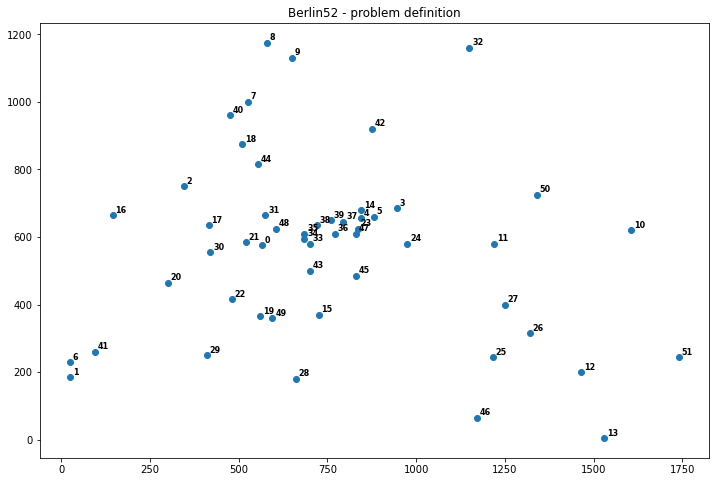

In [5]:
plt.figure(figsize=(12,8))

plt.plot(coords[:, 0], coords[:, 1], 'o')

for i in range(n):
    plt.text(coords[i, 0]+8, coords[i, 1]+8, str(i), fontdict={'weight':'bold', 'size':8})

plt.title('Berlin52 - problem definition')

plt.show()

In [180]:
def plot_path(dist_matrix, coords, route):
    plt.figure(figsize=(12,8))
    fig, ax = plt.subplots(figsize=(12,8))

    plt.plot(coords[:, 0], coords[:, 1], 'o')
    n = len(route)
    for i in range(n):
        plt.text(coords[i, 0]+8, coords[i, 1]+8, str(i), fontdict={'weight':'bold', 'size':8})

#     ax.add_line(Line2D(
#         [coords[0, 0], coords[route[0], 0]],
#         [coords[0, 1], coords[route[0], 1]],
#         linewidth=1, color='gray'))
#     plt.text((coords[0, 0] + coords[route[0], 0])/2 + 6,
#              (coords[0, 1] + coords[route[0], 1])/2 + 6,
#              '%d' % dist_matrix[0, route[0]], fontdict={'weight':'normal', 'size':7})
    for i in range(1, len(route)):
        ax.add_line(Line2D(
            [coords[route[i-1], 0], coords[route[i], 0]],
            [coords[route[i-1], 1], coords[route[i], 1]],
            linewidth=1, color='gray'))
        plt.text((coords[route[i-1], 0] + coords[route[i], 0])/2 + 6,
                 (coords[route[i-1], 1] + coords[route[i], 1])/2 + 6,
                 '%d' % dist_matrix[route[i-1], route[i]], fontdict={'weight':'normal', 'size':7})
    ax.add_line(Line2D(
        [coords[route[-1], 0], coords[route[0], 0]],
        [coords[route[-1], 1], coords[route[0], 1]],
        linewidth=1, color='gray'))
    plt.text((coords[route[-1], 0] + coords[route[0], 0])/2 + 6,
             (coords[route[-1], 1] + coords[route[0], 1])/2 + 6,
             '%d' % dist_matrix[route[-1], 0], fontdict={'weight':'normal', 'size':7})

    plt.title('Solution')

    plt.show()

<Figure size 864x576 with 0 Axes>

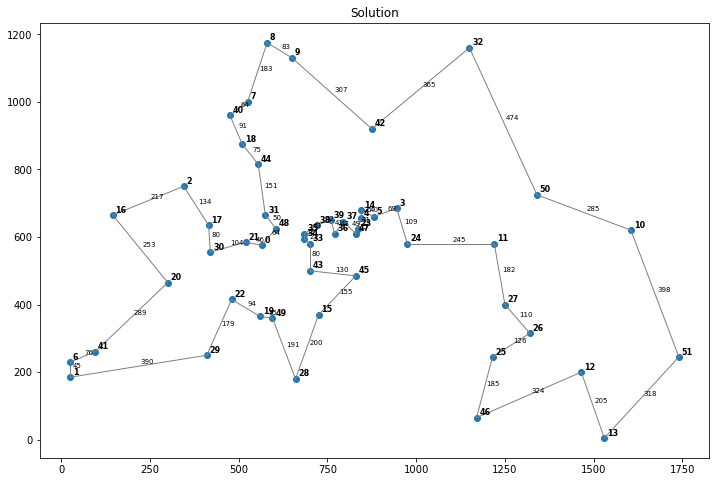

In [181]:
plot_path(A, coords, p)

## Objective function

In [97]:
def tsp_objective_function(Distance_matrix, p):
    s = 0.0
    n = len(p)
    for i in range(n):
        s += Distance_matrix[p[i-1], p[i]]
    return s

In [98]:
print(tsp_objective_function(A, p), p)

7544.365901904086 [0, 48, 31, 44, 18, 40, 7, 8, 9, 42, 32, 50, 10, 51, 13, 12, 46, 25, 26, 27, 11, 24, 3, 5, 14, 4, 23, 47, 37, 36, 39, 38, 35, 34, 33, 43, 45, 15, 28, 49, 19, 22, 29, 1, 6, 41, 20, 16, 2, 17, 30, 21]


## Random sampling

In [10]:
def random_sampling(n, Distance_matrix, T=1000000):
    t0 = time.time()

    permutations = np.empty((T, n), dtype=np.int64)
    costs = np.zeros(T)
    index_min = 0
    for i in range(T):
        permutations[i, :] = np.random.permutation(n)
        costs[i] = tsp_objective_function(Distance_matrix, permutations[i, :])
        if costs[i] < costs[index_min]:
            index_min = i

    print(time.time() - t0)
    best_perm = permutations[index_min, :]
    return best_perm, permutations, costs

In [24]:
best_perm, perms, costs = random_sampling(n, A)
print(tsp_objective_function(A, best_perm), best_perm)

36.02201867103577
21607.997460060724 [19 17 36  2 32 10 12 11 34 14  5  4 30  6 41 48 40 22 27 45 21  9  8 24
 50 28 29  7 18 33 42 26 25 51 46  1 20 31 15  3 47 39 38 35 37  0 16 44
 43 23 13 49]


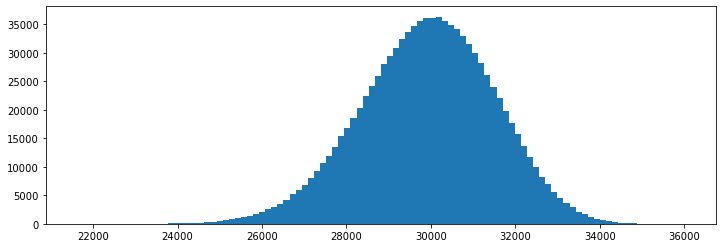

29913.774016967614 1579.4379981214288


In [25]:
plt.figure(figsize=(12,4))
plt.hist(costs, bins=100)
plt.show()
print(costs.mean(), costs.std())

## Simulated Annealing

In [99]:
def random_neighbor(p, radius):
    q = p.copy()
    n = p.shape[0]
    for r in range(radius):
        i, j = np.random.choice(n, 2, replace=False)
        q[i], q[j] = q[j], q[i]
    return q

In [100]:
def simulated_annealing(n, Distance_matrix, T=500000, radius=1, alpha=1.0):
    t0 = time.time()

    p = np.random.permutation(n)
    p_cost = tsp_objective_function(Distance_matrix, p)
    costs = np.zeros(T)
    for t in range(T):
        q = random_neighbor(p, radius)
        q_cost = tsp_objective_function(Distance_matrix, q)
        if(q_cost < p_cost):
            p, p_cost = q, q_cost
        elif(np.random.rand() < np.exp(- alpha * (q_cost - p_cost) * t/T)):
            p, p_cost = q, q_cost
        costs[t] = p_cost

    print(time.time() - t0, costs.min())
    return costs

In [101]:
costs = simulated_annealing(n, A)
print(costs.min())

27.19839310646057 8972.93224623851
8972.93224623851


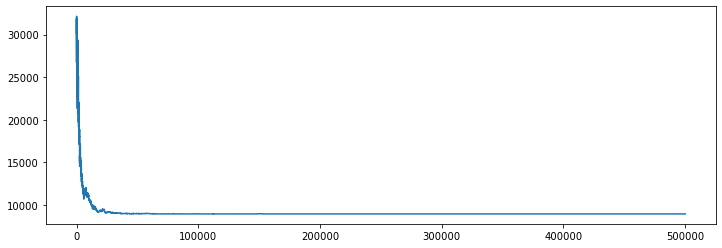

In [102]:
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [112]:
costs = simulated_annealing(n, A, T=500000, radius=2, alpha=0.5)
print(costs.min())

35.87040042877197 9024.719460321046
9024.719460321046


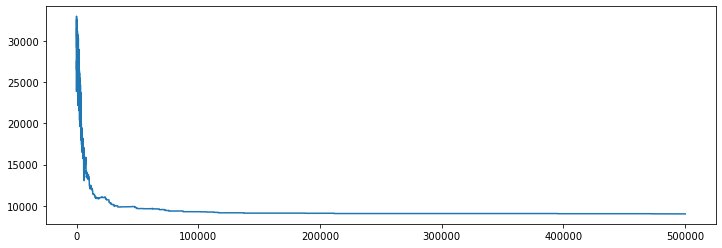

In [113]:
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [114]:
costs = simulated_annealing(n, A, T=500000, radius=3, alpha=0.3)
print(costs.min())

44.25768041610718 9398.555163288149
9398.555163288149


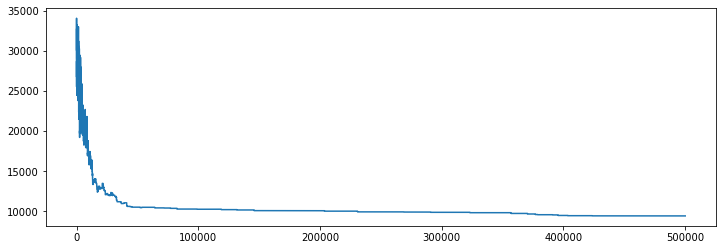

In [115]:
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [118]:
costs = simulated_annealing(n, A, T=500000, radius=1, alpha=0.5)
print(costs.min())

29.847508907318115 8223.342406959446
8223.342406959446


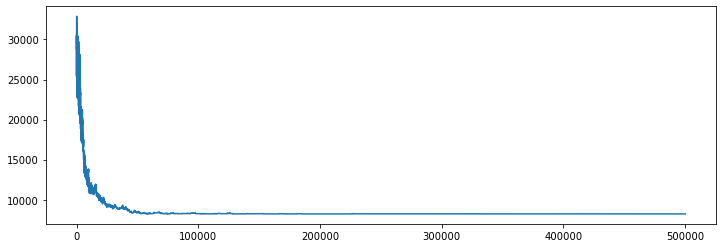

In [119]:
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

## SGA-PMX

In [13]:
def PMX(P1, P2):
    x = np.random.choice(range(P1.shape[0]), size=2, replace=False)
    a, b = x.min(), x.max()
    x = np.random.choice(range(3), size=1, replace=False)
    if x == 0:
        b, a = a, 0
    elif x == 2:
        a, b = b, P1.shape[0]
    O1 = P1.copy()
    O2 = P2.copy()
    O1[a:b] = P2[a:b]
    O2[a:b] = P1[a:b]
    dict_P1_to_P2 = {P1[i]:P2[i] for i in range(a, b)}
    dict_P2_to_P1 = {P2[i]:P1[i] for i in range(a, b)}
    for i in range(0, a):
        while O1[i] in dict_P2_to_P1:
            O1[i] = dict_P2_to_P1[O1[i]]
        while O2[i] in dict_P1_to_P2:
            O2[i] = dict_P1_to_P2[O2[i]]
    for i in range(b, P1.shape[0]):
        while O1[i] in dict_P2_to_P1:
            O1[i] = dict_P2_to_P1[O1[i]]
        while O2[i] in dict_P1_to_P2:
            O2[i] = dict_P1_to_P2[O2[i]]
    return O1, O2

In [103]:
def reverse_sequence_mutation(p):
    a = np.random.choice(p.shape[0], 2, False)
    i, j = a.min(), a.max()
    q = p.copy()
    q[i:j+1] = q[i:j+1][::-1]
    return q

In [140]:
def SGA_PMX(n, Distance_matrix, population_size=500, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250):

    chromosome_length = n
    number_of_offspring = population_size
    time0 = time.time()

    best_objective_value = np.Inf
    best_chromosome = np.zeros((1, chromosome_length))
    
    hist_of_best_objectives = np.zeros(number_of_iterations)

    # generating an initial population
    current_population = np.zeros((population_size, chromosome_length), dtype=np.int64)
    for i in range(population_size):
        current_population[i, :] = np.random.permutation(chromosome_length)

    # evaluating the objective function on the current population
    objective_values = np.zeros(population_size)
    for i in range(population_size):
        objective_values[i] = tsp_objective_function(Distance_matrix, current_population[i, :])

    for t in range(number_of_iterations):

        # selecting the parent indices by the roulette wheel method
        fitness_values = objective_values.max() - objective_values
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = np.ones(population_size) / population_size
        parent_indices = np.random.choice(population_size, number_of_offspring, True, fitness_values).astype(np.int64)

        # creating the children population
        children_population = np.zeros((number_of_offspring, chromosome_length), dtype=np.int64)
        for i in range(int(number_of_offspring/2)):
            if np.random.random() < crossover_probability:
                children_population[2*i, :], children_population[2*i+1, :] = PMX(current_population[parent_indices[2*i], :].copy(), current_population[parent_indices[2*i+1], :].copy())
            else:
                children_population[2*i, :], children_population[2*i+1, :] = current_population[parent_indices[2*i], :].copy(), current_population[parent_indices[2*i+1]].copy()
        if np.mod(number_of_offspring, 2) == 1:
            children_population[-1, :] = current_population[parent_indices[-1], :]

        # mutating the children population
        for i in range(number_of_offspring):
            if np.random.random() < mutation_probability:
                children_population[i, :] = reverse_sequence_mutation(children_population[i, :])

        # evaluating the objective function on the children population
        children_objective_values = np.zeros(number_of_offspring)
        for i in range(number_of_offspring):
            children_objective_values[i] = tsp_objective_function(Distance_matrix, children_population[i, :])

        # replacing the current population by (Mu + Lambda) Replacement
        objective_values = np.hstack([objective_values, children_objective_values])
        current_population = np.vstack([current_population, children_population])

        I = np.argsort(objective_values)
        current_population = current_population[I[:population_size], :]
        objective_values = objective_values[I[:population_size]]
        
        hist_of_best_objectives[t] = objective_values[0]
        # recording some statistics
        if best_objective_value > objective_values[0]:
            best_objective_value = objective_values[0]
            best_chromosome = current_population[0, :]

#         print('%3d %14.8f %12.8f %12.8f %12.8f %12.8f' % (t, time.time() - time0, objective_values.min(), objective_values.mean(), objective_values.max(), objective_values.std()))
    return best_chromosome, hist_of_best_objectives

In [104]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.12465882 24173.28092218 28410.00250262 29744.24074044 1032.89503028
  1     0.20943213 21911.04556213 27337.34864363 28493.61491141 937.60504609
  2     0.29122066 21911.04556213 26443.88528488 27515.26349683 892.30662057
  3     0.37603521 21567.65716995 25701.08856178 26705.84560289 880.17516716
  4     0.45884323 21456.78929931 25034.96395992 26053.70352577 845.96253885
  5     0.53866935 20217.23922544 24358.48731211 25334.97505923 822.84942944
  6     0.62245035 20217.23922544 23712.69280280 24684.96173998 822.22144921
  7     0.70323348 19672.34774210 23058.26637434 24115.94403945 745.19660734
  8     0.78507423 19672.34774210 22449.02590479 23272.70505217 613.19679945
  9     0.86585665 19672.34774210 21911.95956554 22594.69541606 536.70267959
 10     0.94490504 18639.35397646 21447.77116140 22022.73974131 524.31838746
 11     1.02590394 18639.35397646 21004.86656219 21652.86980658 520.82243499
 12     1.10898471 18330.53863213 20611.14610585 21222.18503556 478.4047629

111     8.89841366 7989.16669704 7989.16669704 7989.16669704   0.00000000
112     8.97629666 7989.16669704 7989.16669704 7989.16669704   0.00000000
113     9.05345559 7989.16669704 7989.16669704 7989.16669704   0.00000000
114     9.13024902 7989.16669704 7989.16669704 7989.16669704   0.00000000
115     9.21602106 7989.16669704 7989.16669704 7989.16669704   0.00000000
116     9.29477644 7896.91711006 7989.07444745 7989.16669704   2.91572912
117     9.38056660 7896.91711006 7917.60638967 7989.16669704  38.33985321
118     9.45936632 7896.91711006 7896.91711006 7896.91711006   0.00000000
119     9.53716707 7896.91711006 7896.91711006 7896.91711006   0.00000000
120     9.62190199 7896.91711006 7896.91711006 7896.91711006   0.00000000
121     9.70172381 7896.91711006 7896.91711006 7896.91711006   0.00000000
122     9.78050971 7896.91711006 7896.91711006 7896.91711006   0.00000000
123     9.86130285 7896.91711006 7896.91711006 7896.91711006   0.00000000
124     9.93909478 7896.91711006 7896.

224    18.02955317 7896.91711006 7896.91711006 7896.91711006   0.00000000
225    18.10635519 7896.91711006 7896.91711006 7896.91711006   0.00000000
226    18.18477345 7896.91711006 7896.91711006 7896.91711006   0.00000000
227    18.26256347 7896.91711006 7896.91711006 7896.91711006   0.00000000
228    18.34033275 7896.91711006 7896.91711006 7896.91711006   0.00000000
229    18.41738701 7896.91711006 7896.91711006 7896.91711006   0.00000000
230    18.49820542 7896.91711006 7896.91711006 7896.91711006   0.00000000
231    18.57599592 7896.91711006 7896.91711006 7896.91711006   0.00000000
232    18.65574932 7896.91711006 7896.91711006 7896.91711006   0.00000000
233    18.73852849 7896.91711006 7896.91711006 7896.91711006   0.00000000
234    18.82130623 7896.91711006 7896.91711006 7896.91711006   0.00000000
235    18.90013027 7896.91711006 7896.91711006 7896.91711006   0.00000000
236    18.97692466 7896.91711006 7896.91711006 7896.91711006   0.00000000
237    19.05571342 7896.91711006 7896.

7896.917110060427 [29  1  6 41 20 30 17 16  2 21  0 31 44 18 40  7  8  9 42 32 50 10 51 13
 12 46 25 26 27 11 24  3  5 14  4 23 47 45 36 37 39 38 35 48 34 33 43 15
 28 49 19 22]


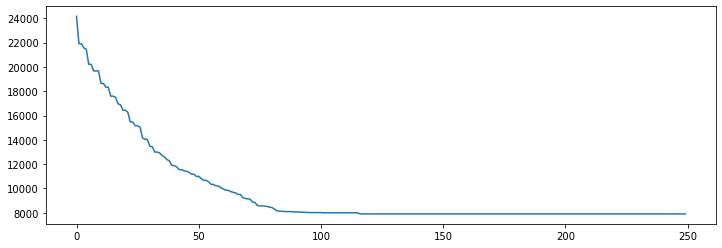

In [107]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [104]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.11438799 25105.62447784 28420.96815940 29714.30070998 966.34048960
  1     0.19903684 23367.18599715 27368.89448792 28500.64375883 893.74342422
  2     0.26809597 22978.44889195 26541.31682389 27558.33975542 804.71877651
  3     0.35236287 21793.47704440 25844.51451110 26796.39721928 772.74531788
  4     0.43703723 21793.47704440 25265.71510784 26157.92978682 754.55739376
  5     0.52167964 20898.08989106 24675.08342560 25582.89160759 771.99879941
  6     0.59981847 20255.15858329 24142.12621523 25076.45568757 767.72563685
  7     0.68450141 20255.15858329 23655.68530720 24548.49684540 773.18455617
  8     0.76918364 20255.15858329 23098.82324841 24038.48407334 813.42456262
  9     0.85387063 19897.94672806 22531.80694314 23524.45889341 783.39973084
 10     0.92290044 18991.34688672 22047.04193718 22980.24144859 729.70728029
 11     1.01663184 18991.34688672 21628.29874747 22500.92144601 655.06648108
 12     1.10128331 18615.53251450 21277.33391464 22054.14469268 595.25243831

111     8.94293785 7861.30624021 7861.30624021 7861.30624021   0.00000000
112     9.02107954 7861.30624021 7861.30624021 7861.30624021   0.00000000
113     9.10575867 7861.30624021 7861.30624021 7861.30624021   0.00000000
114     9.17623758 7861.30624021 7861.30624021 7861.30624021   0.00000000
115     9.24375844 7861.30624021 7861.30624021 7861.30624021   0.00000000
116     9.32190204 7844.21552542 7861.28914950 7861.30624021   0.54018556
117     9.40774417 7844.21552542 7848.36856911 7861.30624021   7.33012370
118     9.47530055 7844.21552542 7844.21552542 7844.21552542   0.00000000
119     9.55998635 7844.21552542 7844.21552542 7844.21552542   0.00000000
120     9.63809037 7844.21552542 7844.21552542 7844.21552542   0.00000000
121     9.70711541 7844.21552542 7844.21552542 7844.21552542   0.00000000
122     9.79179668 7844.21552542 7844.21552542 7844.21552542   0.00000000
123     9.86085057 7844.21552542 7844.21552542 7844.21552542   0.00000000
124     9.93895745 7844.21552542 7844.

222    17.59551620 7844.21552542 7844.21552542 7844.21552542   0.00000000
223    17.68011498 7844.21552542 7844.21552542 7844.21552542   0.00000000
224    17.75824761 7844.21552542 7844.21552542 7844.21552542   0.00000000
225    17.82728386 7844.21552542 7844.21552542 7844.21552542   0.00000000
226    17.91196203 7844.21552542 7844.21552542 7844.21552542   0.00000000
227    17.99664259 7844.21552542 7844.21552542 7844.21552542   0.00000000
228    18.08126593 7844.21552542 7844.21552542 7844.21552542   0.00000000
229    18.15940261 7844.21552542 7844.21552542 7844.21552542   0.00000000
230    18.22846437 7844.21552542 7844.21552542 7844.21552542   0.00000000
231    18.31314325 7844.21552542 7844.21552542 7844.21552542   0.00000000
232    18.38220358 7844.21552542 7844.21552542 7844.21552542   0.00000000
233    18.46684408 7844.21552542 7844.21552542 7844.21552542   0.00000000
234    18.54498672 7844.21552542 7844.21552542 7844.21552542   0.00000000
235    18.62967014 7844.21552542 7844.

7844.215525418005 [ 7  8  9 42 32 50 10 51 13 12 46 25 26 27 11 24  3  5 14  4 23 47 45 36
 37 39 38 35 34 33 43 15 28 49 19 29 22 21  0 48 31 17 30 20 41  1  6 16
  2 44 18 40]


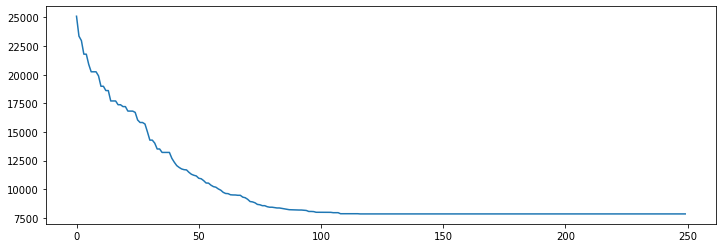

In [105]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [110]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.30, number_of_iterations=250)

  0     0.12961793 23417.22810524 28354.69485730 29776.00197054 1082.75562975
  1     0.21439099 23417.22810524 27195.12436271 28400.06895390 988.49430526
  2     0.29819918 22898.02746405 26266.28695671 27355.83752477 875.54856113
  3     0.38294005 21936.75787795 25500.31039833 26481.61223261 771.20944280
  4     0.46969175 21276.22602487 24885.87540099 25814.28505317 709.89013963
  5     0.55150628 21276.22602487 24383.70420535 25209.42898675 656.07105566
  6     0.63826442 20263.78628074 23918.39828243 24720.24060306 649.88099195
  7     0.72246981 20263.78628074 23476.52585633 24268.38548734 638.44648516
  8     0.80823970 19845.12743860 23052.07289405 23864.41355530 668.01559252
  9     0.89503837 19069.56976704 22588.78434442 23404.19504224 654.33419954
 10     0.97781920 19069.56976704 22198.94647774 22951.26625654 639.83415544
 11     1.06214070 18508.44873202 21761.72385304 22540.33373312 650.96644024
 12     1.14791131 18508.44873202 21321.89892984 22083.75541321 623.6584511

108     9.00590229 8109.10574078 8122.19258137 8124.03100615   2.73269321
109     9.08565688 8103.58034734 8118.48853018 8119.96333704   2.32843978
110     9.16747022 8103.58034734 8115.67458249 8118.50561271   4.51654349
111     9.24825287 8087.60137877 8108.58003846 8118.50561271   2.32333235
112     9.33003426 8087.60137877 8107.54208270 8109.10574078   2.57232195
113     9.40679646 8082.07598534 8103.48561938 8109.10574078   3.12169543
114     9.48362494 8082.07598534 8101.52563446 8103.58034734   6.11580182
115     9.56042504 8082.07598534 8087.23807142 8103.58034734   8.23711045
116     9.64120197 8082.07598534 8082.07598534 8082.07598534   0.00000000
117     9.71899867 8082.07598534 8082.07598534 8082.07598534   0.00000000
118     9.79881787 8082.07598534 8082.07598534 8082.07598534   0.00000000
119     9.87478757 8082.07598534 8082.07598534 8082.07598534   0.00000000
120     9.95280647 8082.07598534 8082.07598534 8082.07598534   0.00000000
121    10.02988052 8082.07598534 8082.

220    18.07382894 8082.07598534 8082.07598534 8082.07598534   0.00000000
221    18.15560961 8082.07598534 8082.07598534 8082.07598534   0.00000000
222    18.23539615 8082.07598534 8082.07598534 8082.07598534   0.00000000
223    18.31323647 8082.07598534 8082.07598534 8082.07598534   0.00000000
224    18.39105034 8082.07598534 8082.07598534 8082.07598534   0.00000000
225    18.47082853 8082.07598534 8082.07598534 8082.07598534   0.00000000
226    18.55418134 8082.07598534 8082.07598534 8082.07598534   0.00000000
227    18.63693476 8082.07598534 8082.07598534 8082.07598534   0.00000000
228    18.71827054 8082.07598534 8082.07598534 8082.07598534   0.00000000
229    18.80145979 8082.07598534 8082.07598534 8082.07598534   0.00000000
230    18.87928295 8082.07598534 8082.07598534 8082.07598534   0.00000000
231    18.95711017 8082.07598534 8082.07598534 8082.07598534   0.00000000
232    19.03889656 8082.07598534 8082.07598534 8082.07598534   0.00000000
233    19.11668348 8082.07598534 8082.

8082.075985339652 [25 46 28 49 19 22 29  1  6 41 20 30 16  2 17 21  0 48 31 44 18 40  7  8
  9 32 42 14 37 36 39 38 35 34 33 43 15 45 47 23  4  5  3 24 27 11 50 10
 51 13 12 26]


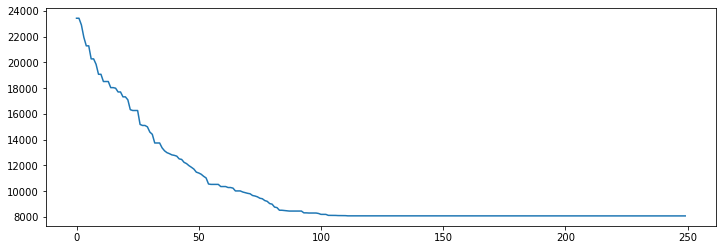

In [111]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [116]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.85, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.11971688 23488.96031336 28345.71537417 29725.73962386 1113.60401737
  1     0.19850373 22575.90323345 27181.81222704 28411.66389038 966.19797158
  2     0.27729487 22287.93149535 26211.18595992 27320.64306341 914.00986223
  3     0.35832572 21836.85922569 25362.32699991 26424.15392375 902.29726781
  4     0.43843627 21444.94871159 24551.30391857 25637.03247175 836.23368906
  5     0.51746035 21322.98257102 23830.67133435 24787.03285697 743.38063399
  6     0.59841204 21145.27891122 23186.17545579 24008.56442184 614.92767136
  7     0.67620420 20243.48521764 22653.43606736 23433.16173100 535.32285091
  8     0.75526547 19368.82138612 22219.07762797 22771.78447516 468.92998787
  9     0.83765316 19009.53969906 21843.15169368 22437.17375658 515.19552499
 10     0.91444612 18579.81808735 21436.40528279 22075.03794555 549.66661586
 11     0.99426603 18579.81808735 21035.22540474 21686.16939093 562.10044605
 12     1.07804227 18146.98213116 20586.97426751 21311.80896006 561.8990379

111     8.82515526 8055.60563621 8123.47950678 8155.04440784  16.98533717
112     8.89899135 8018.87880361 8108.09226542 8118.95852371  15.36973228
113     8.97478557 8013.19624591 8085.10851382 8113.27596602  19.96718025
114     9.05212164 7972.35792627 8063.13526828 8092.56067299  18.48217448
115     9.12492156 7972.35792627 8045.41290239 8061.28819391  18.58562364
116     9.19872141 7972.35792627 8020.46811586 8050.15128270   9.86538218
117     9.27449417 7961.92924039 8013.90832838 8018.87880361  10.45481603
118     9.35031891 7949.83821765 7994.87386050 8013.19624591  18.65686987
119     9.42412639 7949.83821765 7973.88020186 7978.04048396   4.63378190
120     9.50191903 7936.51855712 7968.70050016 7972.35792627   7.26561840
121     9.57871413 7921.15742144 7955.80703826 7972.35792627   9.56473907
122     9.65309119 7921.15742144 7946.89042702 7956.24668269   8.35499580
123     9.72788644 7921.15742144 7936.70092798 7949.83821765   6.15102807
124     9.80764532 7921.15742144 7932.

222    17.23071671 7916.23430397 7916.23430397 7916.23430397   0.00000000
223    17.30355835 7916.23430397 7916.23430397 7916.23430397   0.00000000
224    17.37836027 7916.23430397 7916.23430397 7916.23430397   0.00000000
225    17.45315361 7916.23430397 7916.23430397 7916.23430397   0.00000000
226    17.52796149 7916.23430397 7916.23430397 7916.23430397   0.00000000
227    17.60131145 7916.23430397 7916.23430397 7916.23430397   0.00000000
228    17.67607617 7916.23430397 7916.23430397 7916.23430397   0.00000000
229    17.75031304 7916.23430397 7916.23430397 7916.23430397   0.00000000
230    17.82547998 7916.23430397 7916.23430397 7916.23430397   0.00000000
231    17.90128064 7916.23430397 7916.23430397 7916.23430397   0.00000000
232    17.97507977 7916.23430397 7916.23430397 7916.23430397   0.00000000
233    18.04788733 7916.23430397 7916.23430397 7916.23430397   0.00000000
234    18.12468362 7916.23430397 7916.23430397 7916.23430397   0.00000000
235    18.19848204 7916.23430397 7916.

7916.234303970837 [38 39 36 37 47 23  4 14  5  3 24 11 27 26 25 46 12 13 51 10 50 32 42  9
  8  7 40 18 44 17  2 16  6  1 41 29 20 30 21  0 22 19 49 28 15 45 43 33
 34 35 48 31]


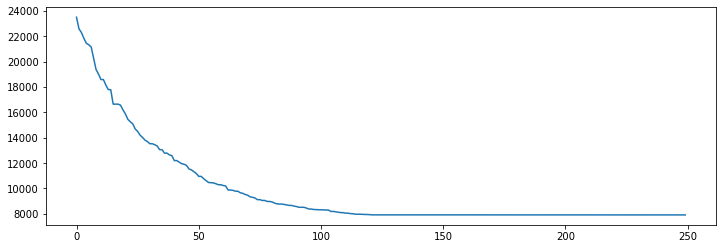

In [117]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [128]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.13309216 24356.14277859 28401.29162365 29732.68885797 999.89984056
  1     0.21686578 22967.97138054 27331.84890649 28460.59494292 906.00539391
  2     0.30067515 22857.92610611 26511.33795158 27529.09086829 833.68416808
  3     0.38345599 22663.82815790 25768.96629129 26783.76805523 805.79379681
  4     0.47019410 22188.78033762 25085.16496279 25992.80890725 757.40966075
  5     0.55300713 21680.51289031 24492.53727434 25400.20031943 707.89465983
  6     0.63635302 21324.34060551 23972.17083263 24792.65715047 689.38796600
  7     0.72212195 20585.02317066 23492.45690256 24316.85354257 685.50013956
  8     0.80492520 20180.69758404 22955.00312348 23812.31306027 670.87831897
  9     0.88867593 19520.98637653 22427.01497592 23240.01483377 631.99628134
 10     0.97248435 18782.01751460 21913.19926506 22690.74297089 630.68713717
 11     1.05326748 18782.01751460 21373.92458139 22154.11058720 648.04100363
 12     1.13604736 18630.29666102 20890.41615461 21658.10463167 636.18429675

111     8.95252538 8010.65262898 8010.65262898 8010.65262898   0.00000000
112     9.02832341 8010.65262898 8010.65262898 8010.65262898   0.00000000
113     9.10412574 8010.65262898 8010.65262898 8010.65262898   0.00000000
114     9.17991734 8010.65262898 8010.65262898 8010.65262898   0.00000000
115     9.25372243 8010.65262898 8010.65262898 8010.65262898   0.00000000
116     9.32752395 8010.65262898 8010.65262898 8010.65262898   0.00000000
117     9.40431714 8010.65262898 8010.65262898 8010.65262898   0.00000000
118     9.48011637 7994.27887828 8010.63625523 8010.65262898   0.51752450
119     9.55491424 7994.27887828 7998.55242722 8010.65262898   7.19102248
120     9.63071251 7994.27887828 7994.27887828 7994.27887828   0.00000000
121     9.70850039 7994.27887828 7994.27887828 7994.27887828   0.00000000
122     9.78330541 7994.27887828 7994.27887828 7994.27887828   0.00000000
123     9.86113286 7994.27887828 7994.27887828 7994.27887828   0.00000000
124     9.93593264 7994.27887828 7994.

222    17.45476413 7993.98256894 7993.98256894 7993.98256894   0.00000000
223    17.53056121 7993.98256894 7993.98256894 7993.98256894   0.00000000
224    17.60664463 7993.98256894 7993.98256894 7993.98256894   0.00000000
225    17.68743157 7993.98256894 7993.98256894 7993.98256894   0.00000000
226    17.76547265 7993.98256894 7993.98256894 7993.98256894   0.00000000
227    17.84347796 7993.98256894 7993.98256894 7993.98256894   0.00000000
228    17.92256355 7993.98256894 7993.98256894 7993.98256894   0.00000000
229    17.99856257 7993.98256894 7993.98256894 7993.98256894   0.00000000
230    18.07436085 7993.98256894 7993.98256894 7993.98256894   0.00000000
231    18.15040350 7993.98256894 7993.98256894 7993.98256894   0.00000000
232    18.22641492 7993.98256894 7993.98256894 7993.98256894   0.00000000
233    18.30148268 7993.98256894 7993.98256894 7993.98256894   0.00000000
234    18.37827992 7993.98256894 7993.98256894 7993.98256894   0.00000000
235    18.45432234 7993.98256894 7993.

7993.9825689361505 [33 34 35 48 31 44 18 40  7  8  9 42 32 50 11 10 51 13 12 46 25 26 27 24
  3  5 14  4 23 47 37 39 38 36 45 15 49 19 22 28 29  1  6 41 20 16  2 17
 30 21  0 43]


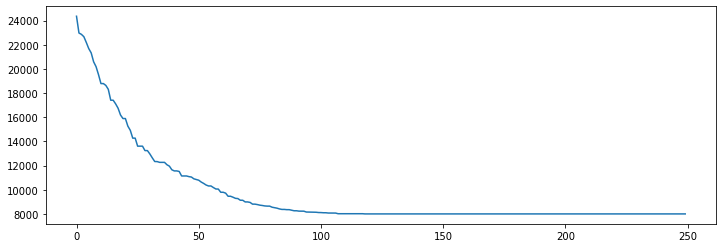

In [129]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [123]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.12146163 23816.25567439 28379.47120190 29730.47346004 1023.89334583
  1     0.20523906 22830.11694093 27272.35450779 28441.49677027 941.47726110
  2     0.29100966 22190.83630518 26370.50908288 27471.34093505 910.63473108
  3     0.37777948 22162.14525497 25594.12134774 26672.45569419 872.97318174
  4     0.46155620 21750.41892889 24867.54244484 25874.50279043 824.80121180
  5     0.54932189 21211.58250749 24252.17644444 25219.57258142 784.52986273
  6     0.63608742 20044.91219273 23662.62718912 24607.64371274 727.21455366
  7     0.72143912 18630.20420067 23142.53489181 23982.56356225 667.84360209
  8     0.80678344 18630.20420067 22656.46962199 23480.41965312 683.78268565
  9     0.89156842 17816.33827308 22165.67298188 22953.19336888 675.53629796
 10     0.97832632 17816.33827308 21645.42605822 22491.27863761 783.61489549
 11     1.06217051 17053.04143615 21094.52840253 22034.26456075 858.44068696
 12     1.15090346 16663.08432341 20364.56850455 21467.96483571 896.9064949

108     8.94164181 7912.54803386 8004.93305204 8010.20137427  11.89069388
109     9.01982474 7890.99834307 7985.11445178 8010.20137427  18.04045147
110     9.09762096 7890.99834307 7971.30655723 7988.65168348  18.94553160
111     9.17790937 7838.94185019 7950.43181004 7967.92964765  16.24619169
112     9.25570273 7838.94185019 7937.02922669 7954.76139848  21.20274719
113     9.33349252 7838.94185019 7908.56088203 7912.54803386  13.60296671
114     9.41327929 7838.94185019 7871.82454196 7912.54803386  29.10395791
115     9.49107599 7838.94185019 7839.73909809 7860.49154099   4.06729542
116     9.56786585 7838.94185019 7838.94185019 7838.94185019   0.00000000
117     9.64965081 7833.41645675 7838.93632479 7838.94185019   0.17464090
118     9.72943735 7833.12014741 7834.85276274 7838.94185019   2.42382050
119     9.80822277 7833.12014741 7833.41586413 7833.41645675   0.01323810
120     9.88701296 7833.12014741 7833.18978010 7833.41645675   0.12563481
121     9.97075582 7833.12014741 7833.

219    17.97590041 7684.58291090 7684.58291090 7684.58291090   0.00000000
220    18.08657050 7684.58291090 7684.58291090 7684.58291090   0.00000000
221    18.18533802 7684.58291090 7684.58291090 7684.58291090   0.00000000
222    18.28104973 7684.58291090 7684.58291090 7684.58291090   0.00000000
223    18.37382102 7684.58291090 7684.58291090 7684.58291090   0.00000000
224    18.46758270 7684.58291090 7684.58291090 7684.58291090   0.00000000
225    18.55837917 7684.58291090 7684.58291090 7684.58291090   0.00000000
226    18.65412402 7684.58291090 7684.58291090 7684.58291090   0.00000000
227    18.74588037 7684.58291090 7684.58291090 7684.58291090   0.00000000
228    18.83899069 7684.58291090 7684.58291090 7684.58291090   0.00000000
229    18.93400908 7684.58291090 7684.58291090 7684.58291090   0.00000000
230    19.02994156 7684.58291090 7684.58291090 7684.58291090   0.00000000
231    19.11996508 7684.58291090 7684.58291090 7684.58291090   0.00000000
232    19.21499419 7684.58291090 7684.

7684.582910903148 [ 3 24 11 27 26 25 46 12 13 51 10 50 32 42  9  8  7 40 18 44 31 48  0 21
 30 20 17  2 16 41  6  1 29 22 19 49 28 15 45 43 33 34 35 38 39 36 37 47
 23  4 14  5]


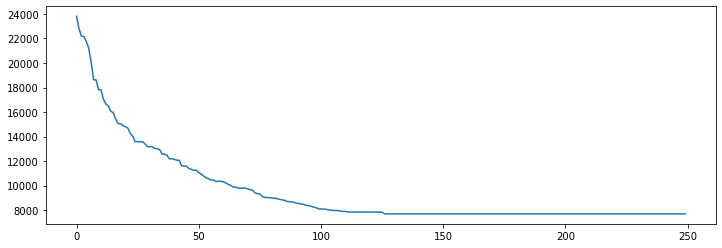

In [124]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [126]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.12965465 23897.50061438 28472.49541673 29778.17485899 1000.11288213
  1     0.21284413 22727.63244634 27409.72680645 28493.30577875 894.05361564
  2     0.29561925 21792.60219562 26488.27730950 27534.44944785 913.84922936
  3     0.37939382 21205.60356486 25607.22542234 26703.40909481 926.97305432
  4     0.46317029 20699.50522052 24843.48861513 25936.29900934 851.45940458
  5     0.54495621 20489.90250257 24252.61642052 25182.96799671 780.52113453
  6     0.62972188 20244.30466992 23703.27328255 24597.60274502 769.14150314
  7     0.71250296 19401.25233353 23156.60807983 24114.14704692 774.73147873
  8     0.79428411 19062.89926288 22632.82365436 23529.28542118 736.61566750
  9     0.88201642 18935.81464307 22156.72601472 23047.55331561 747.41390468
 10     0.96533871 18803.22121957 21646.48623679 22581.30947499 764.09472510
 11     1.04815435 18423.91149460 21155.04829672 22058.70099675 742.13389676
 12     1.13089943 18262.22805979 20656.74824878 21538.69871634 696.4805066

111     9.00959110 8332.42078835 8332.42078835 8332.42078835   0.00000000
112     9.08669043 8332.42078835 8332.42078835 8332.42078835   0.00000000
113     9.16174674 8332.42078835 8332.42078835 8332.42078835   0.00000000
114     9.23880553 8332.42078835 8332.42078835 8332.42078835   0.00000000
115     9.32058740 8332.42078835 8332.42078835 8332.42078835   0.00000000
116     9.40255952 8332.42078835 8332.42078835 8332.42078835   0.00000000
117     9.48364782 8332.42078835 8332.42078835 8332.42078835   0.00000000
118     9.55844784 8332.42078835 8332.42078835 8332.42078835   0.00000000
119     9.63524222 8332.42078835 8332.42078835 8332.42078835   0.00000000
120     9.71599364 8332.42078835 8332.42078835 8332.42078835   0.00000000
121     9.79681325 8332.42078835 8332.42078835 8332.42078835   0.00000000
122     9.87560010 8332.42078835 8332.42078835 8332.42078835   0.00000000
123     9.95236182 8332.42078835 8332.42078835 8332.42078835   0.00000000
124    10.02918911 8332.42078835 8332.

222    17.64576459 8332.42078835 8332.42078835 8332.42078835   0.00000000
223    17.72056890 8332.42078835 8332.42078835 8332.42078835   0.00000000
224    17.79736328 8332.42078835 8332.42078835 8332.42078835   0.00000000
225    17.87415767 8332.42078835 8332.42078835 8332.42078835   0.00000000
226    17.95098662 8332.42078835 8332.42078835 8332.42078835   0.00000000
227    18.02778029 8332.42078835 8332.42078835 8332.42078835   0.00000000
228    18.11056066 8332.42078835 8332.42078835 8332.42078835   0.00000000
229    18.18580818 8332.42078835 8332.42078835 8332.42078835   0.00000000
230    18.26260543 8332.42078835 8332.42078835 8332.42078835   0.00000000
231    18.33964062 8332.42078835 8332.42078835 8332.42078835   0.00000000
232    18.41472697 8332.42078835 8332.42078835 8332.42078835   0.00000000
233    18.49006510 8332.42078835 8332.42078835 8332.42078835   0.00000000
234    18.56733370 8332.42078835 8332.42078835 8332.42078835   0.00000000
235    18.64416289 8332.42078835 8332.

8332.420788345042 [12 13 51 10 11 50 32 42 14  4 37 36 39 38 35 48 31 44 18  7  9  8 40  2
 16  6  1 41 20 30 17 21  0 34 33 43 49 19 22 29 28 15 45 47 23  5  3 24
 27 26 25 46]


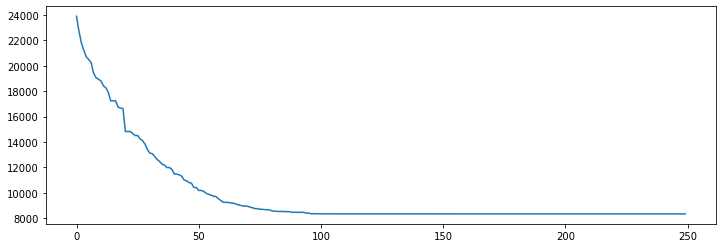

In [127]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [130]:
best_p, costs = SGA_PMX(n, A, population_size=1000, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.12463403 23165.51168030 28407.94181891 29809.35737916 1078.31969896
  1     0.21040416 23165.51168030 27273.98308846 28458.23244828 1003.89159232
  2     0.29717159 23165.51168030 26342.36359725 27481.89910017 930.23581182
  3     0.38599205 22704.69502262 25581.32676682 26606.95947378 810.86975338
  4     0.47079873 20603.30037722 24912.76612442 25897.61229934 813.96323826
  5     0.55454302 20603.30037722 24264.07048342 25249.33662016 805.76016554
  6     0.64134288 20255.06414796 23676.42476088 24597.84938711 774.88409998
  7     0.72555184 19874.18764538 23166.01084723 24052.55510954 755.85503375
  8     0.81032443 19220.65995869 22613.59913740 23536.98882685 795.93574065
  9     0.89611769 19220.65995869 22080.20739476 23053.59408903 792.85916384
 10     0.97887611 18940.60737473 21575.88018002 22525.99204245 728.72742995
 11     1.06365728 18215.76882147 21151.63551840 22051.33611879 666.30587602
 12     1.15039039 18215.76882147 20756.11969114 21522.08288981 595.892419

111     9.36976123 8629.50718582 8629.50718582 8629.50718582   0.00000000
112     9.44851756 8629.50718582 8629.50718582 8629.50718582   0.00000000
113     9.53029966 8629.50718582 8629.50718582 8629.50718582   0.00000000
114     9.61210680 8629.50718582 8629.50718582 8629.50718582   0.00000000
115     9.69286418 8629.50718582 8629.50718582 8629.50718582   0.00000000
116     9.77564263 8629.50718582 8629.50718582 8629.50718582   0.00000000
117     9.85742307 8629.50718582 8629.50718582 8629.50718582   0.00000000
118     9.93424344 8629.50718582 8629.50718582 8629.50718582   0.00000000
119    10.01291537 8629.50718582 8629.50718582 8629.50718582   0.00000000
120    10.09376502 8629.50718582 8629.50718582 8629.50718582   0.00000000
121    10.17458606 8629.50718582 8629.50718582 8629.50718582   0.00000000
122    10.26232076 8629.50718582 8629.50718582 8629.50718582   0.00000000
123    10.36271572 8629.50718582 8629.50718582 8629.50718582   0.00000000
124    10.44650602 8629.50718582 8629.

222    18.35142422 8629.50718582 8629.50718582 8629.50718582   0.00000000
223    18.42851877 8629.50718582 8629.50718582 8629.50718582   0.00000000
224    18.50658178 8629.50718582 8629.50718582 8629.50718582   0.00000000
225    18.58633351 8629.50718582 8629.50718582 8629.50718582   0.00000000
226    18.66416001 8629.50718582 8629.50718582 8629.50718582   0.00000000
227    18.74291515 8629.50718582 8629.50718582 8629.50718582   0.00000000
228    18.82273388 8629.50718582 8629.50718582 8629.50718582   0.00000000
229    18.90351963 8629.50718582 8629.50718582 8629.50718582   0.00000000
230    18.98330641 8629.50718582 8629.50718582 8629.50718582   0.00000000
231    19.06408834 8629.50718582 8629.50718582 8629.50718582   0.00000000
232    19.14686704 8629.50718582 8629.50718582 8629.50718582   0.00000000
233    19.22466111 8629.50718582 8629.50718582 8629.50718582   0.00000000
234    19.30644059 8629.50718582 8629.50718582 8629.50718582   0.00000000
235    19.38722110 8629.50718582 8629.

8629.507185819739 [ 1  6 41 16  2 44 18 40  7  8  9 42 32 50 11 24  3  5 14  4 23 47 37 36
 39 38 33 34 35 48 31 17 30 20 22 21  0 43 15 45 27 26 10 51 13 12 25 46
 28 49 19 29]


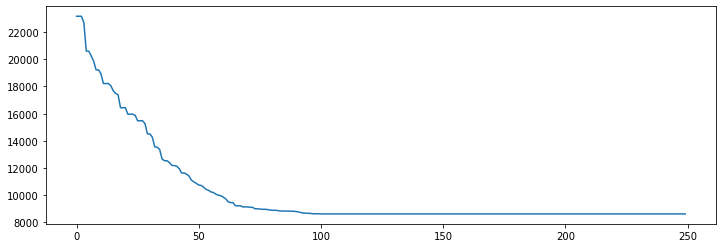

In [131]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

## d)

In [16]:
def transpose_mutation(p):
    a, b = np.random.choice(range(p.shape[0]), size=2, replace=False)
    q = p.copy()
    x = q[a]
    q[a] = q[b]
    q[b] = x
    return q

In [139]:
def SGA_trans_mut(n, Distance_matrix, population_size=500, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250):

    chromosome_length = n
    number_of_offspring = population_size
    time0 = time.time()

    best_objective_value = np.Inf
    best_chromosome = np.zeros((1, chromosome_length))
    
    hist_of_best_objectives = np.zeros(number_of_iterations)

    # generating an initial population
    current_population = np.zeros((population_size, chromosome_length), dtype=np.int64)
    for i in range(population_size):
        current_population[i, :] = np.random.permutation(chromosome_length)

    # evaluating the objective function on the current population
    objective_values = np.zeros(population_size)
    for i in range(population_size):
        objective_values[i] = tsp_objective_function(Distance_matrix, current_population[i, :])

    for t in range(number_of_iterations):

        # selecting the parent indices by the roulette wheel method
        fitness_values = objective_values.max() - objective_values
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = np.ones(population_size) / population_size
        parent_indices = np.random.choice(population_size, number_of_offspring, True, fitness_values).astype(np.int64)

        # creating the children population
        children_population = np.zeros((number_of_offspring, chromosome_length), dtype=np.int64)
        for i in range(int(number_of_offspring/2)):
            if np.random.random() < crossover_probability:
                children_population[2*i, :], children_population[2*i+1, :] = PMX(current_population[parent_indices[2*i], :].copy(), current_population[parent_indices[2*i+1], :].copy())
            else:
                children_population[2*i, :], children_population[2*i+1, :] = current_population[parent_indices[2*i], :].copy(), current_population[parent_indices[2*i+1]].copy()
        if np.mod(number_of_offspring, 2) == 1:
            children_population[-1, :] = current_population[parent_indices[-1], :]

        # mutating the children population
        for i in range(number_of_offspring):
            if np.random.random() < mutation_probability:
                children_population[i, :] = transpose_mutation(children_population[i, :])

        # evaluating the objective function on the children population
        children_objective_values = np.zeros(number_of_offspring)
        for i in range(number_of_offspring):
            children_objective_values[i] = tsp_objective_function(Distance_matrix, children_population[i, :])

        # replacing the current population by (Mu + Lambda) Replacement
        objective_values = np.hstack([objective_values, children_objective_values])
        current_population = np.vstack([current_population, children_population])

        I = np.argsort(objective_values)
        current_population = current_population[I[:population_size], :]
        objective_values = objective_values[I[:population_size]]
        
        hist_of_best_objectives[t] = objective_values[0]
        # recording some statistics
        if best_objective_value > objective_values[0]:
            best_objective_value = objective_values[0]
            best_chromosome = current_population[0, :]

#         print('%3d %14.8f %12.8f %12.8f %12.8f %12.8f' % (t, time.time() - time0, objective_values.min(), objective_values.mean(), objective_values.max(), objective_values.std()))
    return best_chromosome, hist_of_best_objectives

In [133]:
best_p, costs = SGA_trans_mut(n, A, population_size=1000, crossover_probability=0.95, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.14697719 25179.56863252 28377.22191923 29723.01560727 976.16772142
  1     0.24490404 23775.55582332 27354.34869419 28425.91859554 828.50829312
  2     0.34792304 22071.62341475 26576.82866608 27514.28526812 783.02488441
  3     0.45069051 21899.65760238 25909.25840461 26854.08977568 794.53780334
  4     0.55292845 21627.89963534 25333.89445173 26275.80195179 788.16284481
  5     0.64220500 21627.89963534 24754.61816944 25699.58807541 789.04804761
  6     0.74444222 19635.32422049 24191.45570590 25154.73399378 804.98909981
  7     0.84568214 19635.32422049 23641.77243385 24583.57583763 794.12616295
  8     0.94840765 18704.41198812 23093.67421928 24086.54531507 819.05367021
  9     1.05113363 18097.32651957 22569.40448954 23535.19360998 840.30895886
 10     1.15186429 18079.16802725 21960.03436355 22997.09800819 871.21708013
 11     1.25059867 17831.14952275 21359.52670644 22420.23841852 896.26017851
 12     1.35332537 16899.43263943 20744.44025337 21811.12992601 849.77261353

110    10.68864584 9062.09270287 9062.09270287 9062.09270287   0.00000000
111    10.77885604 9062.09270287 9062.09270287 9062.09270287   0.00000000
112    10.87211752 9062.09270287 9062.09270287 9062.09270287   0.00000000
113    10.96486831 9062.09270287 9062.09270287 9062.09270287   0.00000000
114    11.05861855 9062.09270287 9062.09270287 9062.09270287   0.00000000
115    11.15436268 9062.09270287 9062.09270287 9062.09270287   0.00000000
116    11.24811053 9062.09270287 9062.09270287 9062.09270287   0.00000000
117    11.34385443 9062.09270287 9062.09270287 9062.09270287   0.00000000
118    11.44159317 9062.09270287 9062.09270287 9062.09270287   0.00000000
119    11.53933334 9062.09270287 9062.09270287 9062.09270287   0.00000000
120    11.62413692 9062.09270287 9062.09270287 9062.09270287   0.00000000
121    11.72383785 9062.09270287 9062.09270287 9062.09270287   0.00000000
122    11.81710124 9062.09270287 9062.09270287 9062.09270287   0.00000000
123    11.90785646 9062.09270287 9062.

221    21.05327439 9062.09270287 9062.09270287 9062.09270287   0.00000000
222    21.14702368 9062.09270287 9062.09270287 9062.09270287   0.00000000
223    21.23977566 9062.09270287 9062.09270287 9062.09270287   0.00000000
224    21.33851075 9062.09270287 9062.09270287 9062.09270287   0.00000000
225    21.44123745 9062.09270287 9062.09270287 9062.09270287   0.00000000
226    21.54447007 9062.09270287 9062.09270287 9062.09270287   0.00000000
227    21.63227201 9062.09270287 9062.09270287 9062.09270287   0.00000000
228    21.72797966 9062.09270287 9062.09270287 9062.09270287   0.00000000
229    21.81133318 9062.09270287 9062.09270287 9062.09270287   0.00000000
230    21.90559220 9062.09270287 9062.09270287 9062.09270287   0.00000000
231    22.00732422 9062.09270287 9062.09270287 9062.09270287   0.00000000
232    22.11005378 9062.09270287 9062.09270287 9062.09270287   0.00000000
233    22.20878887 9062.09270287 9062.09270287 9062.09270287   0.00000000
234    22.30952454 9062.09270287 9062.

9062.092702868056 [32  8  9 42  3 47 36 33 34 35 38 39 37 14  5  4 23 48  0 21 30 22 19 49
 15 43 31 44 18  7 40  2 17 16 20 41  6  1 29 28 45 24 11 50 10 51 13 12
 46 25 26 27]


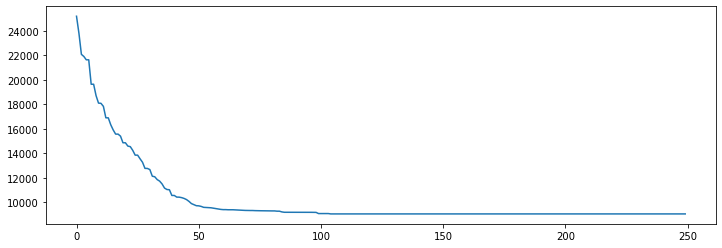

In [134]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [135]:
best_p, costs = SGA_trans_mut(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.25, number_of_iterations=250)

  0     0.14162374 24855.07426014 28591.22582270 29942.01341870 1009.65008373
  1     0.24186802 23318.85618038 27483.05630552 28588.46920783 856.20412075
  2     0.34160042 23318.85618038 26624.69317323 27665.10240311 792.75105495
  3     0.44133496 23076.03166879 25922.19977483 26864.68548636 741.30986780
  4     0.54006934 21872.20290548 25305.54552455 26184.76857513 718.58473430
  5     0.63980246 20952.31663122 24759.11320529 25598.54962592 695.48153225
  6     0.73853827 20391.66315882 24265.68700273 25112.90419895 706.48309914
  7     0.83627629 20391.66315882 23760.20555725 24645.11249530 700.80468944
  8     0.93301773 20391.66315882 23273.97973408 24106.22879055 694.14346376
  9     1.03574324 20391.66315882 22832.26568039 23660.62131001 692.38119596
 10     1.13448167 19978.55905367 22359.02669029 23220.53738093 697.51367413
 11     1.23521733 19852.51505612 21891.46380231 22730.79145431 641.02561998
 12     1.33096027 19070.69402674 21452.10660006 22217.77485181 548.1163119

109    10.28470588 9612.12059000 9612.12059000 9612.12059000   0.00000000
110    10.37646031 9612.12059000 9612.12059000 9612.12059000   0.00000000
111    10.46721745 9612.12059000 9612.12059000 9612.12059000   0.00000000
112    10.55797458 9612.12059000 9612.12059000 9612.12059000   0.00000000
113    10.64972949 9612.12059000 9612.12059000 9612.12059000   0.00000000
114    10.73948932 9612.12059000 9612.12059000 9612.12059000   0.00000000
115    10.83224106 9612.12059000 9612.12059000 9612.12059000   0.00000000
116    10.92299819 9612.12059000 9612.12059000 9612.12059000   0.00000000
117    11.01426435 9612.12059000 9612.12059000 9612.12059000   0.00000000
118    11.10502243 9612.12059000 9612.12059000 9612.12059000   0.00000000
119    11.19478559 9612.12059000 9612.12059000 9612.12059000   0.00000000
120    11.28554296 9612.12059000 9612.12059000 9612.12059000   0.00000000
121    11.37630010 9612.12059000 9612.12059000 9612.12059000   0.00000000
122    11.46956325 9612.12059000 9612.

220    20.41216469 9612.12059000 9612.12059000 9612.12059000   0.00000000
221    20.50542974 9612.12059000 9612.12059000 9612.12059000   0.00000000
222    20.60367703 9612.12059000 9612.12059000 9612.12059000   0.00000000
223    20.69346619 9612.12059000 9612.12059000 9612.12059000   0.00000000
224    20.78718686 9612.12059000 9612.12059000 9612.12059000   0.00000000
225    20.88244414 9612.12059000 9612.12059000 9612.12059000   0.00000000
226    20.97818685 9612.12059000 9612.12059000 9612.12059000   0.00000000
227    21.07492828 9612.12059000 9612.12059000 9612.12059000   0.00000000
228    21.15970039 9612.12059000 9612.12059000 9612.12059000   0.00000000
229    21.25245714 9612.12059000 9612.12059000 9612.12059000   0.00000000
230    21.35072303 9612.12059000 9612.12059000 9612.12059000   0.00000000
231    21.45245290 9612.12059000 9612.12059000 9612.12059000   0.00000000
232    21.54520297 9612.12059000 9612.12059000 9612.12059000   0.00000000
233    21.63846517 9612.12059000 9612.

9612.12059000372 [16 20 30 21 44 18  7  9  8 40  2 17 31 48 35  0 22 19 49 15 43 34 33 45
 12 13 51 10 50 11 47 36 38 39 37 23  4  5 14 42 32  3 24 27 26 25 46 28
 29  1  6 41]


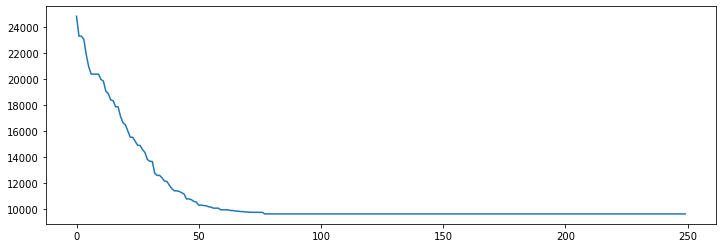

In [136]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [137]:
best_p, costs = SGA_trans_mut(n, A, population_size=1000, crossover_probability=0.90, 
            mutation_probability=0.30, number_of_iterations=250)

  0     0.12965322 23714.78160437 28499.37838471 29784.71658560 955.73947040
  1     0.21542382 23714.78160437 27487.42007291 28545.13047281 840.92621692
  2     0.30219197 22444.32761237 26651.81332525 27629.27707008 761.19778708
  3     0.38796234 21594.18313857 25975.04990780 26885.19193576 749.76041161
  4     0.47575140 21594.18313857 25362.94665619 26231.58551065 735.56832704
  5     0.55979824 21491.82358368 24790.32904077 25688.29024197 762.70700411
  6     0.64856124 20843.00918246 24205.47988106 25150.48472742 792.52196152
  7     0.73589778 20512.23710609 23651.26633070 24593.81057609 748.85272689
  8     0.82030702 20512.23710609 23139.69377526 24035.23781124 721.77410256
  9     0.91103125 19791.43563462 22657.24523735 23544.54450244 661.24832182
 10     0.99938202 19130.75292630 22204.94079547 22987.04406347 594.38666166
 11     1.08714700 19130.75292630 21810.55214268 22528.08206528 577.16134159
 12     1.17648554 19080.95011561 21438.00741884 22131.86911009 563.36599940

108     9.08884025 9182.76540949 9182.76540949 9182.76540949   0.00000000
109     9.16961479 9176.81792145 9182.75946200 9182.76540949   0.18798202
110     9.25102115 9176.81792145 9178.54685527 9182.76540949   2.69929075
111     9.33482671 9176.81792145 9176.81792145 9176.81792145   0.00000000
112     9.41561127 9174.16309927 9176.81526663 9176.81792145   0.08391086
113     9.49539852 9174.16309927 9175.00202308 9176.81792145   1.23426106
114     9.57974887 9154.29772688 9174.14323390 9174.16309927   0.62788406
115     9.66138029 9154.29772688 9160.20039730 9174.16309927   9.07587665
116     9.74318647 9154.29772688 9154.29772688 9154.29772688   0.00000000
117     9.82796621 9154.29772688 9154.29772688 9154.29772688   0.00000000
118     9.90675306 9154.29772688 9154.29772688 9154.29772688   0.00000000
119     9.98554468 9154.29772688 9154.29772688 9154.29772688   0.00000000
120    10.06533194 9154.29772688 9154.29772688 9154.29772688   0.00000000
121    10.14212656 9154.29772688 9154.

221    18.26733017 9154.29772688 9154.29772688 9154.29772688   0.00000000
222    18.34531665 9154.29772688 9154.29772688 9154.29772688   0.00000000
223    18.42736435 9154.29772688 9154.29772688 9154.29772688   0.00000000
224    18.50541210 9154.29772688 9154.29772688 9154.29772688   0.00000000
225    18.58919859 9154.29772688 9154.29772688 9154.29772688   0.00000000
226    18.66625953 9154.29772688 9154.29772688 9154.29772688   0.00000000
227    18.74631214 9154.29772688 9154.29772688 9154.29772688   0.00000000
228    18.82536912 9154.29772688 9154.29772688 9154.29772688   0.00000000
229    18.90242791 9154.29772688 9154.29772688 9154.29772688   0.00000000
230    18.98517418 9154.29772688 9154.29772688 9154.29772688   0.00000000
231    19.06426191 9154.29772688 9154.29772688 9154.29772688   0.00000000
232    19.14528131 9154.29772688 9154.29772688 9154.29772688   0.00000000
233    19.22633529 9154.29772688 9154.29772688 9154.29772688   0.00000000
234    19.30841351 9154.29772688 9154.

9154.297726877516 [24 27 26 11 50 10 51 13 12 25 46 28 19 49 15 43 33 22 29 41  1  6 16 20
 30 21  0 48 31 17  2 44 35 34 38 39 36 45 47 23 37  4 14 42 32  9  8  7
 40 18  5  3]


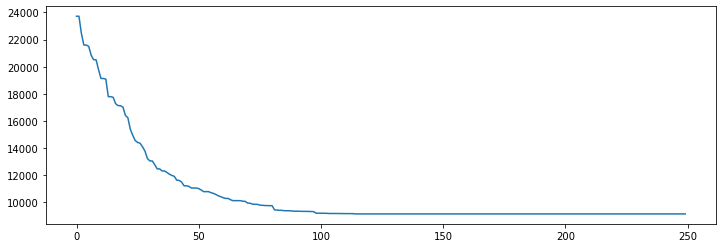

In [138]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

In [139]:
best_p, costs = SGA_trans_mut(n, A, population_size=1000, crossover_probability=0.95, 
            mutation_probability=0.35, number_of_iterations=250)

  0     0.12965202 24229.62110711 28394.73009785 29693.61488255 1006.35683096
  1     0.21941304 24005.47151230 27342.47645975 28448.15111286 904.05266431
  2     0.30917239 23448.55689137 26496.39750901 27581.97411381 846.04778224
  3     0.40192413 22032.27289176 25762.22999814 26748.57908586 789.02841264
  4     0.48972344 22032.27289176 25105.51932334 26078.01471492 784.82144544
  5     0.58146882 21417.04125512 24596.62187301 25541.96885784 744.04845538
  6     0.67123437 20946.39294135 24084.80835318 24980.94567973 746.06580239
  7     0.75999641 20727.93465177 23643.95764251 24521.81871534 724.51813043
  8     0.84879351 20117.98356431 23274.17038669 24098.00464994 679.18629436
  9     0.93639970 20071.36876454 22826.67006608 23686.92216644 671.07185297
 10     1.02572536 20071.36876454 22462.78569574 23230.55822770 612.84913826
 11     1.11392927 19549.21654017 22123.47436864 22889.00851646 592.72454007
 12     1.20496154 19268.57532870 21771.33674662 22515.41796930 584.4496792

108     9.40236735 9775.44867075 9785.64165617 9797.24934210  10.64921528
109     9.48614073 9775.44867075 9775.66645812 9775.74498009   0.13077115
110     9.56692791 9775.44867075 9775.46881978 9775.74498009   0.07459466
111     9.65031624 9775.44867075 9775.44867075 9775.44867075   0.00000000
112     9.73200631 9747.71787370 9775.39320915 9775.44867075   1.23891817
113     9.81578517 9747.71787370 9757.43520358 9775.44867075  13.22270906
114     9.90381885 9747.71787370 9747.71787370 9747.71787370   0.00000000
115     9.98859429 9747.71787370 9747.71787370 9747.71787370   0.00000000
116    10.07037592 9686.52147649 9747.65667730 9747.71787370   1.93423216
117    10.15215635 9686.52147649 9706.48533846 9747.71787370  28.63712962
118    10.23493314 9686.52147649 9686.52147649 9686.52147649   0.00000000
119    10.31571937 9686.52147649 9686.52147649 9686.52147649   0.00000000
120    10.40048647 9686.52147649 9686.52147649 9686.52147649   0.00000000
121    10.48127389 9686.52147649 9686.

219    18.71249199 9686.52147649 9686.52147649 9686.52147649   0.00000000
220    18.79430461 9686.52147649 9686.52147649 9686.52147649   0.00000000
221    18.87608624 9686.52147649 9686.52147649 9686.52147649   0.00000000
222    18.96082664 9686.52147649 9686.52147649 9686.52147649   0.00000000
223    19.04168010 9686.52147649 9686.52147649 9686.52147649   0.00000000
224    19.12445712 9686.52147649 9686.52147649 9686.52147649   0.00000000
225    19.20723581 9686.52147649 9686.52147649 9686.52147649   0.00000000
226    19.28901863 9686.52147649 9686.52147649 9686.52147649   0.00000000
227    19.37176275 9686.52147649 9686.52147649 9686.52147649   0.00000000
228    19.45422363 9686.52147649 9686.52147649 9686.52147649   0.00000000
229    19.53986311 9686.52147649 9686.52147649 9686.52147649   0.00000000
230    19.62460303 9686.52147649 9686.52147649 9686.52147649   0.00000000
231    19.70841193 9686.52147649 9686.52147649 9686.52147649   0.00000000
232    19.79019284 9686.52147649 9686.

9686.521476489319 [32 50 10 51 13 12 26 45 43 15 28 46 25 27 11 24  3 42  9  8  7 40 18  2
 16 20 41  6  1 29 47 23 37 39 38 33 34 35 48 49 19 22  0 21 30 17 44 31
 36  4 14  5]


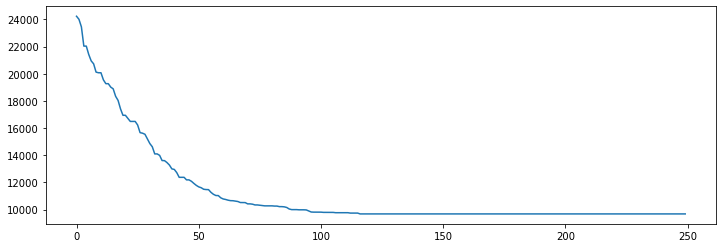

In [140]:
print(tsp_objective_function(A, best_p), best_p)
plt.figure(figsize=(12,4))
plt.plot(costs)
plt.show()

## e)

### bayg29

In [78]:
def bayg29():
    distances_string = """ 97 205 139  86  60 220  65 111 115 227  95  82 225 168 103 266 205 149 120  58 257 152  52 180 136  82  34 145
    129 103  71 105 258 154 112  65 204 150  87 176 137 142 204 148 148  49  41 211 226 116 197  89 153 124  74
    219 125 175 386 269 134 184 313 201 215 267 248 271 274 236 272 160 151 300 350 239 322  78 276 220  60
    167 182 180 162 208  39 102 227  60  86  34  96 129  69  58  60 120 119 192 114 110 192 136 173 173
     51 296 150  42 131 268  88 131 245 201 175 275 218 202 119  50 281 238 131 244  51 166  95  69
    279 114  56 150 278  46 133 266 214 162 302 242 203 146  67 300 205 111 238  98 139  52 120
    178 328 206 147 308 172 203 165 121 251 216 122 231 249 209 111 169  72 338 144 237 331
    169 151 227 133 104 242 182  84 290 230 146 165 121 270  91  48 158 200  39  64 210
    172 309  68 169 286 242 208 315 259 240 160  90 322 260 160 281  57 192 107  90
    140 195  51 117  72 104 153  93  88  25  85 152 200 104 139 154 134 149 135
    320 146  64  68 143 106  88  81 159 219  63 216 187  88 293 191 258 272
    174 311 258 196 347 288 243 192 113 345 222 144 274 124 165  71 153
    144  86  57 189 128  71  71  82 176 150  56 114 168  83 115 160
     61 165  51  32 105 127 201  36 254 196 136 260 212 258 234
    106 110  56  49  91 153  91 197 136  94 225 151 201 205
    215 159  64 126 128 190  98  53  78 218  48 127 214
     61 155 157 235  47 305 243 186 282 261 300 252
    105 100 176  66 253 183 146 231 203 239 204
    113 152 127 150 106  52 235 112 179 221
     79 163 220 119 164 135 152 153 114
    236 201  90 195  90 127  84  91
    273 226 148 296 238 291 269
    112 130 286  74 155 291
    130 178  38  75 180
    281 120 205 270
    213 145  36
     94 217
    162"""
    coords_string = """1    1150.0  1760.0
       2     630.0  1660.0
       3      40.0  2090.0
       4     750.0  1100.0
       5     750.0  2030.0
       6    1030.0  2070.0
       7    1650.0   650.0
       8    1490.0  1630.0
       9     790.0  2260.0
      10     710.0  1310.0
      11     840.0   550.0
      12    1170.0  2300.0
      13     970.0  1340.0
      14     510.0   700.0
      15     750.0   900.0
      16    1280.0  1200.0
      17     230.0   590.0
      18     460.0   860.0
      19    1040.0   950.0
      20     590.0  1390.0
      21     830.0  1770.0
      22     490.0   500.0
      23    1840.0  1240.0
      24    1260.0  1500.0
      25    1280.0   790.0
      26     490.0  2130.0
      27    1460.0  1420.0
      28    1260.0  1910.0
      29     360.0  1980.0"""
    best_perm_string = """1
    28
    6
    12
    9
    26
    3
    29
    5
    21
    2
    20
    10
    4
    15
    18
    14
    17
    22
    11
    19
    25
    7
    23
    8
    27
    16
    13
    24"""
    n = 29
    distance_matrix = np.zeros((n, n))
    it = iter(distances_string.split())
    for i in range(n-1):
        for k in range(n-1 - i):
            distance_matrix[i, k+i+1] = float(next(it))
    coords = np.zeros((n, 2))
    it = iter(coords_string.split())
    for i in range(n):
        next(it)
        coords[i, 0] = float(next(it))
        coords[i, 1] = float(next(it))
    best_perm = np.zeros(n, dtype="i")
    it = iter(best_perm_string.split())
    for i in range(n):
        best_perm[i] = int(next(it)) - 1
    return distance_matrix + distance_matrix.T, best_perm, coords

In [79]:
bayg29_dist, bayg29_best_perm, bayg29_coords = bayg29()

<Figure size 864x576 with 0 Axes>

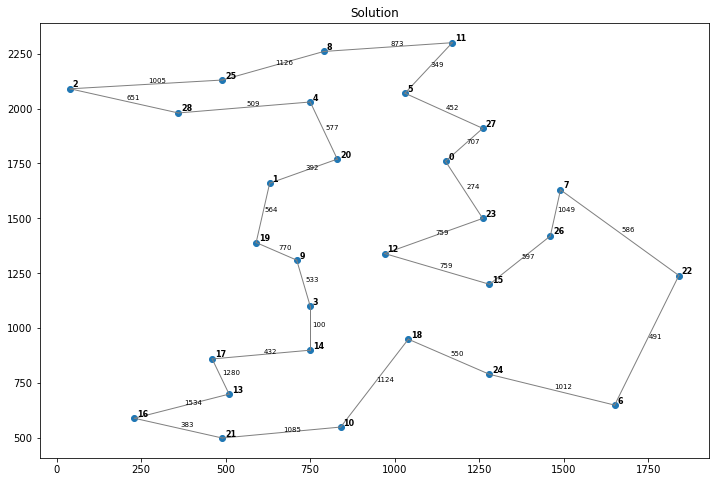

[ 0 27  5 11  8 25  2 28  4 20  1 19  9  3 14 17 13 16 21 10 18 24  6 22
  7 26 15 12 23] 1610.0


In [162]:
plot_path(bayg29_coords, bayg29_best_perm)
print(bayg29_best_perm, tsp_objective_function(bayg29_dist, bayg29_best_perm))

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1656.0 
 best_permutation: [12 23  7  0 27  5 11  8  4 25  2 28 20  1 19  9  3 14 17 13 16 21 10 24
  6 22 26 15 18]


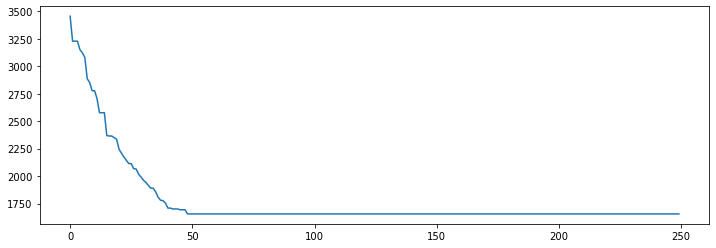

<Figure size 864x576 with 0 Axes>

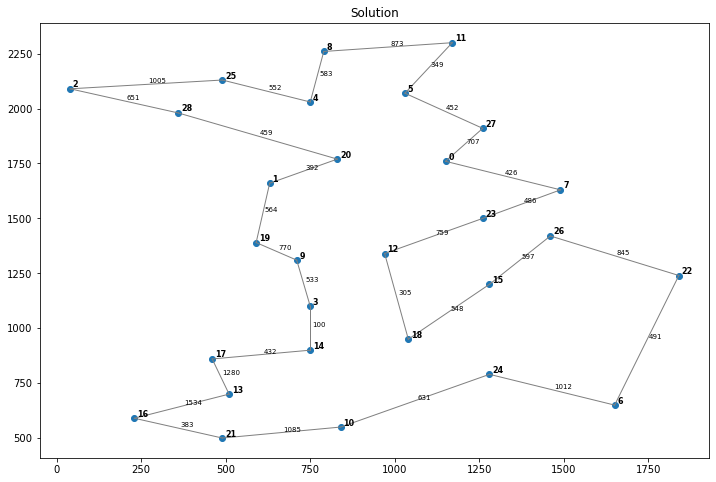

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1671.0 
 best_permutation: [ 8 11  5  4 20  0 27  7 23 15 26 22  6 24 10 21 16 13 17 14  3 18 12  9
 19  1 28  2 25]


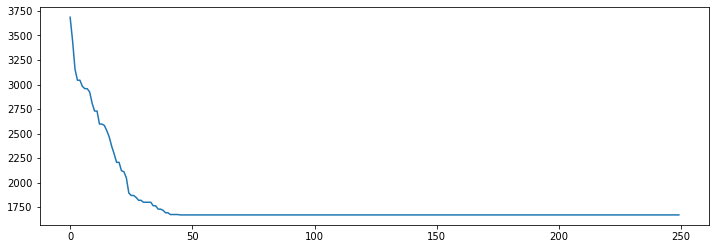

<Figure size 864x576 with 0 Axes>

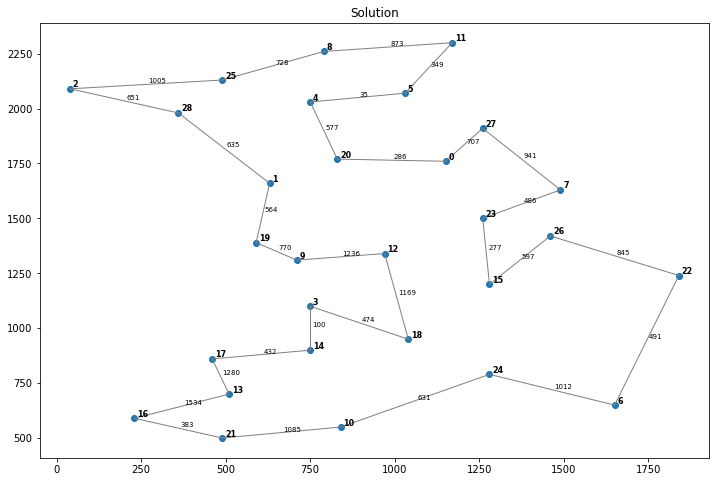

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1643.0 
 best_permutation: [15 12 23  7  0 27  5 11  8 25  2 28  4 20  1 19  9  3 18 14 17 13 16 21
 10 24  6 22 26]


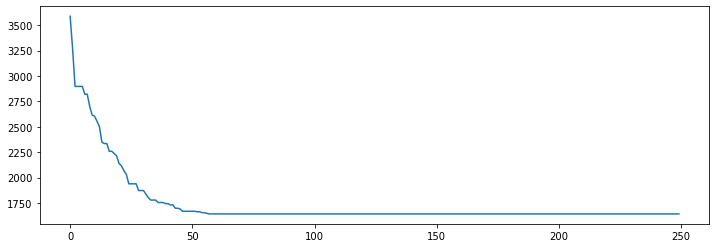

<Figure size 864x576 with 0 Axes>

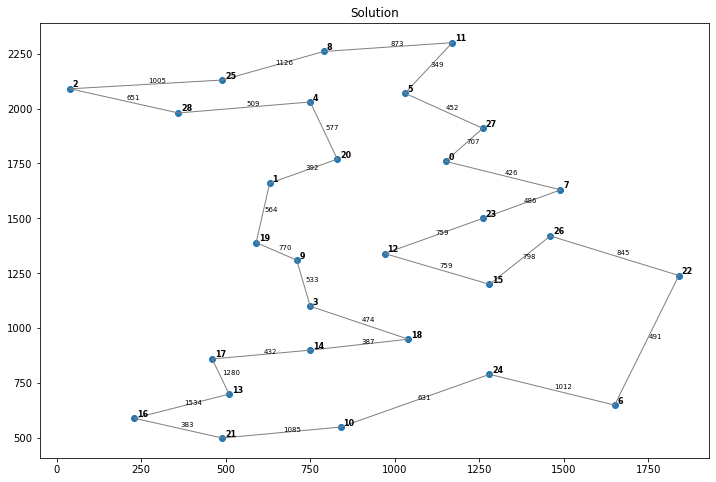

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1615.0 
 best_permutation: [11  5 27  0  7 23 12 15 26 22  6 24 18 10 21 16 13 17 14  3  9 19  1 20
  4 28  2 25  8]


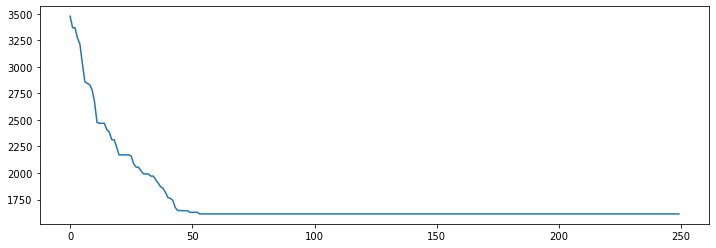

<Figure size 864x576 with 0 Axes>

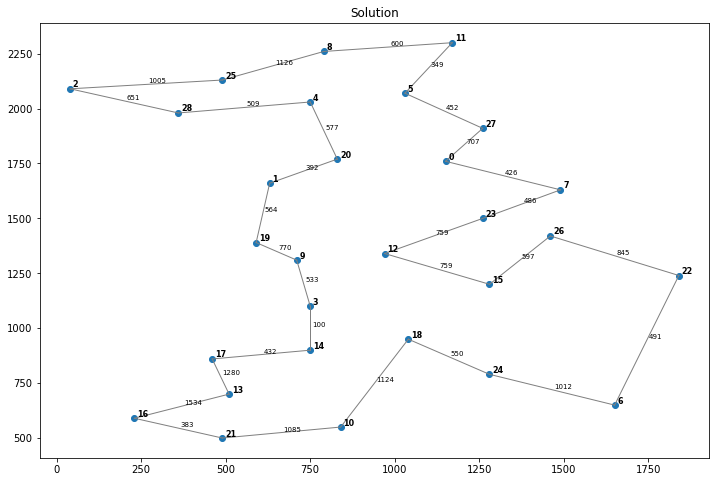

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1669.0 
 best_permutation: [16 13 17  3  9 19 12 15 26 23  0 20  1 28  2 25  4  8 11  5 27  7 22  6
 24 18 14 10 21]


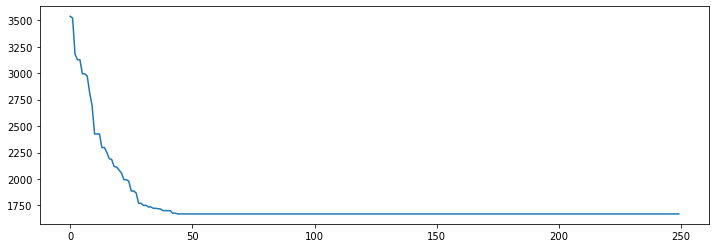

<Figure size 864x576 with 0 Axes>

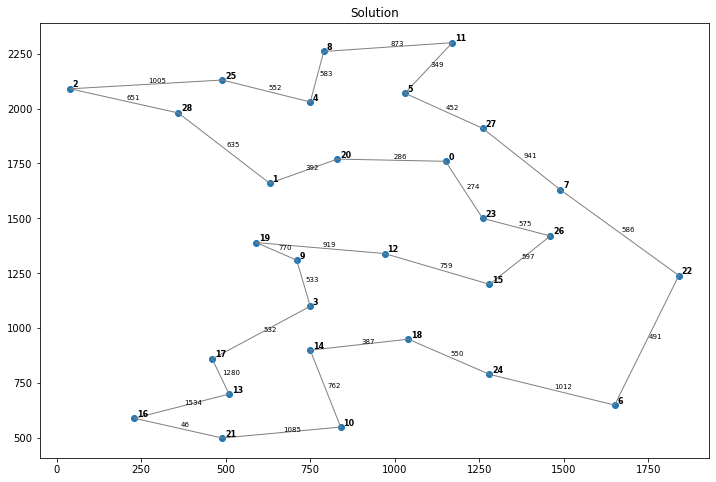

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1628.0 
 best_permutation: [18 10 21 16 13 17 14  3  9 19  1 28  2 25  4  8 11  5 27  0 20 12 15 23
  7 26 22  6 24]


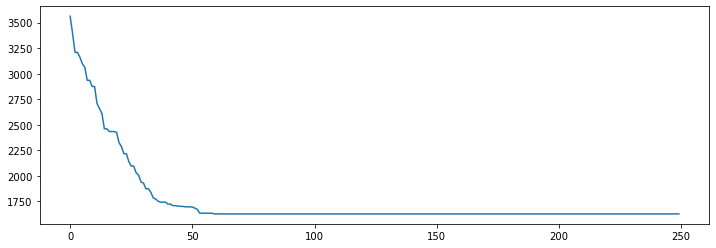

<Figure size 864x576 with 0 Axes>

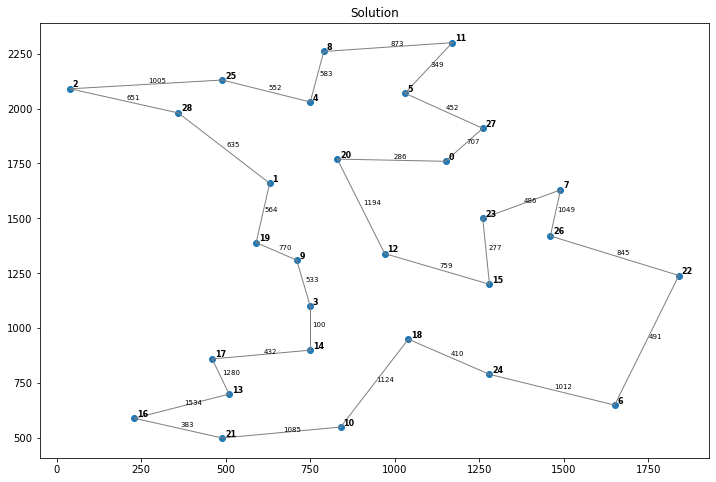

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1635.0 
 best_permutation: [ 1 19  9 12  3 14 17 13 16 21 10 18 24  6 22 26 15 23  7  0 27  5 11  8
  4 25  2 28 20]


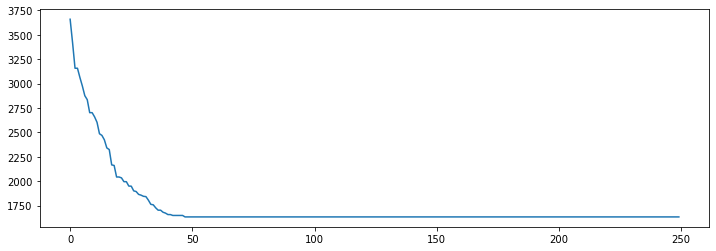

<Figure size 864x576 with 0 Axes>

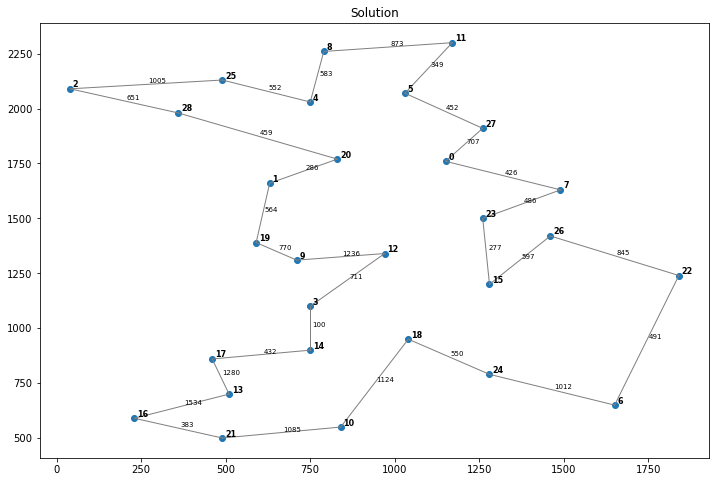

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1691.0 
 best_permutation: [22 15 26  7 27  5 11  8  4 25  2 28  1 20  0 23 12  9 19 17 13 16 21 10
 14  3 18 24  6]


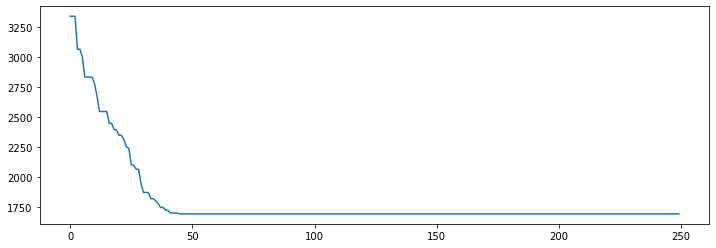

<Figure size 864x576 with 0 Axes>

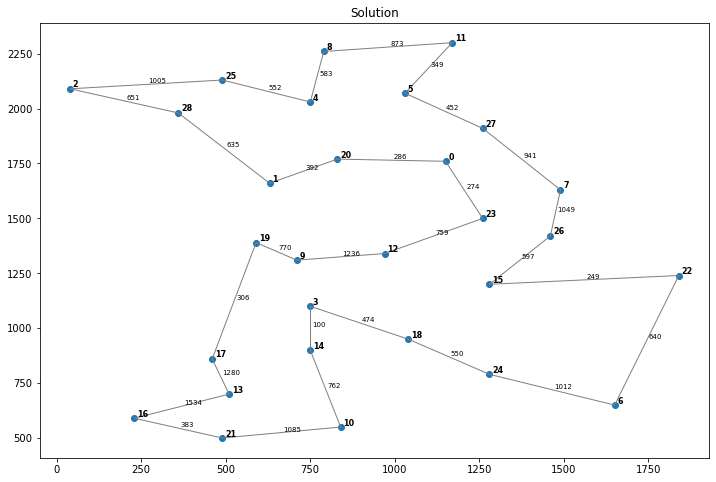

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1704.0 
 best_permutation: [ 0  5 11 27  7 26 15 22  6 24 18 14 10 21 16 13 17  3  9 19  1 28  2 25
  8  4 20 12 23]


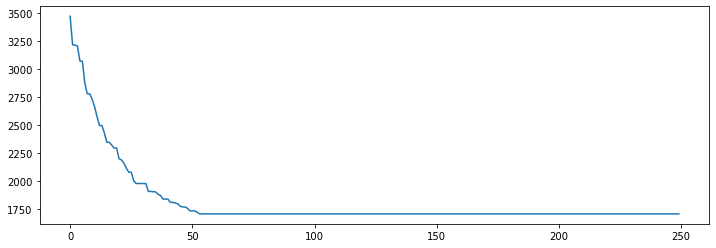

<Figure size 864x576 with 0 Axes>

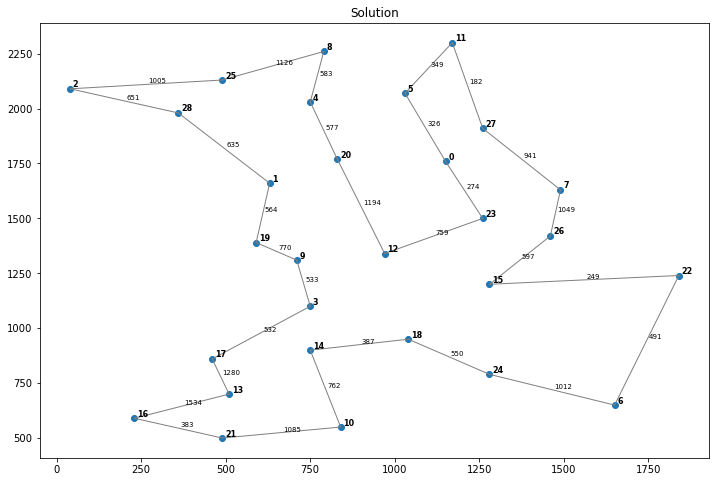

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1702.0 
 best_permutation: [20  4  5 11  8 25  2 28  1 19  9  3 14 17 16 21 13 10 18 15 24  6 22 26
  7 27  0 23 12]


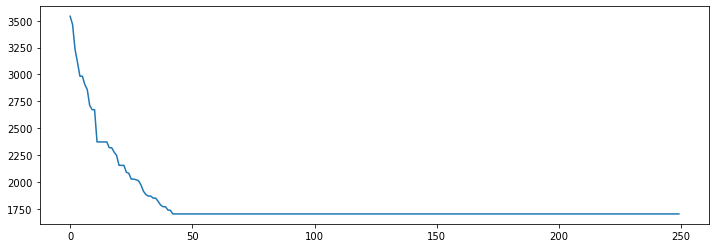

<Figure size 864x576 with 0 Axes>

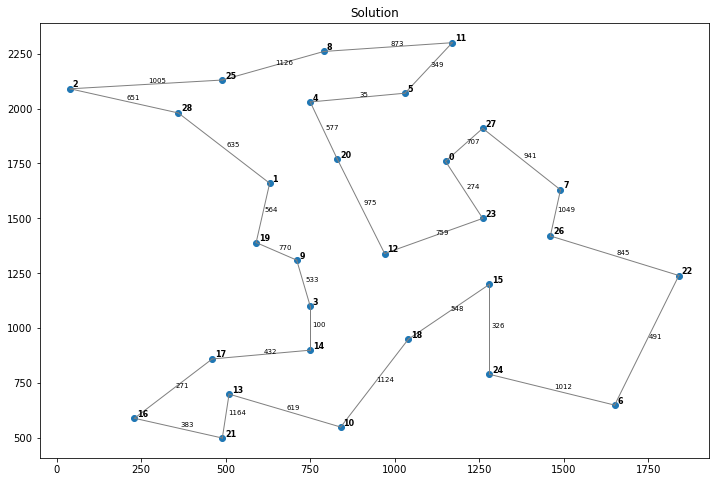

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1660.0 
 best_permutation: [15 18  3 14 17 13 16 21 10 24  6 22 26 23  7 27  0 20  5 11  8  4 25  2
 28  1 19  9 12]


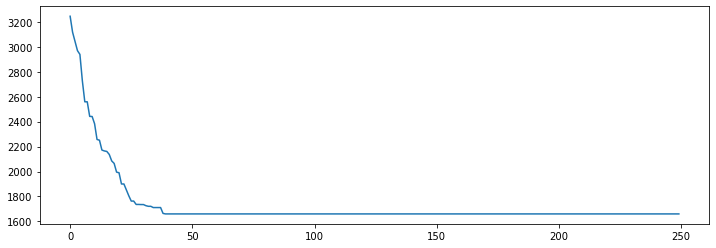

<Figure size 864x576 with 0 Axes>

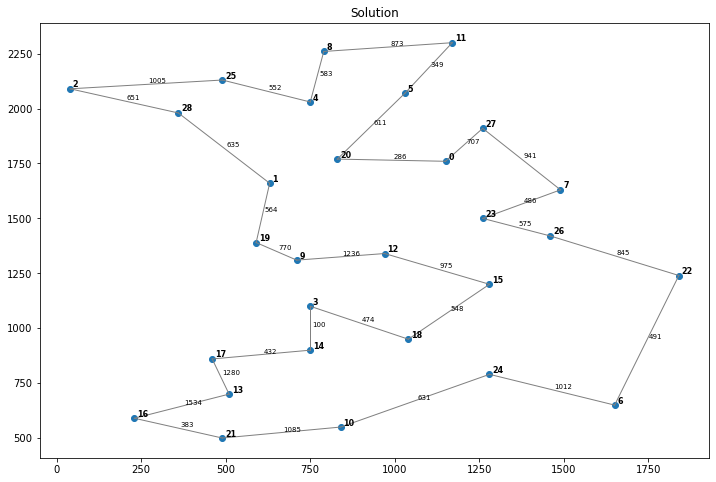

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1697.0 
 best_permutation: [15 23  7 26 22  6 24 10 21 16 13 17  9 19  1 20 28  2 25  4  8 11  5 27
  0 12  3 14 18]


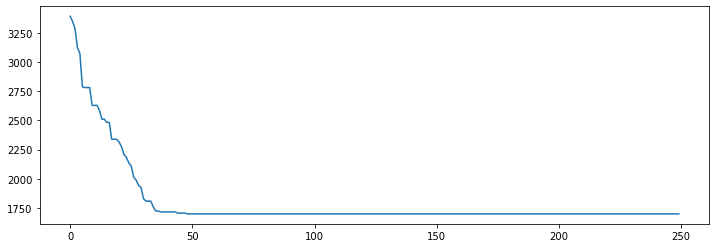

<Figure size 864x576 with 0 Axes>

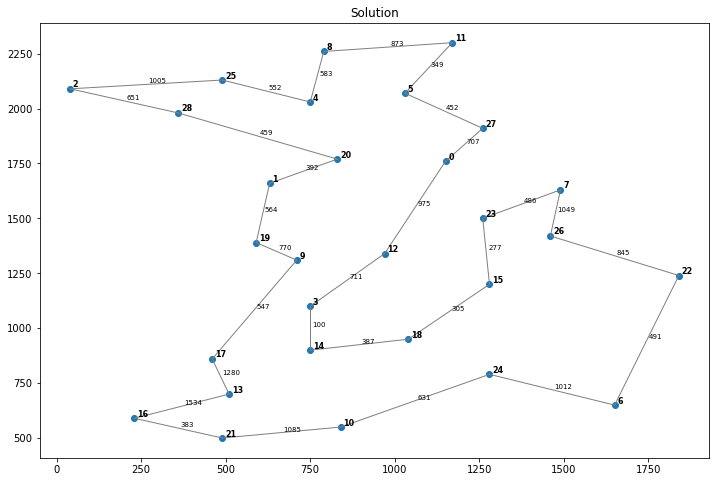

In [156]:
num = [29]
dist_matr = [bayg29_dist]
pop_size = [1000]
cross_prob = [0.975, 0.95, 0.9, 0.85]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [250]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(bayg29_dist, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(bayg29_coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1697.0 
 best_permutation: [ 0 23 26 15 12 20  4  8 25  2 28  1 19  9  3 17 13 16 21 10 14 18 24  6
 22  7 27 11  5]


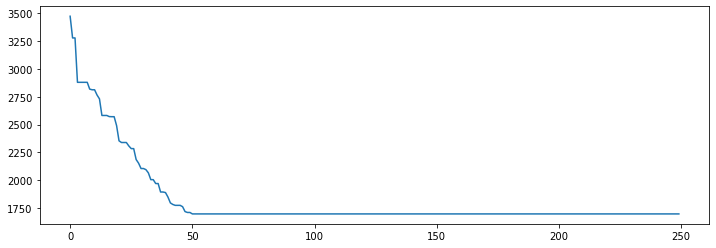

<Figure size 864x576 with 0 Axes>

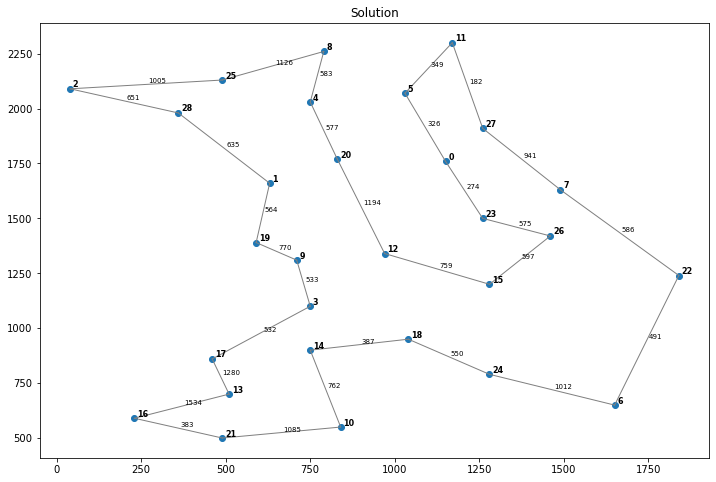

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 1635.0 
 best_permutation: [28  2 25  4  8 11  5 27  0  7 23 15 26 22  6 24 18 10 21 16 13 17 14  3
 12  9 19  1 20]


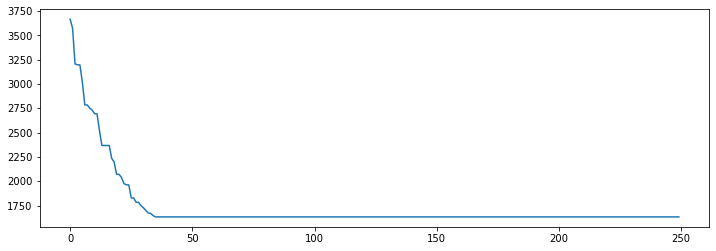

<Figure size 864x576 with 0 Axes>

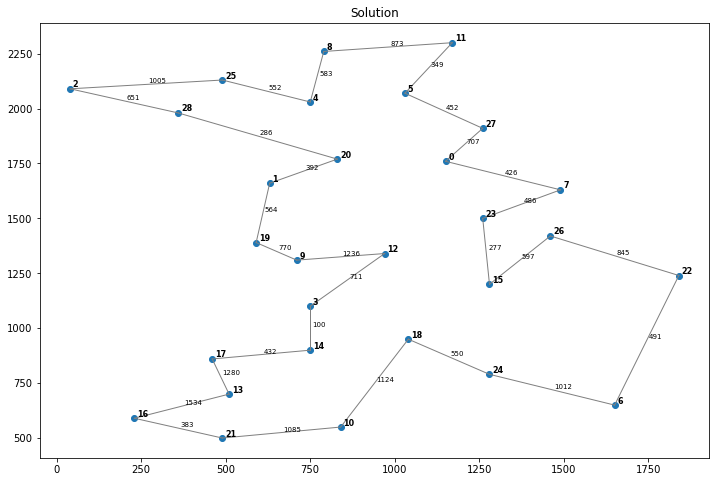

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1642.0 
 best_permutation: [ 5 11  8  4 25  2 28 20  1 19  9  3 14 17 13 16 21 10 18 12 15 24  6 22
 26  7 23  0 27]


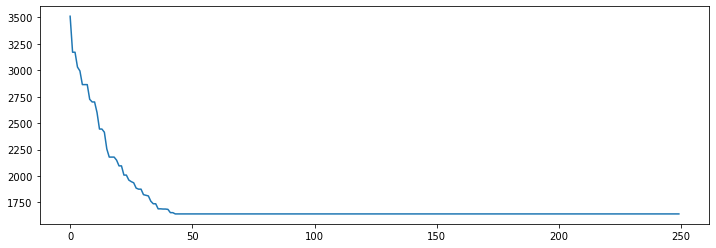

<Figure size 864x576 with 0 Axes>

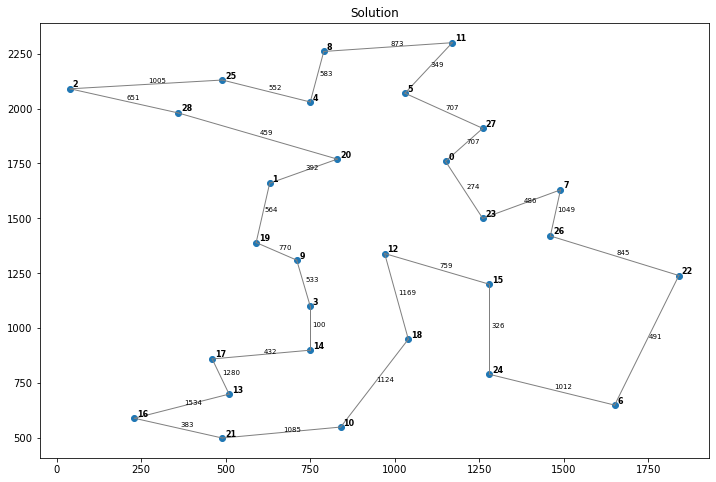

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 1670.0 
 best_permutation: [ 1 20 28  2 25  4  8 11  5 27  0  7 26 22  6 24 18 10 21 16 13 17 14  3
 15 23 12  9 19]


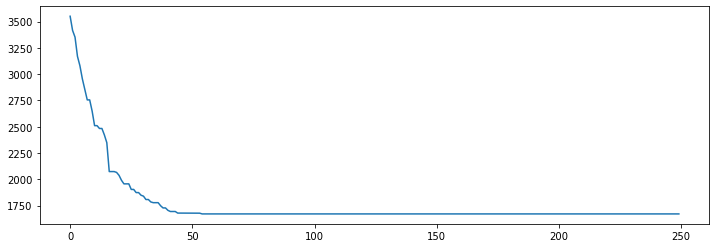

<Figure size 864x576 with 0 Axes>

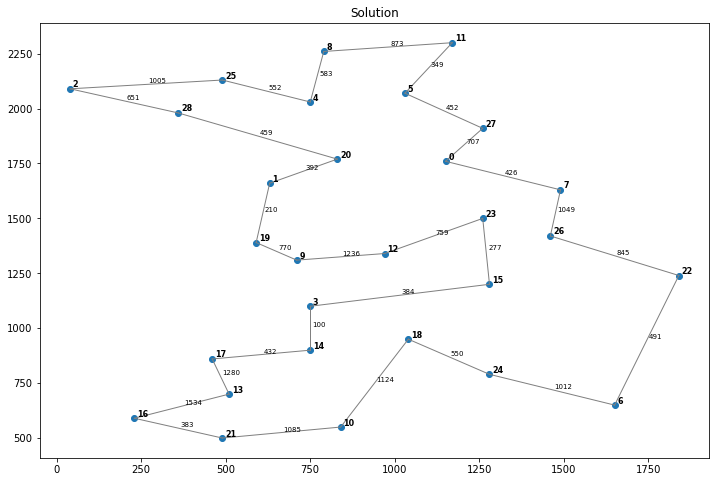

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1627.0 
 best_permutation: [15 23  7  0 27  5 11  8 25  2 28  4 20  1 19  9 12  3 14 17 13 16 21 10
 18 24  6 22 26]


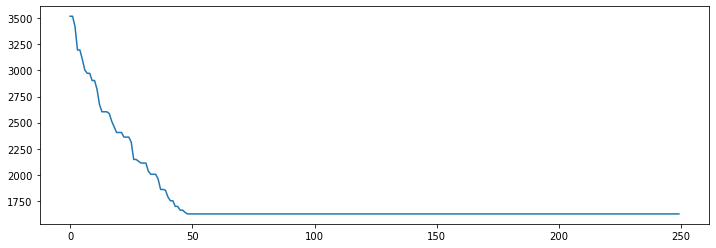

<Figure size 864x576 with 0 Axes>

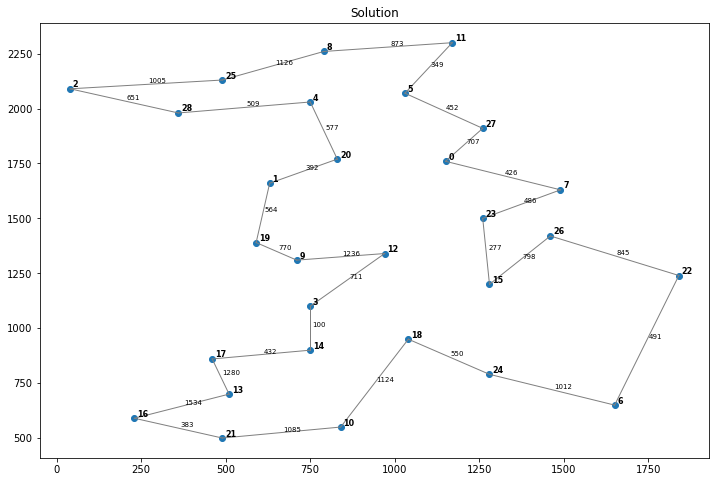

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1625.0 
 best_permutation: [23  0 27  5 11  8 25  2 28  4 20  1 19  9  3 17 13 16 21 10 14 18 24  6
 22  7 26 15 12]


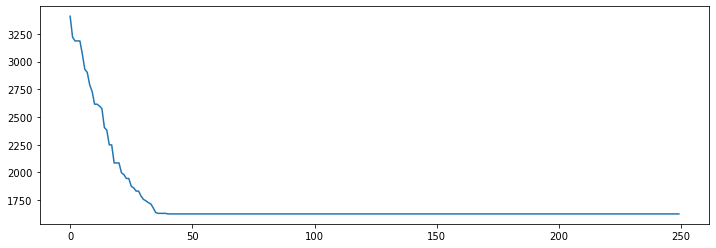

<Figure size 864x576 with 0 Axes>

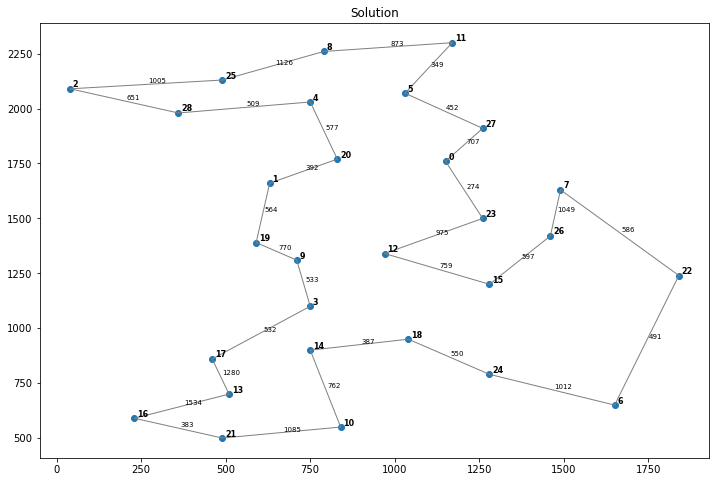

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 1661.0 
 best_permutation: [22 26  7 23  0 27  5 11  8 25  2 28  4 20  1 19  9  3 14 17 13 16 21 10
  6 24 18 12 15]


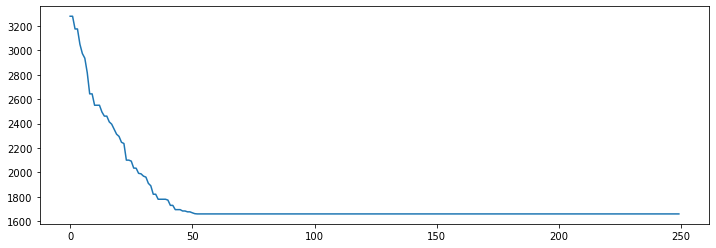

<Figure size 864x576 with 0 Axes>

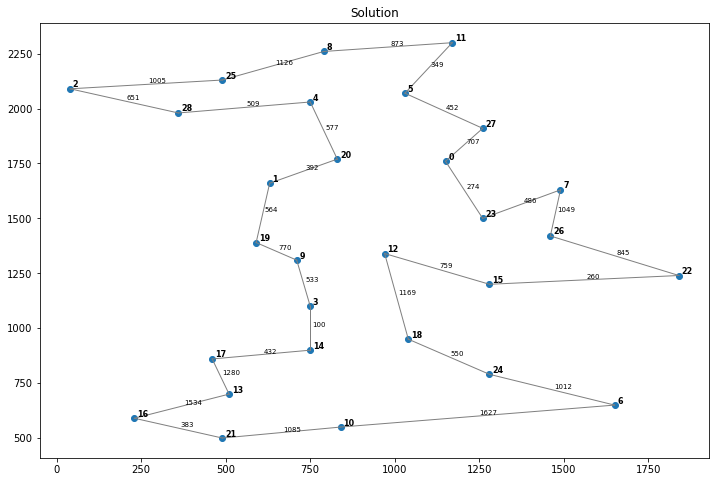

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1626.0 
 best_permutation: [19  9 12 15 18  3 14 17 13 16 21 10 24  6 22 26  7 23  0 27  5 11  8 25
  2 28  4 20  1]


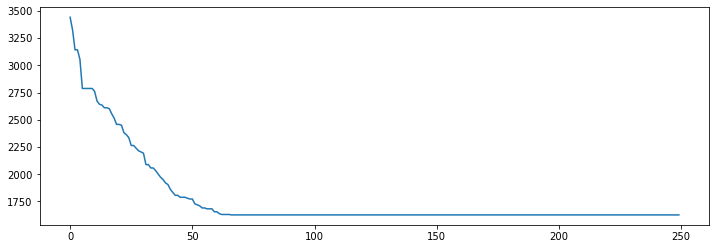

<Figure size 864x576 with 0 Axes>

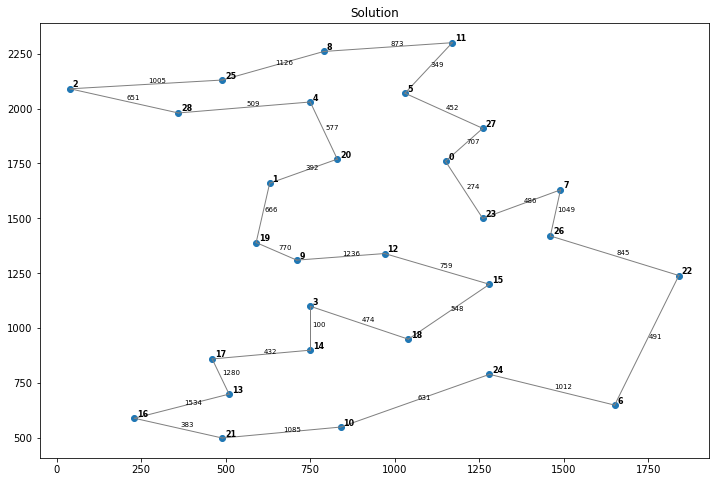

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 1630.0 
 best_permutation: [13 17  3  9 19  1 20  4 28  2 25  8 11  5 27  0  7 23 12 15 26 22  6 24
 18 14 10 21 16]


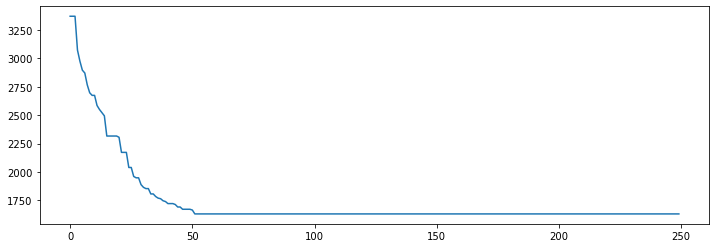

<Figure size 864x576 with 0 Axes>

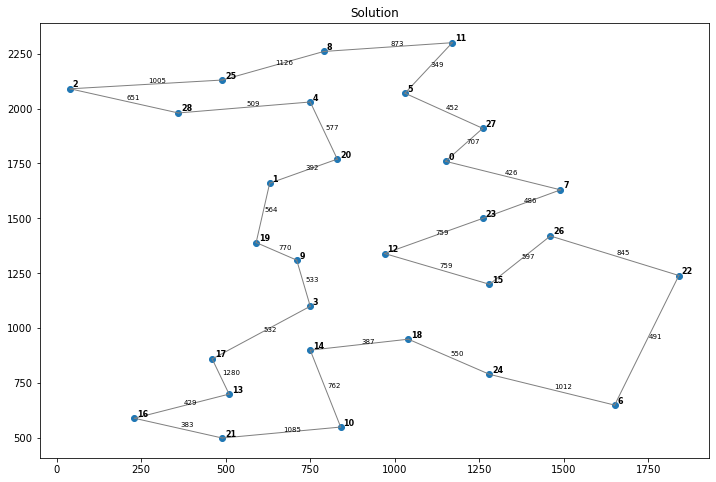

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1669.0 
 best_permutation: [18  3 14 17 16 21 13 10 24  6 22  7 26 15 23  0 27  5 11  8  4 25  2 28
 20  1 19  9 12]


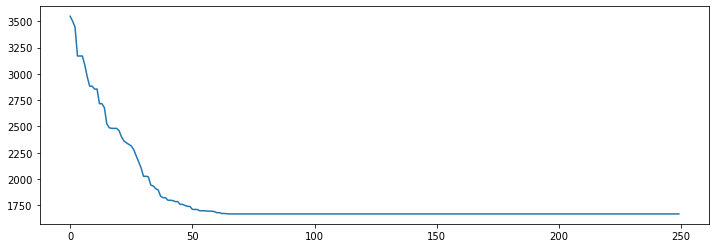

<Figure size 864x576 with 0 Axes>

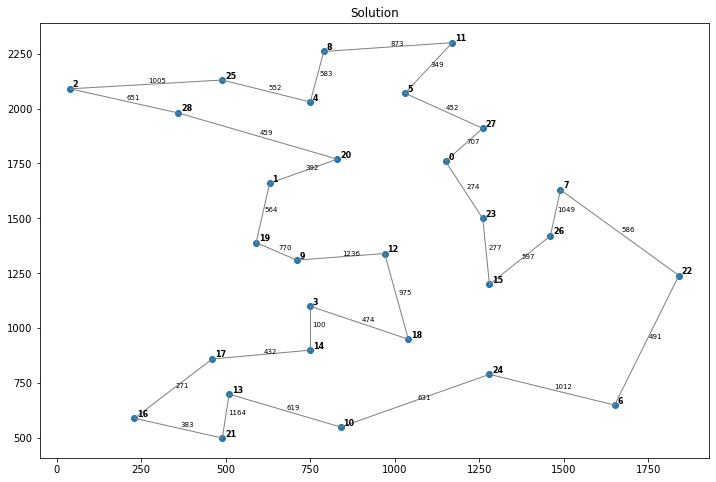

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 1658.0 
 best_permutation: [26 22  6 24 15 12 18 10 21 16 13 17 14  3  9 19  1 28  2 25  8  4 20  5
 11 27  0 23  7]


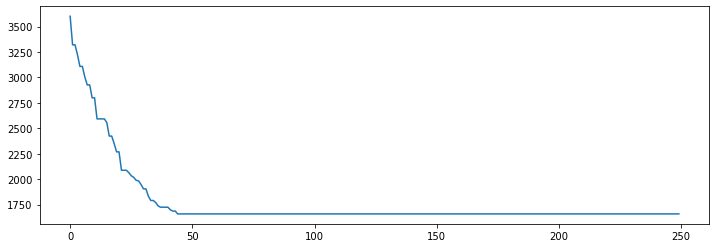

<Figure size 864x576 with 0 Axes>

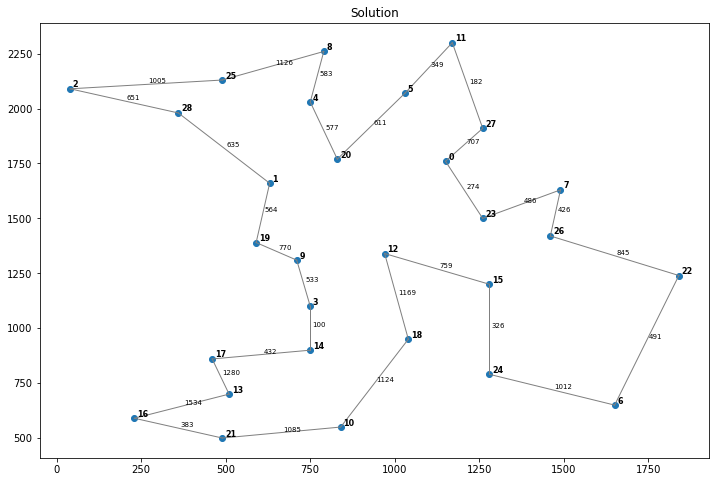

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 1656.0 
 best_permutation: [23 15 12 20  0 27  5 11  8  4 25  2 28  1 19  9  3 18 14 17 13 16 21 10
 24  6 22 26  7]


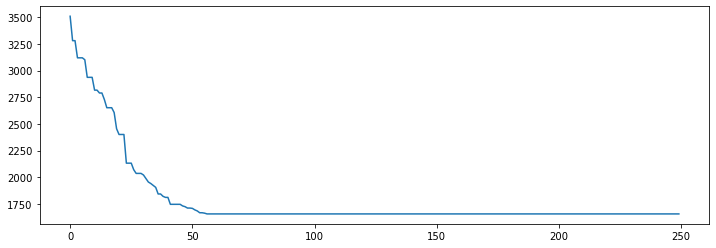

<Figure size 864x576 with 0 Axes>

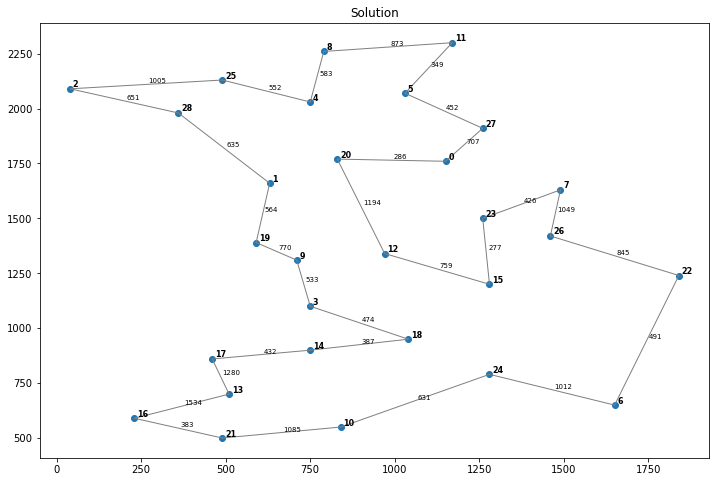

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 1642.0 
 best_permutation: [22 26  7 23  0 27  5 11  8 25  2 28  4 20  1 19  9 12  3 14 17 13 16 21
 10 18 15 24  6]


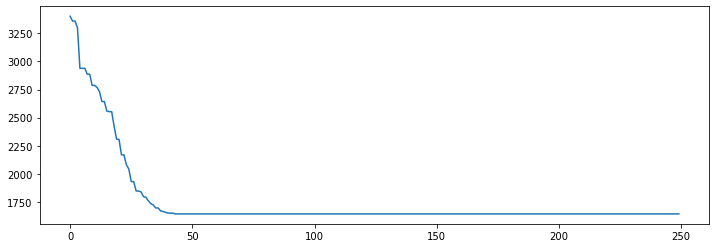

<Figure size 864x576 with 0 Axes>

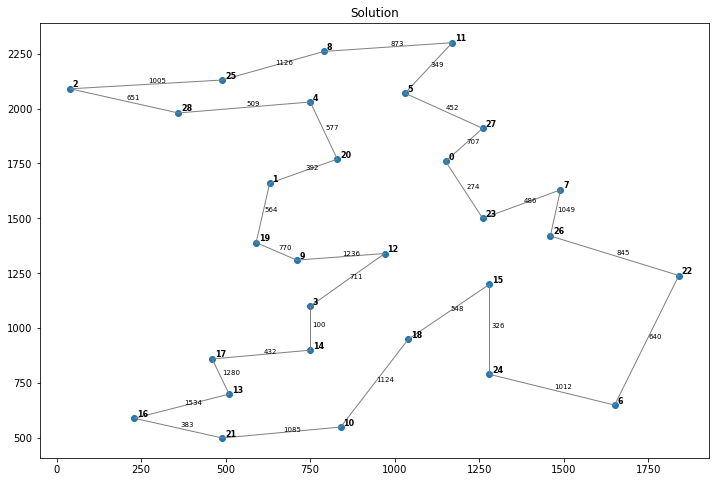

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 1654.0 
 best_permutation: [ 0 23  7 26 22  6 24 10 13 21 16 17 14 18 15 12  3  9 19  1 20 28  2 25
  4  8 11  5 27]


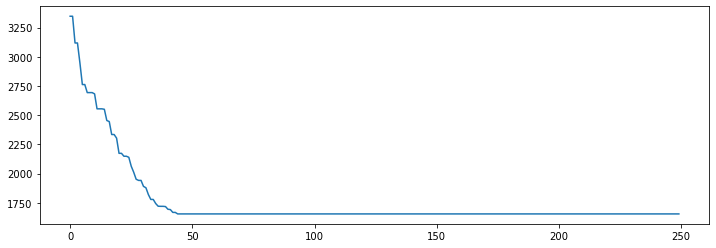

<Figure size 864x576 with 0 Axes>

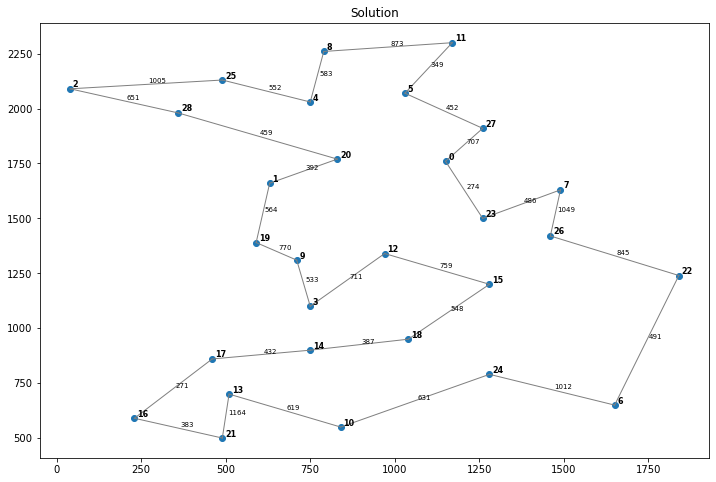

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 1678.0 
 best_permutation: [25  2 28  1 19  9 17 13 16 21 10 14  3 12 15 18 24  6 22 26 23  7 27  0
 20  4  5 11  8]


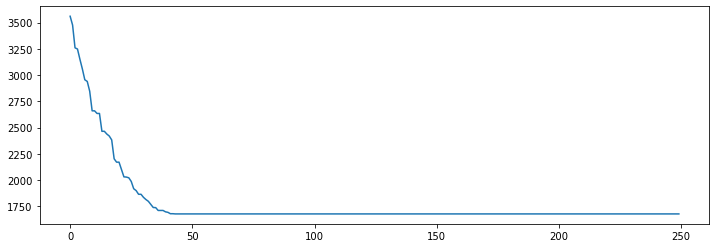

<Figure size 864x576 with 0 Axes>

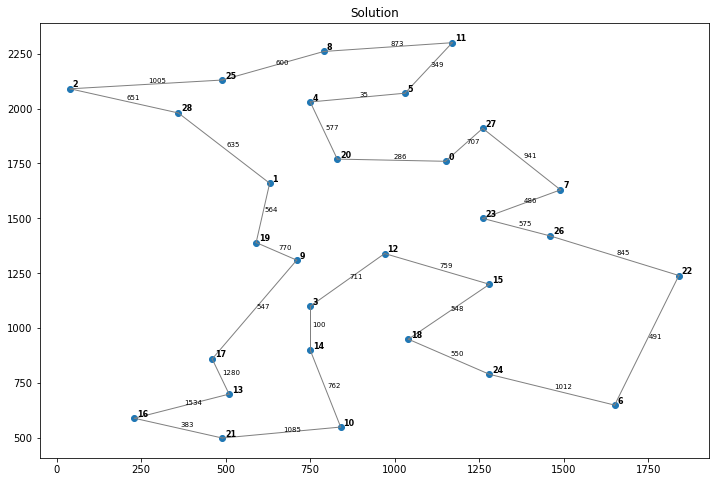

In [157]:
num = [29]
dist_matr = [bayg29_dist]
pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.2, 0.225, 0.25, 0.275, 0.3]
num_of_iter = [250]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(bayg29_dist, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(bayg29_coords, best_p)

## bays29

In [188]:
def bays29():
    distances_string = """0 107 241 190 124  80 316  76 152 157 283 133 113 297 228 129 348 276 188 150  65 341 184  67 221 169 108  45 167
     107   0 148 137  88 127 336 183 134  95 254 180 101 234 175 176 265 199 182  67  42 278 271 146 251 105 191 139  79
     241 148   0 374 171 259 509 317 217 232 491 312 280 391 412 349 422 356 355 204 182 435 417 292 424 116 337 273  77
     190 137 374   0 202 234 222 192 248  42 117 287  79 107  38 121 152  86  68  70 137 151 239 135 137 242 165 228 205
     124  88 171 202   0  61 392 202  46 160 319 112 163 322 240 232 314 287 238 155  65 366 300 175 307  57 220 121  97
      80 127 259 234  61   0 386 141  72 167 351  55 157 331 272 226 362 296 232 164  85 375 249 147 301 118 188  60 185
     316 336 509 222 392 386   0 233 438 254 202 439 235 254 210 187 313 266 154 282 321 298 168 249  95 437 190 314 435
      76 183 317 192 202 141 233   0 213 188 272 193 131 302 233  98 344 289 177 216 141 346 108  57 190 245  43  81 243
     152 134 217 248  46  72 438 213   0 206 365  89 209 368 286 278 360 333 284 201 111 412 321 221 353  72 266 132 111
     157  95 232  42 160 167 254 188 206   0 159 220  57 149  80 132 193 127 100  28  95 193 241 131 169 200 161 189 163
     283 254 491 117 319 351 202 272 365 159   0 404 176 106  79 161 165 141  95 187 254 103 279 215 117 359 216 308 322
     133 180 312 287 112  55 439 193  89 220 404   0 210 384 325 279 415 349 285 217 138 428 310 200 354 169 241 112 238
     113 101 280  79 163 157 235 131 209  57 176 210   0 186 117  75 231 165  81  85  92 230 184  74 150 208 104 158 206
     297 234 391 107 322 331 254 302 368 149 106 384 186   0  69 191  59  35 125 167 255  44 309 245 169 327 246 335 288
     228 175 412  38 240 272 210 233 286  80  79 325 117  69   0 122 122  56  56 108 175 113 240 176 125 280 177 266 243
     129 176 349 121 232 226 187  98 278 132 161 279  75 191 122   0 244 178  66 160 161 235 118  62  92 277  55 155 275
     348 265 422 152 314 362 313 344 360 193 165 415 231  59 122 244   0  66 178 198 286  77 362 287 228 358 299 380 319
     276 199 356  86 287 296 266 289 333 127 141 349 165  35  56 178  66   0 112 132 220  79 296 232 181 292 233 314 253
     188 182 355  68 238 232 154 177 284 100  95 285  81 125  56  66 178 112   0 128 167 169 179 120  69 283 121 213 281
     150  67 204  70 155 164 282 216 201  28 187 217  85 167 108 160 198 132 128   0  88 211 269 159 197 172 189 182 135
      65  42 182 137  65  85 321 141 111  95 254 138  92 255 175 161 286 220 167  88   0 299 229 104 236 110 149  97 108
     341 278 435 151 366 375 298 346 412 193 103 428 230  44 113 235  77  79 169 211 299   0 353 289 213 371 290 379 332
     184 271 417 239 300 249 168 108 321 241 279 310 184 309 240 118 362 296 179 269 229 353   0 121 162 345  80 189 342
      67 146 292 135 175 147 249  57 221 131 215 200  74 245 176  62 287 232 120 159 104 289 121   0 154 220  41  93 218
     221 251 424 137 307 301  95 190 353 169 117 354 150 169 125  92 228 181  69 197 236 213 162 154   0 352 147 247 350
     169 105 116 242  57 118 437 245  72 200 359 169 208 327 280 277 358 292 283 172 110 371 345 220 352   0 265 178  39
     108 191 337 165 220 188 190  43 266 161 216 241 104 246 177  55 299 233 121 189 149 290  80  41 147 265   0 124 263
      45 139 273 228 121  60 314  81 132 189 308 112 158 335 266 155 380 314 213 182  97 379 189  93 247 178 124   0 199
     167  79  77 205  97 185 435 243 111 163 322 238 206 288 243 275 319 253 281 135 108 332 342 218 350  39 263 199   0"""
    coords_string = """1    1150.0  1760.0
       2     630.0  1660.0
       3      40.0  2090.0
       4     750.0  1100.0
       5     750.0  2030.0
       6    1030.0  2070.0
       7    1650.0   650.0
       8    1490.0  1630.0
       9     790.0  2260.0
      10     710.0  1310.0
      11     840.0   550.0
      12    1170.0  2300.0
      13     970.0  1340.0
      14     510.0   700.0
      15     750.0   900.0
      16    1280.0  1200.0
      17     230.0   590.0
      18     460.0   860.0
      19    1040.0   950.0
      20     590.0  1390.0
      21     830.0  1770.0
      22     490.0   500.0
      23    1840.0  1240.0
      24    1260.0  1500.0
      25    1280.0   790.0
      26     490.0  2130.0
      27    1460.0  1420.0
      28    1260.0  1910.0
      29     360.0  1980.0"""
    best_perm_string = """1
    28
    6
    12
    9
    5
    26
    29
    3
    2
    20
    10
    4
    15
    18
    17
    14
    22
    11
    19
    25
    7
    23
    27
    8
    24
    16
    13
    21"""
    n = 29
    distance_matrix = np.zeros((n, n))
    it = iter(distances_string.split())
    for i in range(n):
        for k in range(n):
            distance_matrix[i, k] = float(next(it))
    coords = np.zeros((n, 2))
    it = iter(coords_string.split())
    for i in range(n):
        next(it)
        coords[i, 0] = float(next(it))
        coords[i, 1] = float(next(it))
    best_perm = np.zeros(n, dtype="i")
    it = iter(best_perm_string.split())
    for i in range(n):
        best_perm[i] = int(next(it)) - 1
    return distance_matrix, best_perm, coords

In [189]:
bays29_dist, bays29_best_perm, bays29_coords = bays29()

<Figure size 864x576 with 0 Axes>

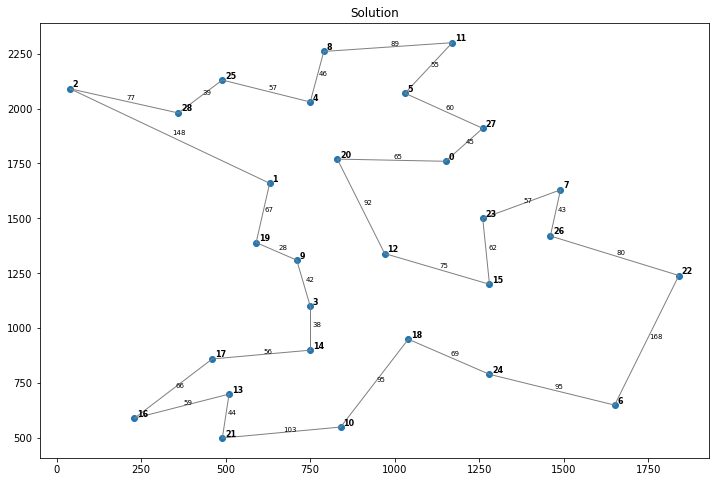

[ 0 27  5 11  8  4 25 28  2  1 19  9  3 14 17 16 13 21 10 18 24  6 22 26
  7 23 15 12 20] 2020.0


In [190]:
plot_path(bays29_dist, bays29_coords, bays29_best_perm)
print(bays29_best_perm, tsp_objective_function(bays29_dist, bays29_best_perm))

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2088.0 
 best_permutation: [17 14  3 18 15 23 12  9 19  1  2 28 25  8 11  5  4 20  0 27  7 26 22  6
 24 10 21 13 16]


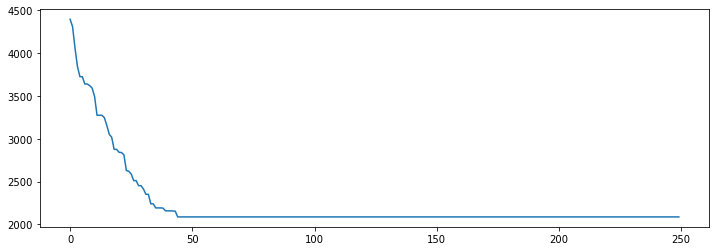

<Figure size 864x576 with 0 Axes>

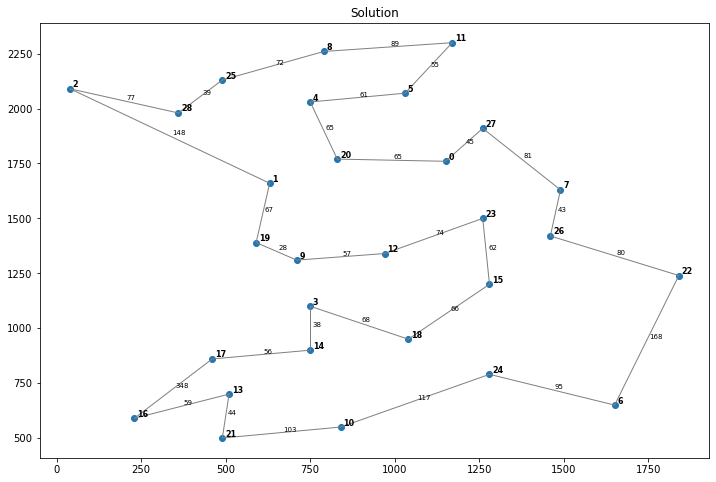

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2064.0 
 best_permutation: [10 24  6 22 26  7 23 15 18 12  0 27  5 11  8  4 25 28  2  1 20 19  9  3
 14 17 16 13 21]


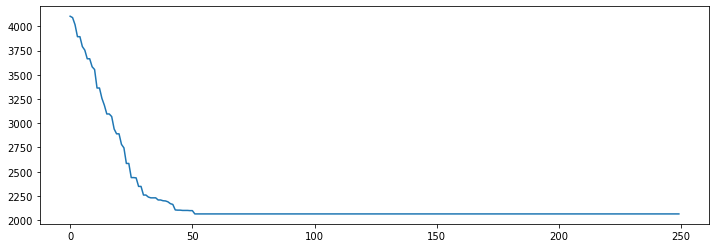

<Figure size 864x576 with 0 Axes>

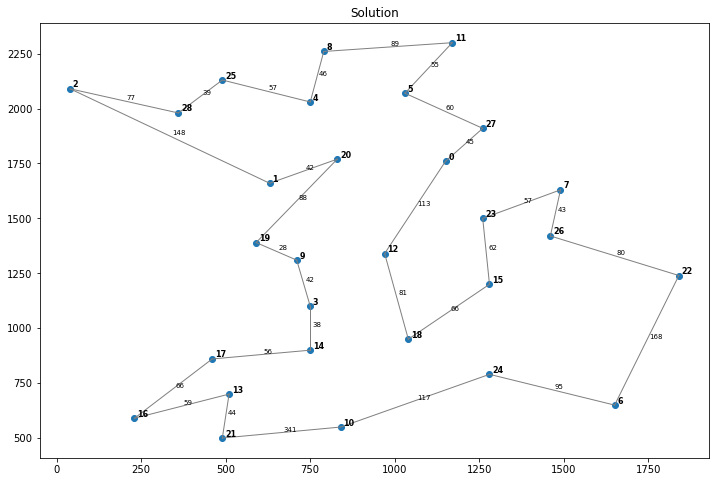

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2065.0 
 best_permutation: [ 8  4 25 28  2  1 20 19  9  3 14 17 16 13 21 10 18 15 24  6 22 26  7 23
 12  0 27  5 11]


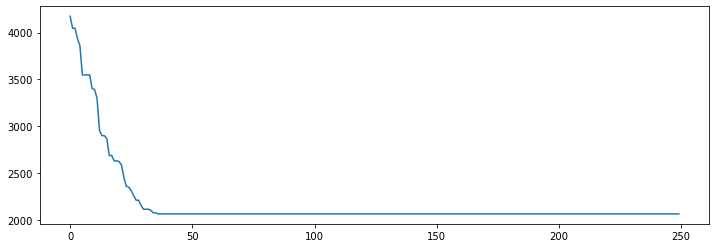

<Figure size 864x576 with 0 Axes>

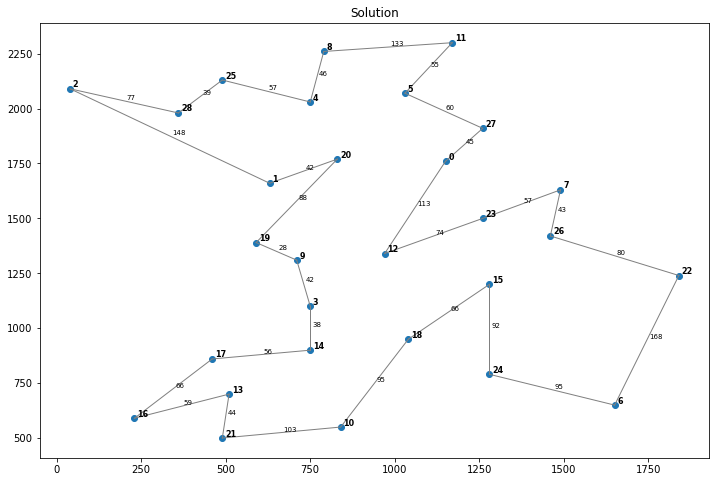

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2094.0 
 best_permutation: [19 12 23  0 20  1  2 28 25  4  8 11  5 27  7 26 22 15 18 24  6 10 21 13
 16 17 14  3  9]


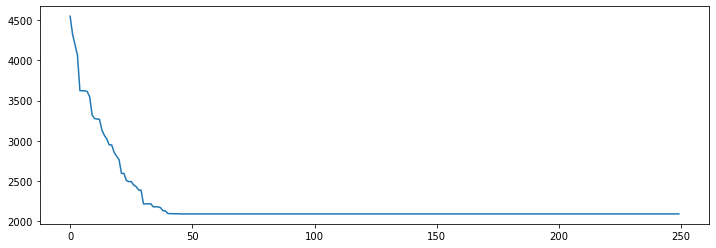

<Figure size 864x576 with 0 Axes>

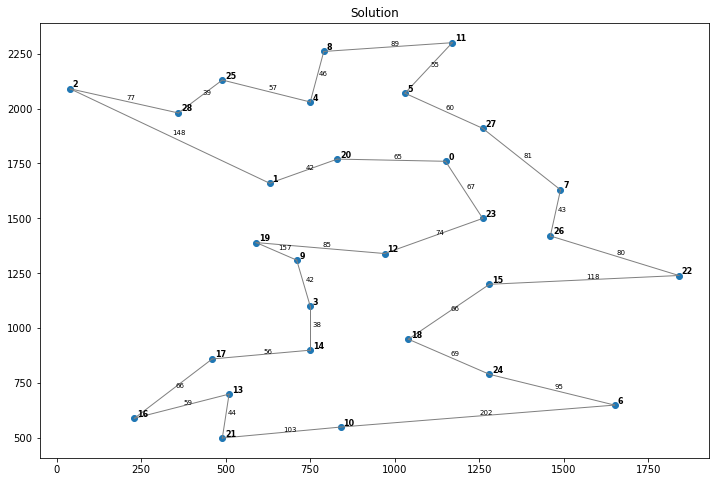

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2020.0 
 best_permutation: [12 15 23  7 26 22  6 24 18 10 21 13 16 17 14  3  9 19  1  2 28 25  4  8
 11  5 27  0 20]


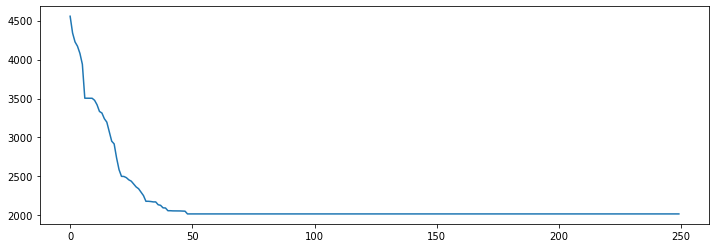

<Figure size 864x576 with 0 Axes>

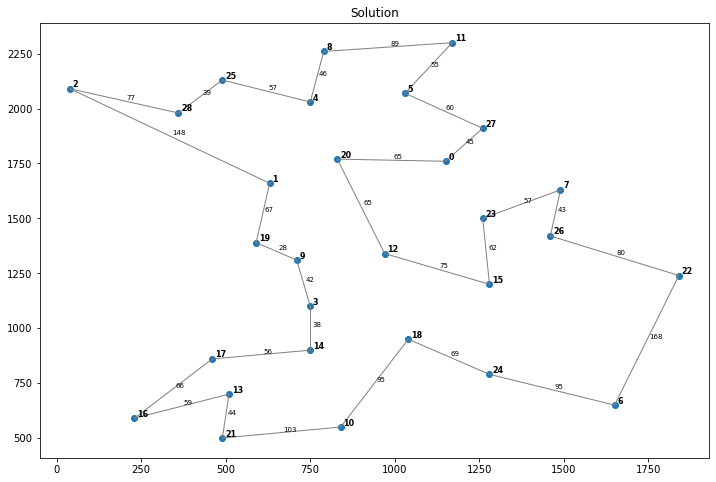

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2031.0 
 best_permutation: [22  6 24 18 10 21 13 16 17 14  3  9 19 20  1  2 28 25  4  8 11  5 27  0
 23 12 15 26  7]


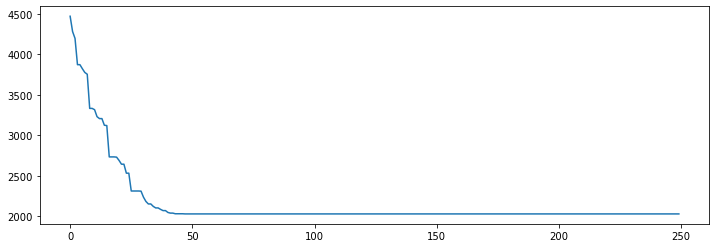

<Figure size 864x576 with 0 Axes>

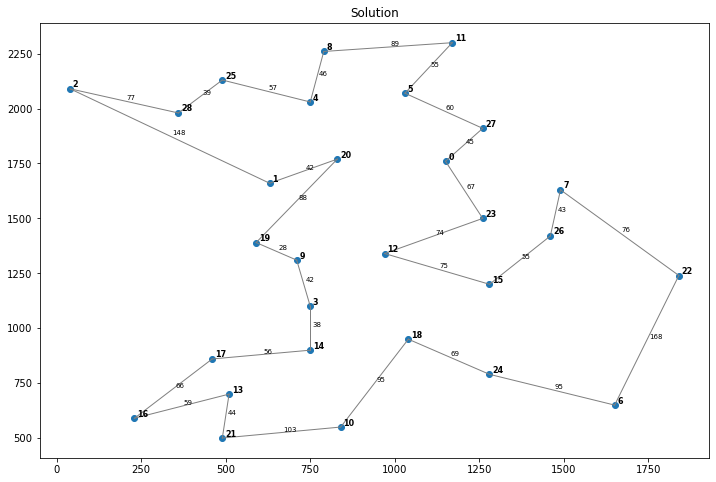

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2073.0 
 best_permutation: [12 20  0 23  7 27  5 11  8  4 25 28  2  1 19  9  3 14 17 16 13 21 10 18
 24  6 22 26 15]


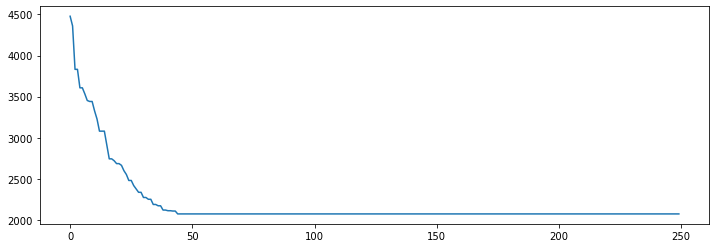

<Figure size 864x576 with 0 Axes>

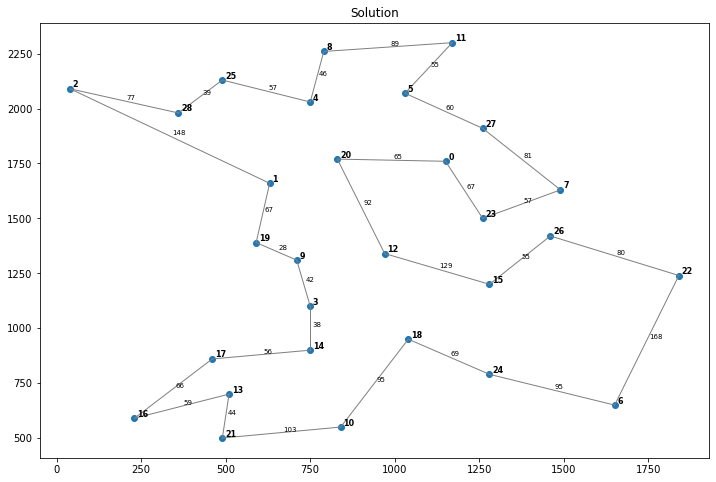

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2106.0 
 best_permutation: [ 3 12  9 19  1 20  4  2 28 25  8 11  5 27  0 23 15 26  7 22  6 24 18 14
 10 21 13 16 17]


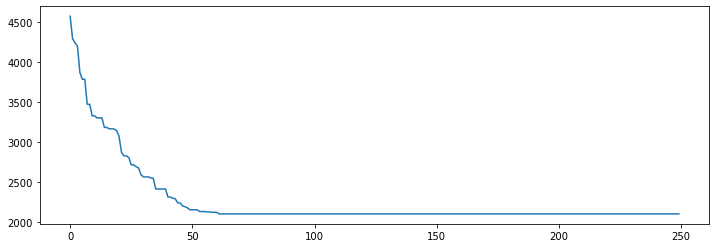

<Figure size 864x576 with 0 Axes>

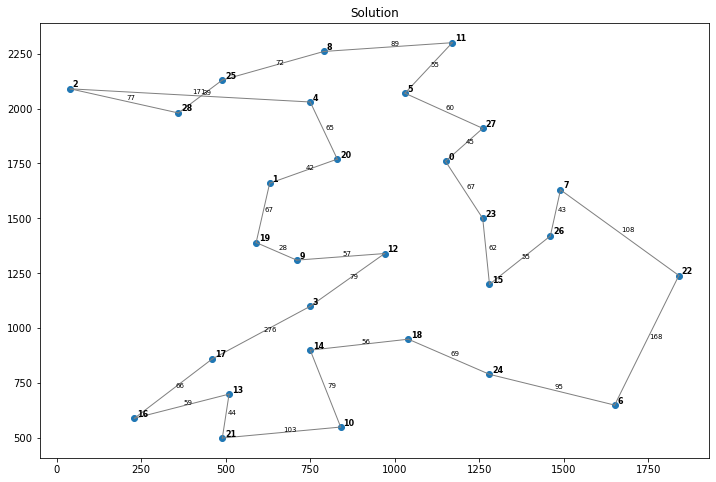

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2061.0 
 best_permutation: [ 5 11  8  4 25 28  2  1 20 19  9  3 14 17 16 13 21 10 24  6 22 15 18 12
 23 26  7  0 27]


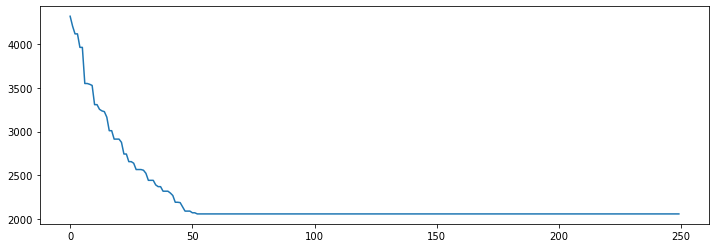

<Figure size 864x576 with 0 Axes>

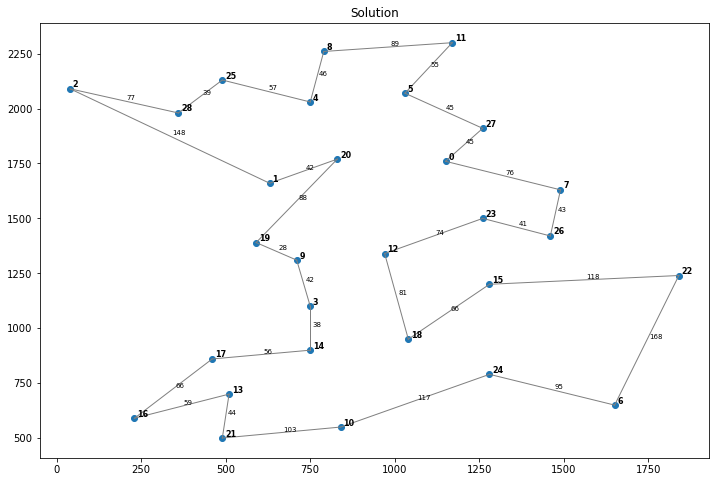

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2020.0 
 best_permutation: [23 15 12 20  0 27  5 11  8  4 25 28  2  1 19  9  3 14 17 16 13 21 10 18
 24  6 22 26  7]


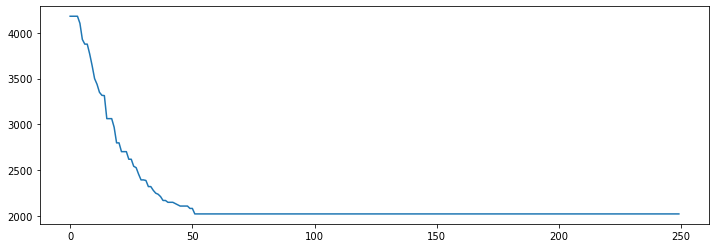

<Figure size 864x576 with 0 Axes>

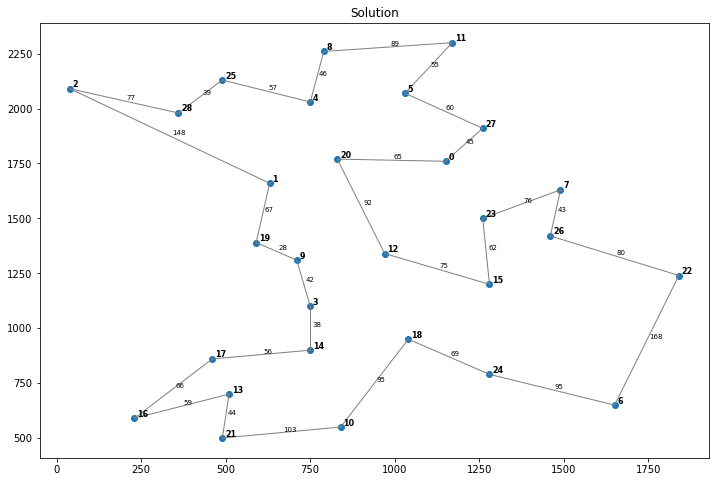

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2066.0 
 best_permutation: [20  0 23 15 12  9 19  3 17 16 13 21 10 14 18 24  6 22 26  7 27  5 11  8
  4 25 28  2  1]


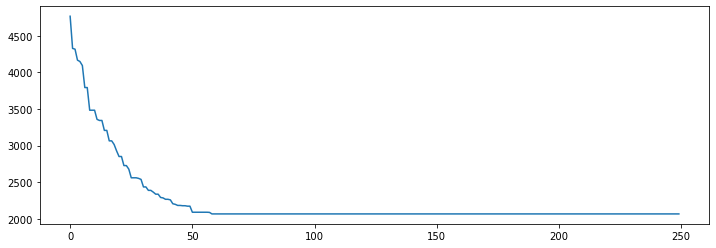

<Figure size 864x576 with 0 Axes>

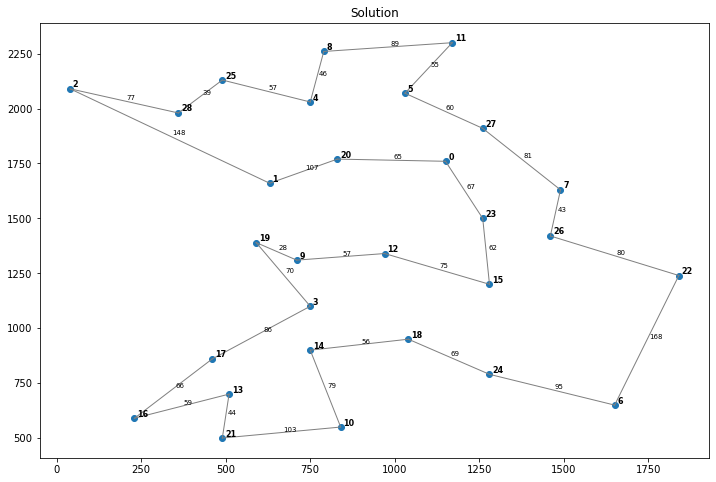

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2100.0 
 best_permutation: [27 11  5 20  4  8 25 28  2  1 19  9  3 14 17 16 13 21 10 18 12 15 24  6
 22 26  7 23  0]


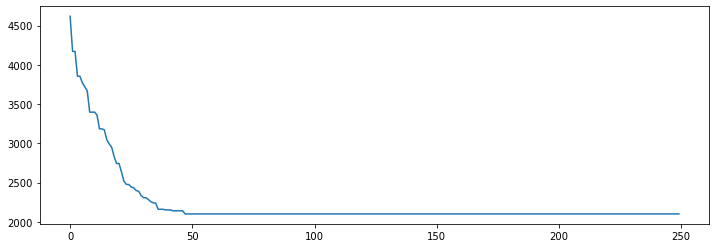

<Figure size 864x576 with 0 Axes>

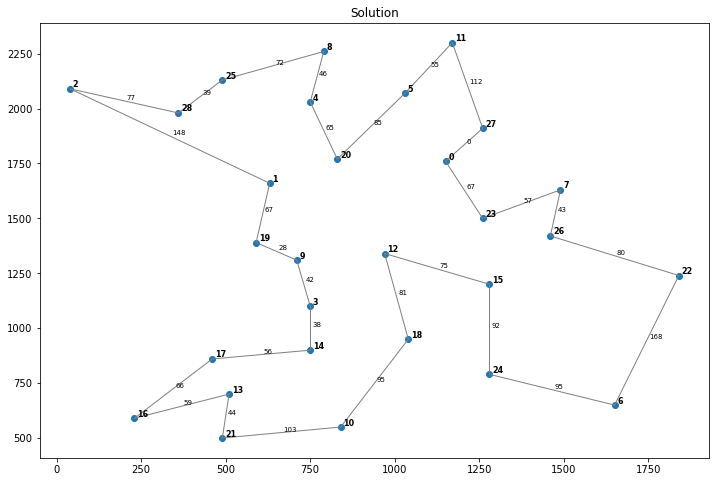

In [191]:
dist_matr = [bays29_dist]
coords = bays29_coords
num = [29]
pop_size = [1000]
cross_prob = [0.975, 0.95, 0.9, 0.85]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [250]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2100.0 
 best_permutation: [ 3 17 16 13 21 10 14 18 24  6 22 15 12 23 26  7 27  0 20  5 11  8  4 25
 28  2  1 19  9]


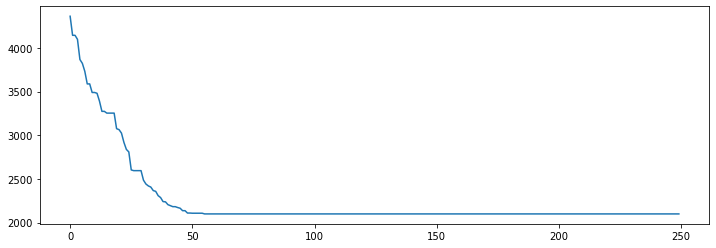

<Figure size 864x576 with 0 Axes>

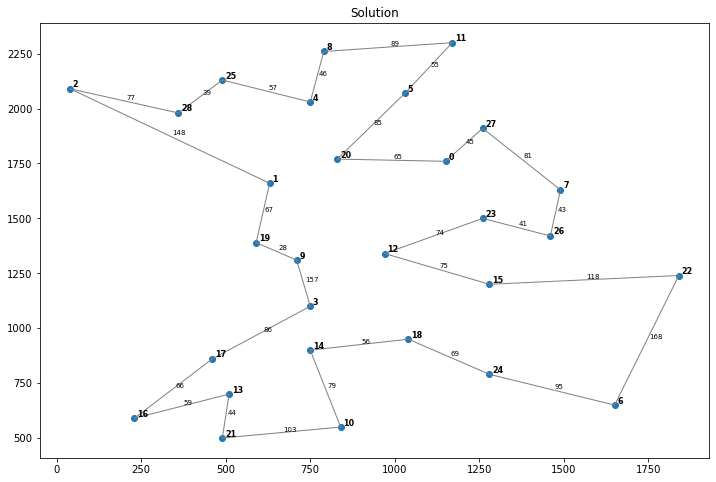

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 2048.0 
 best_permutation: [ 4  8 11  5 27  0  7 26 22  6 24 15 23 12 18 10 21 13 16 17 14  3  9 19
 20  1  2 28 25]


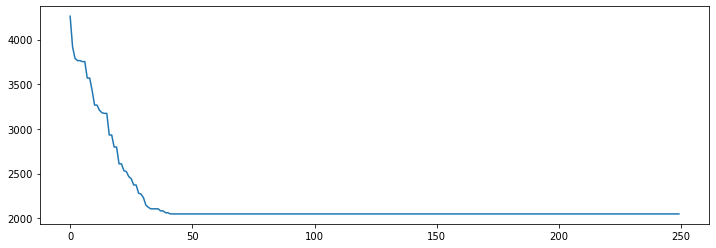

<Figure size 864x576 with 0 Axes>

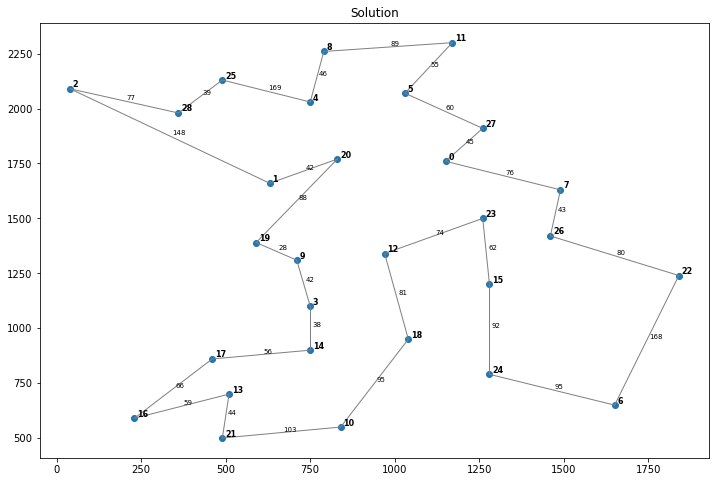

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2038.0 
 best_permutation: [ 6 24 18 10 21 13 16 17 14  3  9 19 12 20  1  2 28 25  4  8 11  5 27  0
  7 26 23 15 22]


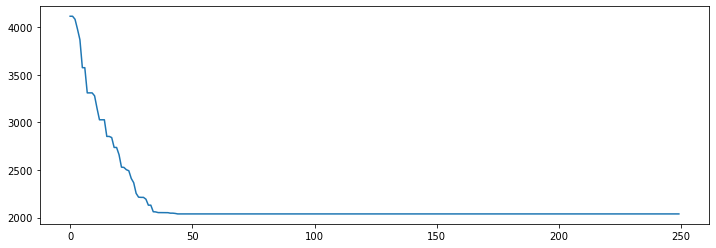

<Figure size 864x576 with 0 Axes>

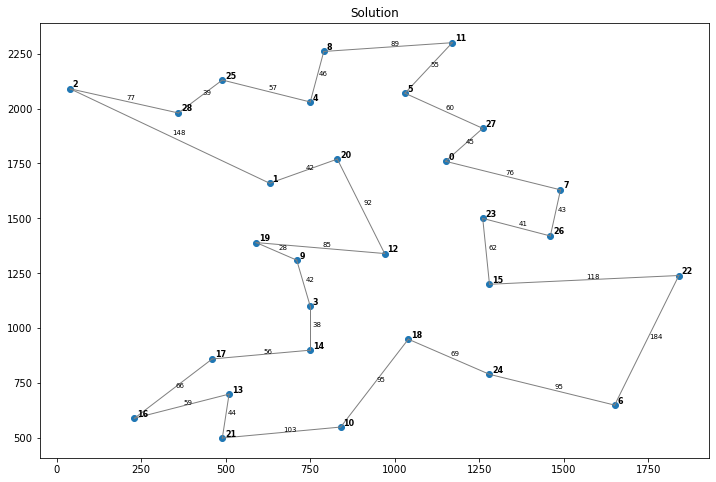

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 2026.0 
 best_permutation: [ 5 11  8  4 25 28  2  1 20 19  9  3 14 17 16 13 21 10 18 24  6 22 26 15
 12 23  7  0 27]


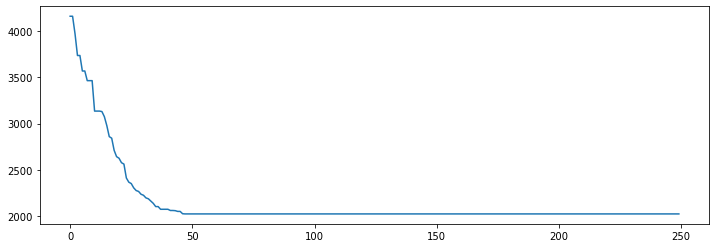

<Figure size 864x576 with 0 Axes>

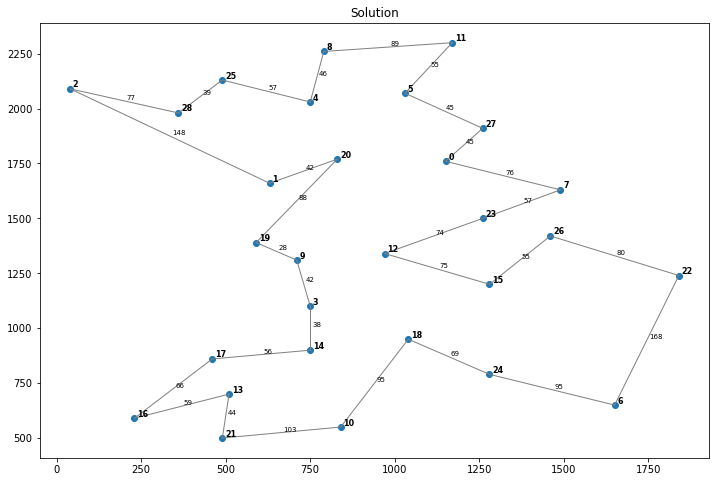

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2031.0 
 best_permutation: [ 3  9 19 20  1  2 28 25  4  8 11  5 27  0 23 12 15 26  7 22  6 24 18 10
 21 13 16 17 14]


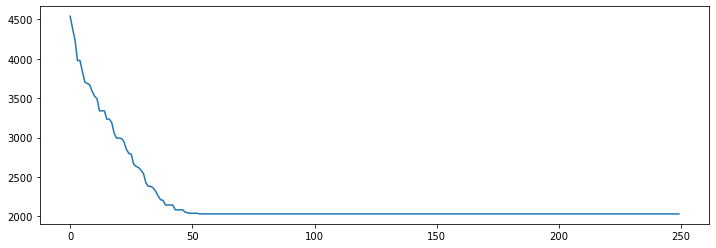

<Figure size 864x576 with 0 Axes>

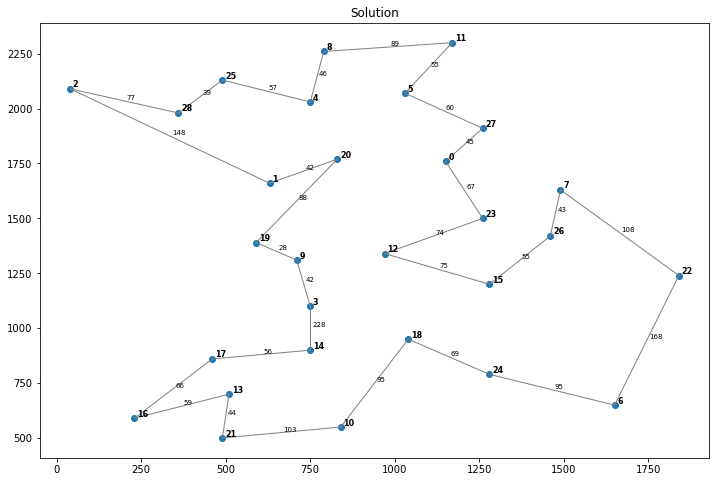

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2092.0 
 best_permutation: [24 15 18 14 10 21 13 16 17  3 19  9 12 23  0 20  1  2 28 25  4  8 11  5
 27  7 26 22  6]


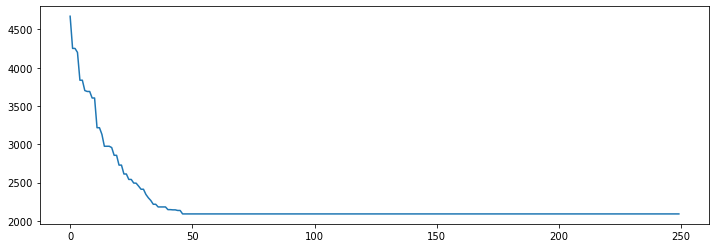

<Figure size 864x576 with 0 Axes>

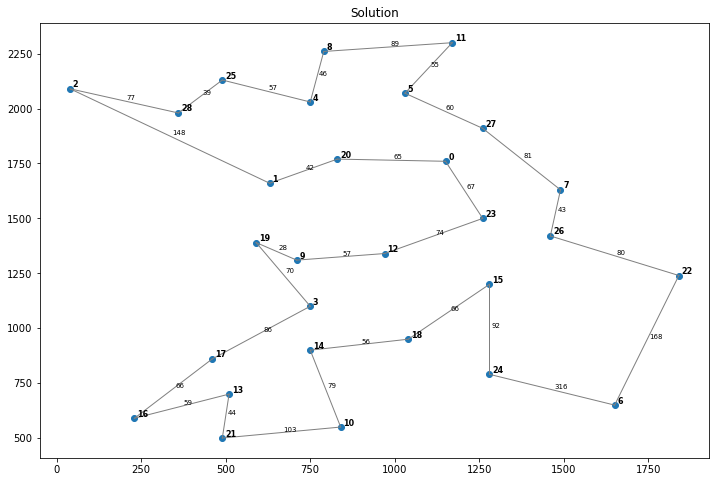

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 2068.0 
 best_permutation: [21 13 16 17 14  3  9 19 20  1  2 28 25  4  8 11  5 27  0  7 22 26 23 12
 15 18 24  6 10]


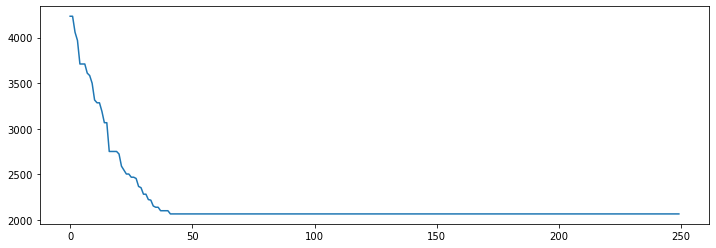

<Figure size 864x576 with 0 Axes>

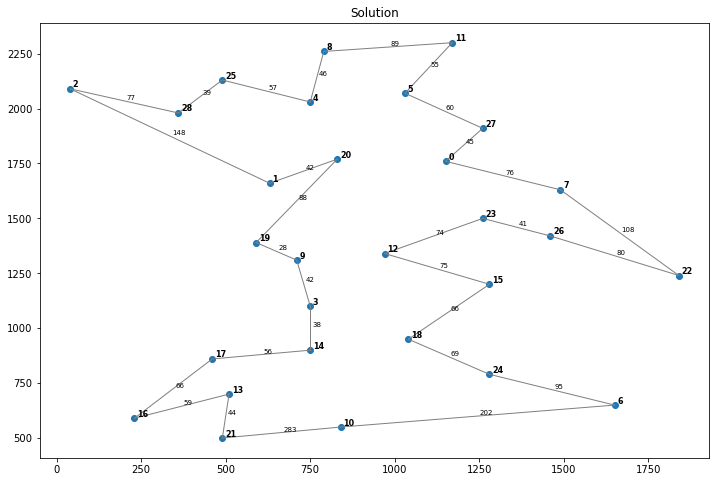

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2067.0 
 best_permutation: [25  4  8 11  5 27  0 23  7 26 22  6 24 18 10 21 13 16 17 14  3 15 12  9
 19 20  1  2 28]


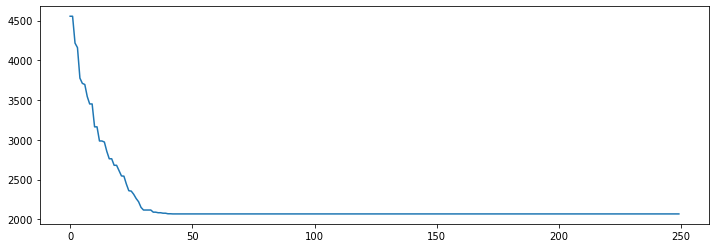

<Figure size 864x576 with 0 Axes>

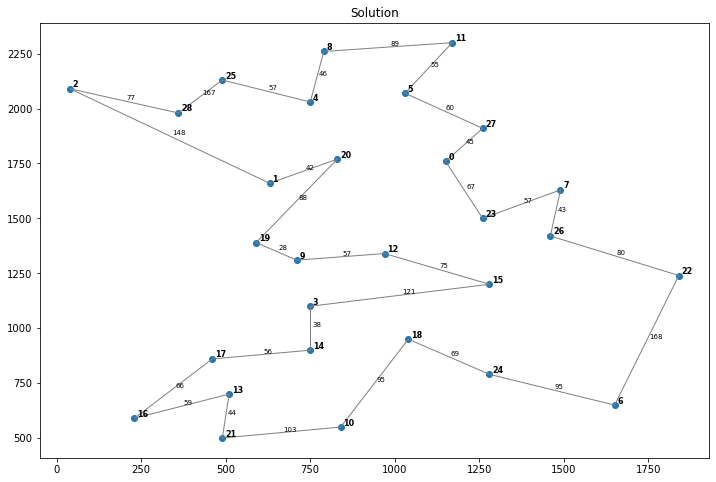

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 2035.0 
 best_permutation: [ 5 27  0 23  7 26 22  6 24 15 12 18 10 21 13 16 17 14  3  9 19 20  1  2
 28 25  4  8 11]


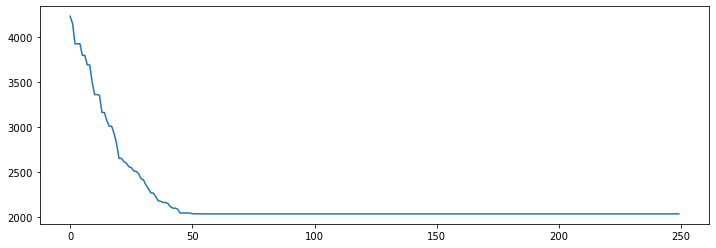

<Figure size 864x576 with 0 Axes>

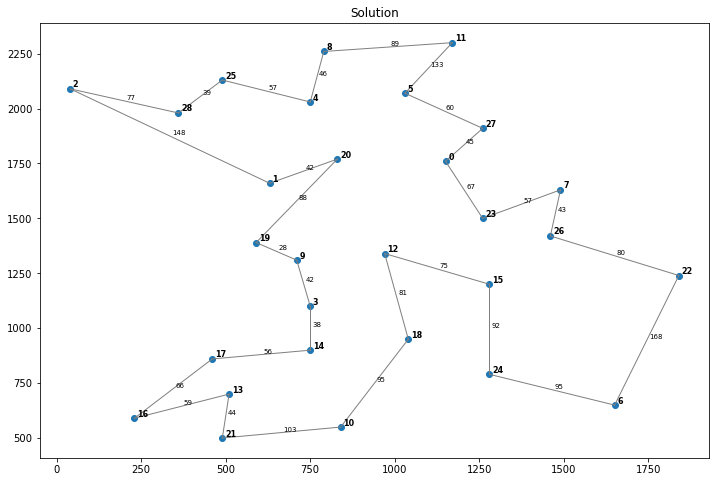

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2065.0 
 best_permutation: [24  6 22 26 15 23  7 27  0 20  5 11  8  4 25 28  2  1 19  9 12  3 14 17
 16 13 21 10 18]


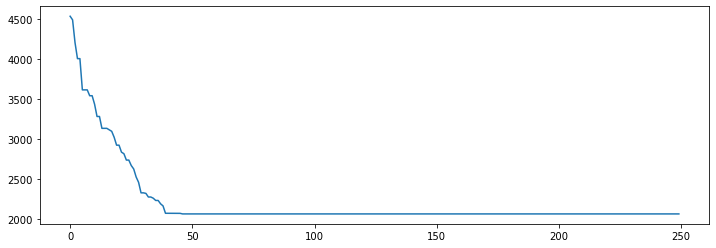

<Figure size 864x576 with 0 Axes>

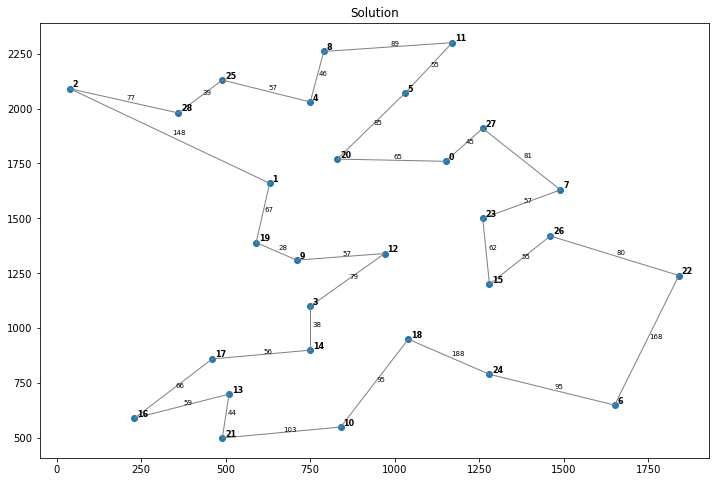

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 250 
 tsp_objective_function: 2068.0 
 best_permutation: [19  1  2 28 25  4  8 11  5 20  0 27  7 26 23 12 15 22  6 24 18 10 21 13
 16 17 14  3  9]


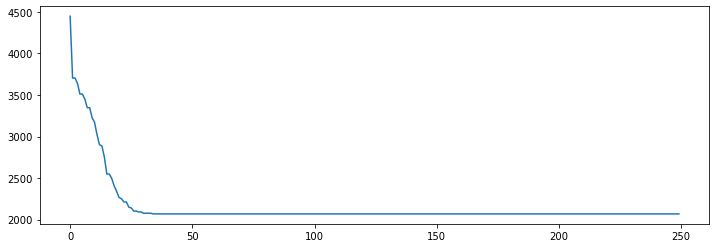

<Figure size 864x576 with 0 Axes>

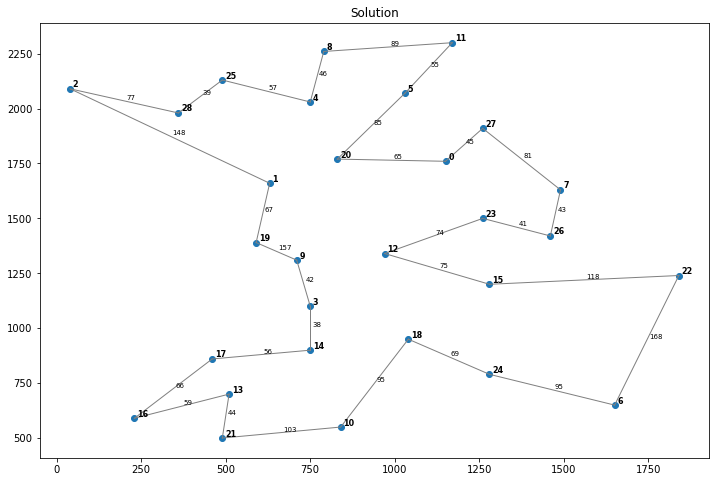

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.225 
 number_of_iterations = 250 
 tsp_objective_function: 2100.0 
 best_permutation: [ 5 11  8  4 25 28  2  1 19  9  3 14 17 16 13 21 10 24  6 18 15 12 23 26
 22  7 27  0 20]


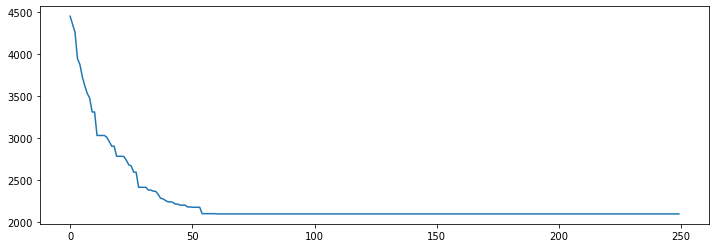

<Figure size 864x576 with 0 Axes>

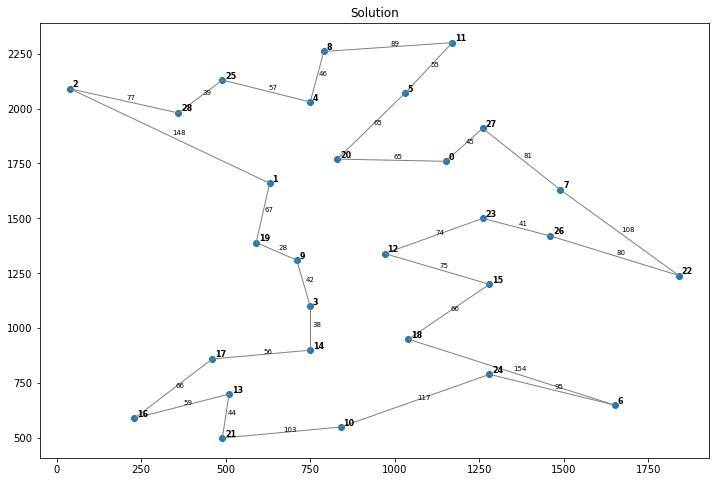

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 250 
 tsp_objective_function: 2138.0 
 best_permutation: [ 4  1 20  0 27  7 23 26 22  6 24 15 12 18 10 21 13 16 17 14  3  9 19  2
 28 25  8 11  5]


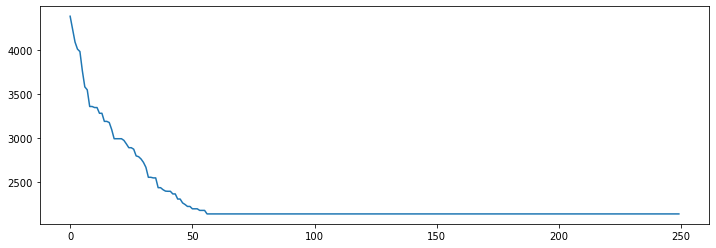

<Figure size 864x576 with 0 Axes>

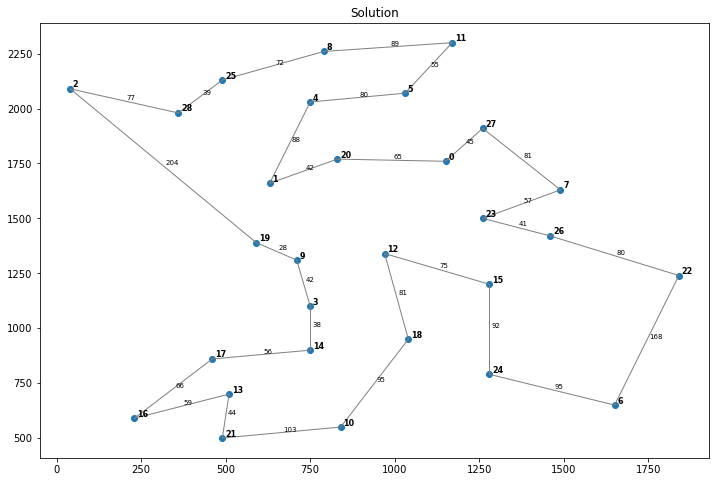

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.275 
 number_of_iterations = 250 
 tsp_objective_function: 2065.0 
 best_permutation: [13 16 17  3 19  9 12 20  1  2 28 25  4  8 11  5 27  0 23 15 26  7 22  6
 24 18 14 10 21]


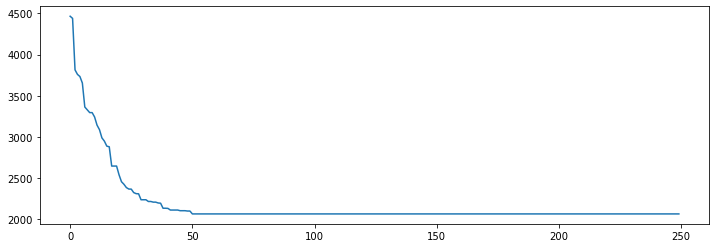

<Figure size 864x576 with 0 Axes>

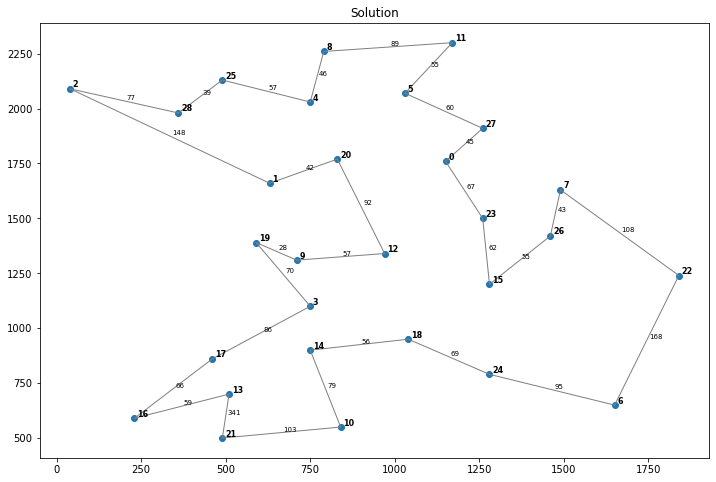

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 250 
 tsp_objective_function: 2036.0 
 best_permutation: [23 26  7  0 27  5 11  8  4 25 28  2  1 20 19  9  3 14 17 16 13 21 10 18
 24  6 22 15 12]


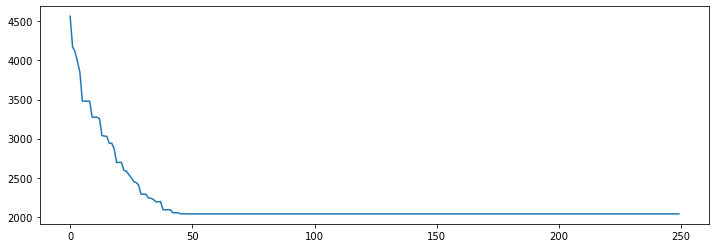

<Figure size 864x576 with 0 Axes>

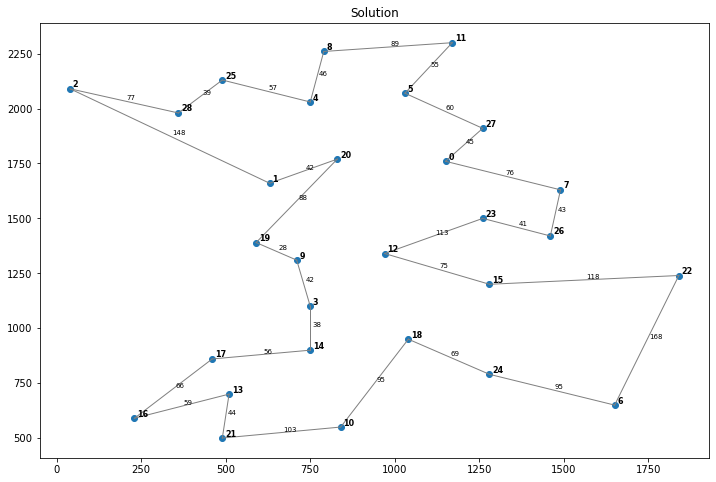

In [192]:
dist_matr = [bays29_dist]
coords = bays29_coords
num = [29]
pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.2, 0.225, 0.25, 0.275, 0.3]
num_of_iter = [250]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

## kroA100

In [176]:
def kroA100():
    coords_string = """1 1380 939
    2 2848 96
    3 3510 1671
    4 457 334
    5 3888 666
    6 984 965
    7 2721 1482
    8 1286 525
    9 2716 1432
    10 738 1325
    11 1251 1832
    12 2728 1698
    13 3815 169
    14 3683 1533
    15 1247 1945
    16 123 862
    17 1234 1946
    18 252 1240
    19 611 673
    20 2576 1676
    21 928 1700
    22 53 857
    23 1807 1711
    24 274 1420
    25 2574 946
    26 178 24
    27 2678 1825
    28 1795 962
    29 3384 1498
    30 3520 1079
    31 1256 61
    32 1424 1728
    33 3913 192
    34 3085 1528
    35 2573 1969
    36 463 1670
    37 3875 598
    38 298 1513
    39 3479 821
    40 2542 236
    41 3955 1743
    42 1323 280
    43 3447 1830
    44 2936 337
    45 1621 1830
    46 3373 1646
    47 1393 1368
    48 3874 1318
    49 938 955
    50 3022 474
    51 2482 1183
    52 3854 923
    53 376 825
    54 2519 135
    55 2945 1622
    56 953 268
    57 2628 1479
    58 2097 981
    59 890 1846
    60 2139 1806
    61 2421 1007
    62 2290 1810
    63 1115 1052
    64 2588 302
    65 327 265
    66 241 341
    67 1917 687
    68 2991 792
    69 2573 599
    70 19 674
    71 3911 1673
    72 872 1559
    73 2863 558
    74 929 1766
    75 839 620
    76 3893 102
    77 2178 1619
    78 3822 899
    79 378 1048
    80 1178 100
    81 2599 901
    82 3416 143
    83 2961 1605
    84 611 1384
    85 3113 885
    86 2597 1830
    87 2586 1286
    88 161 906
    89 1429 134
    90 742 1025
    91 1625 1651
    92 1187 706
    93 1787 1009
    94 22 987
    95 3640 43
    96 3756 882
    97 776 392
    98 1724 1642
    99 198 1810
    100 3950 1558"""
    best_perm_string = """1
    47
    93
    28
    67
    58
    61
    51
    87
    25
    81
    69
    64
    40
    54
    2
    44
    50
    73
    68
    85
    82
    95
    13
    76
    33
    37
    5
    52
    78
    96
    39
    30
    48
    100
    41
    71
    14
    3
    43
    46
    29
    34
    83
    55
    7
    9
    57
    20
    12
    27
    86
    35
    62
    60
    77
    23
    98
    91
    45
    32
    11
    15
    17
    59
    74
    21
    72
    10
    84
    36
    99
    38
    24
    18
    79
    53
    88
    16
    94
    22
    70
    66
    26
    65
    4
    97
    56
    80
    31
    89
    42
    8
    92
    75
    19
    90
    49
    6
    63"""
    n = 100
    coords = np.zeros((n, 2))
    it = iter(coords_string.split())
    for i in range(n):
        next(it)
        coords[i, 0] = float(next(it))
        coords[i, 1] = float(next(it))
    best_perm = np.zeros(n, dtype="i")
    it = iter(best_perm_string.split())
    for i in range(n):
        best_perm[i] = int(next(it)) - 1
    distance_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            distance_matrix[i, j] = np.sqrt(((coords[i, :] - coords[j, :])**2).sum())
    return distance_matrix, best_perm, coords

In [182]:
kroA100_dist, kroA100_best_perm, kroA100_coords = kroA100()

<Figure size 864x576 with 0 Axes>

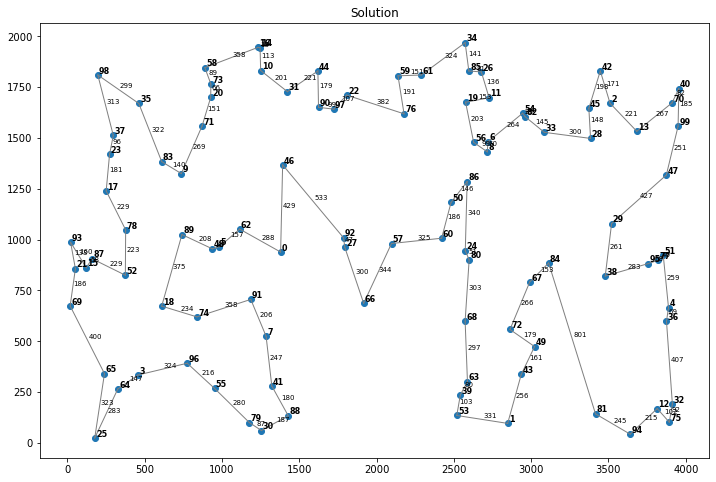

[ 0 46 92 27 66 57 60 50 86 24 80 68 63 39 53  1 43 49 72 67 84 81 94 12
 75 32 36  4 51 77 95 38 29 47 99 40 70 13  2 42 45 28 33 82 54  6  8 56
 19 11 26 85 34 61 59 76 22 97 90 44 31 10 14 16 58 73 20 71  9 83 35 98
 37 23 17 78 52 87 15 93 21 69 65 25 64  3 96 55 79 30 88 41  7 91 74 18
 89 48  5 62] 21285.44318157108


In [183]:
plot_path(kroA100_dist, kroA100_coords, kroA100_best_perm)
print(kroA100_best_perm, tsp_objective_function(kroA100_dist, kroA100_best_perm))

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 22079.55431762287 
 best_permutation: [11 26 34 85 19 61 59 76 22 97 90 44 31 10 14 16 58 73 20 71  9 83 35 98
 37 23 17 78 89 48  5 74 18 52 87 15 93 21 69 65 25 64  3 96 55 79 30 88
 41  7 91  0 62 46 92 27 57 66 63 39 53  1 43 49 81 94 12 75 32 36  4 51
 77 95 38 29 47 99 40 70 13  2 42 45 28 33 82 54 84 67 72 68 80 24 60 50
 86 56  8  6]


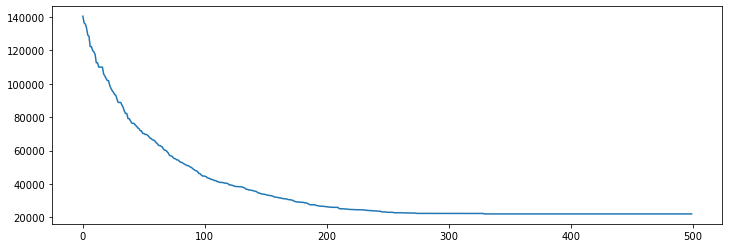

<Figure size 864x576 with 0 Axes>

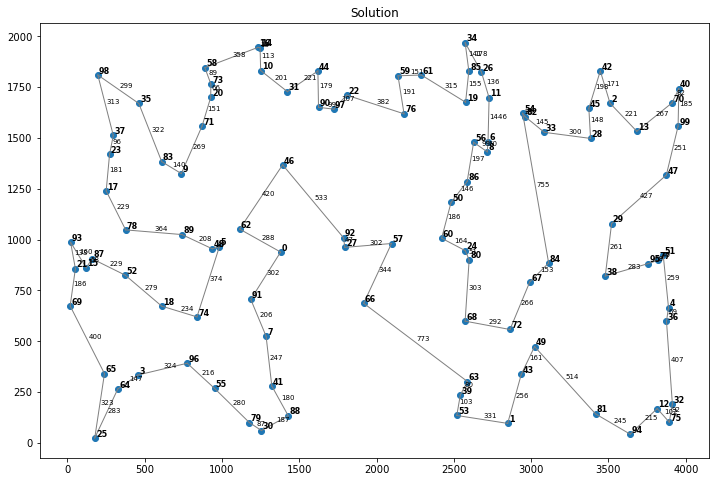

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 23109.33681211367 
 best_permutation: [94 75 32 12 49 72 67 84 38 29 95 36  4 77 51 47 99 40 70 13  2 42 45 28
 33 82 54 11 26 34 85 19  6  8 56 86 50 60 57 27 92  0 46 90 97 22 76 61
 59 44 31 10 14 16 58 73 20 71  9 83 35 98 37 23 17 78 52 87 15 93 21 69
 65 25 64  3 96 55 74 18 89 48  5 62 91  7 41 79 30 88 66 24 80 68 63 39
 53  1 43 81]


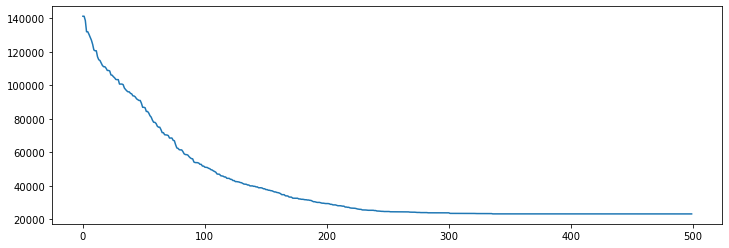

<Figure size 864x576 with 0 Axes>

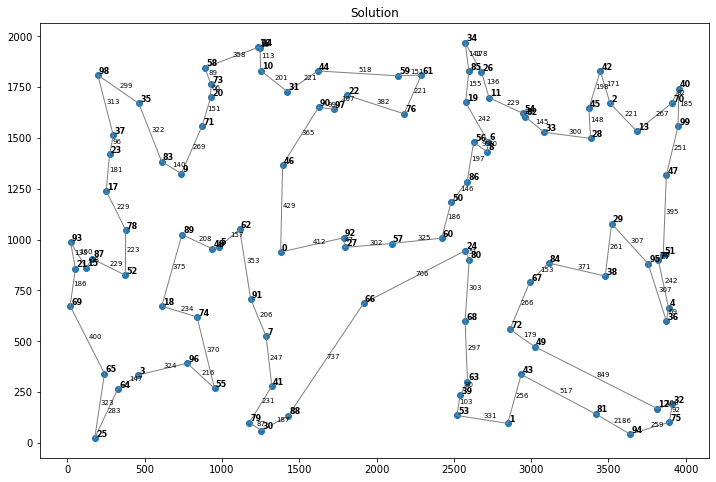

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 23086.201658385467 
 best_permutation: [50 60 68 43  1 53 39 63 66 57 27 92  0 62  5 91  7 41 88 30 79 55 96  3
 64 25 65 69 21 15 87 93 78 52 18 74 48 89  9 83 17 23 37 98 35 58 73 20
 71 46 10 16 14 31 44 90 97 22 59 61 76 86  8  6 56 19 85 34 26 11 54 82
 33 28 45 42  2 13 70 40 99 47 29 38 95 77 51  4 36 32 75 12 94 81 49 72
 67 84 80 24]


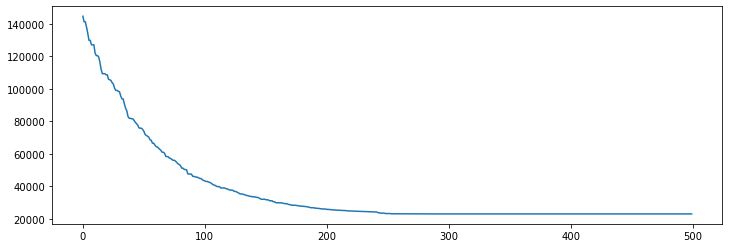

<Figure size 864x576 with 0 Axes>

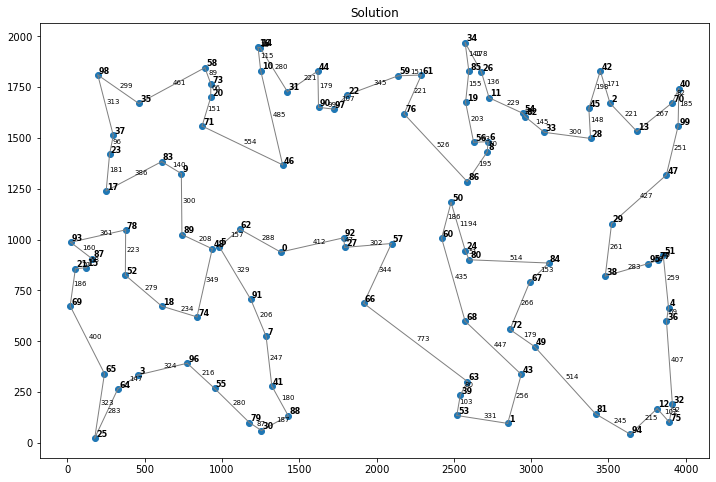

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 23653.68047909633 
 best_permutation: [72 67 84 38 29 95 77 51  4 36 32 75 12 94 81 49 43  1 63 39 53  7 41 88
 30 79 55 96 18 74 91 62  5 48 89  9 83 52  3 64 25 65 69 21 93 15 87 78
 17 23 37 98 35 71 20 73 58 16 14 10 31 44 22 97 90 46  0 92 27 66 57 76
 59 61 34 85 26 19 11 54 82 42 40 70 99 47 13  2 45 28 33  6  8 56 86 50
 60 24 80 68]


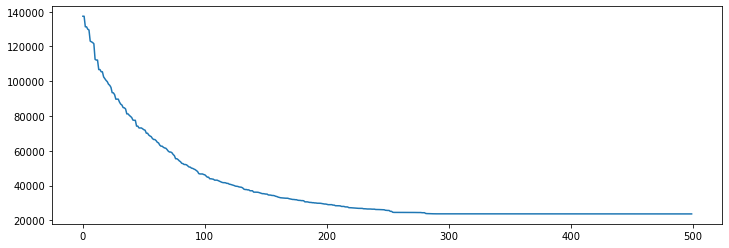

<Figure size 864x576 with 0 Axes>

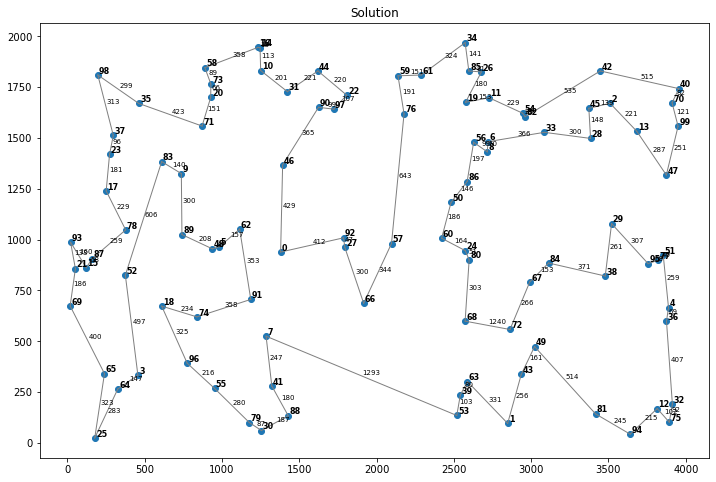

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 22506.462029315837 
 best_permutation: [58 73 20 71  9 83 35 98 37 23 17 93 21 69 15 87 52 78 89 48  5 74 18 65
 25 64  3 96 55 79 30 88 41  7 91  0 62 46 92 27 66 57 60 24 80 68 72 49
 43 63 39 53  1 81 94 12 75 32 36  4 51 77 95 29 38 84 67 50 86 56  8  6
 33 28 13 47 99 70 40  2 42 45 82 54 11 19 26 85 34 61 59 76 22 97 90 44
 31 10 14 16]


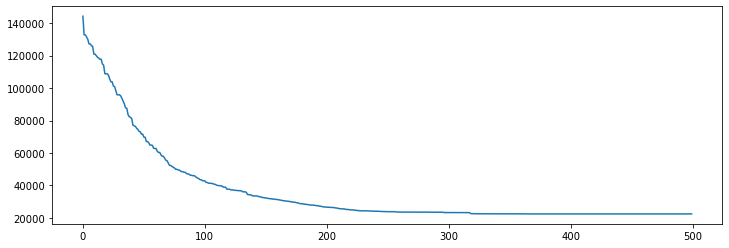

<Figure size 864x576 with 0 Axes>

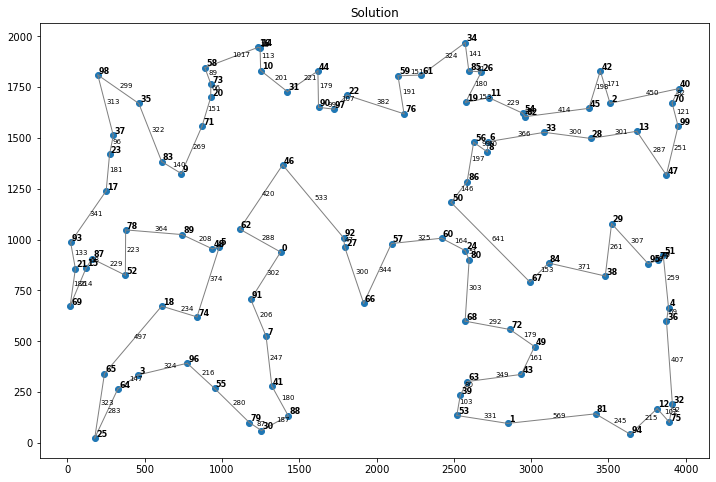

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 23688.920075188493 
 best_permutation: [38 29  8  6 56 86 50 24 80 68 66  7 41 88 30 79 55 96 74 89 18  3 64 25
 65 69 21 93 15 87 52 78  9 83 17 23 37 98 35 71 20 73 58 16 14 10 31 44
 22 97 90 46 62  5 48 91  0 92 27 57 60 76 59 61 34 85 26 19 11 54 82 33
 45 42  2 28 13 70 40 99 47 51 77 95  4 36 32 75 12 94 81  1 53 39 63 43
 49 72 67 84]


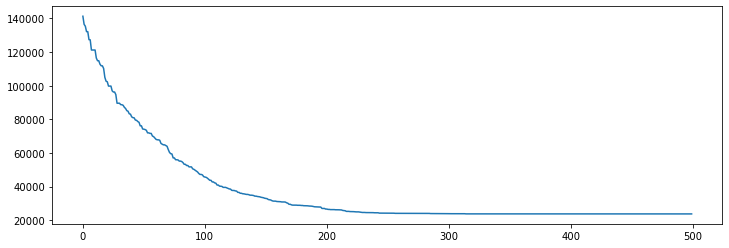

<Figure size 864x576 with 0 Axes>

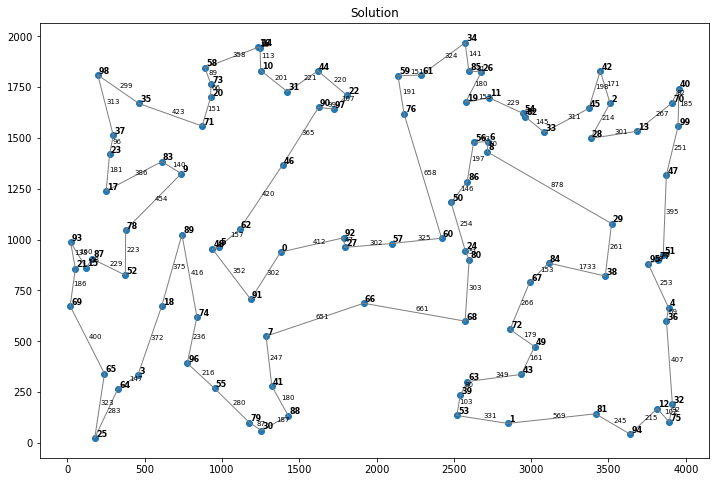

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 24151.74381992788 
 best_permutation: [62 46 90 97 22 44 31 10 14 16 58 73 20 71 35 98 37 23 17 93 78 83  9 89
 74 18 52 87 15 21 69 65 25 64  3 96 55 79 30 41 88 53  1 39 63 68 80 67
 84 38 49 72 43 81 94 12 75 32 36  4 95 77 51 47 99 40 70 13  2 42 45 28
 29 33 82 54 11 26 85 34 61 59 76 19 56  6  8 86 50 24 60 57 66 27 92  0
  7 91 48  5]


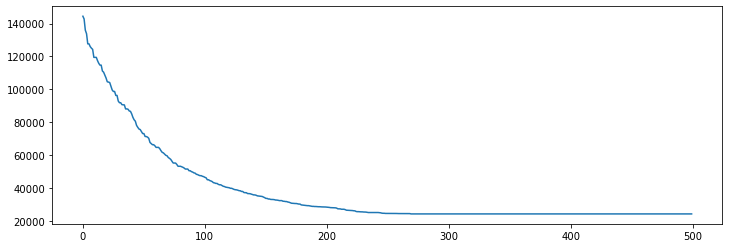

<Figure size 864x576 with 0 Axes>

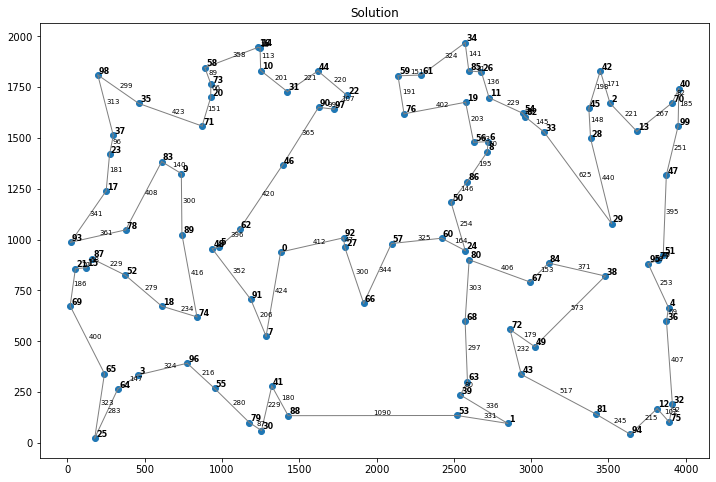

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 24486.971210692078 
 best_permutation: [33 82 54  6 19 11 26 85 34 61 59 22 44 31 10 14 16 58 73 20 35 98 37 23
 17 83  9 71 46 90 97 76 56  8 86 50 84 67 49 72 68 80 24 60 57 66 27 92
  0 62  5 48 89 78 87 15 93 21 69 52 18  3 64 65 25 30 79 55 96 74 91  7
 41 88 53 39 63  1 43 81 94 12 75 32 36  4 51 77 95 38 29 47 99 40 70 13
  2 42 45 28]


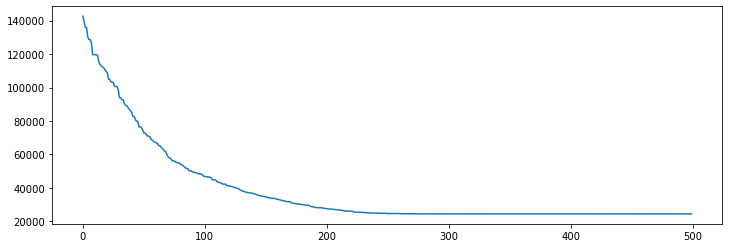

<Figure size 864x576 with 0 Axes>

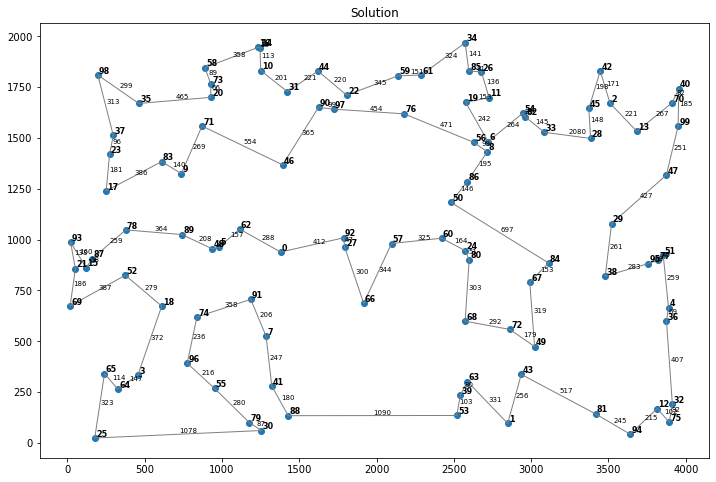

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22406.030780094 
 best_permutation: [21 69 65 25 64  3 96 55 79 30 88 41  7 91  0 92 27 66 57 60 50 86 56  6
  8 24 80 68 63 39 53  1 81 94 75 32 12 43 49 72 67 84 38 36  4 51 77 95
 29 47 99 40 70 13  2 42 45 28 33 82 54 11 19 26 85 34 61 59 76 22 97 90
 44 14 16 10 31 46 62  5 48 74 18 89  9 83 71 20 73 58 35 98 37 23 17 78
 52 87 15 93]


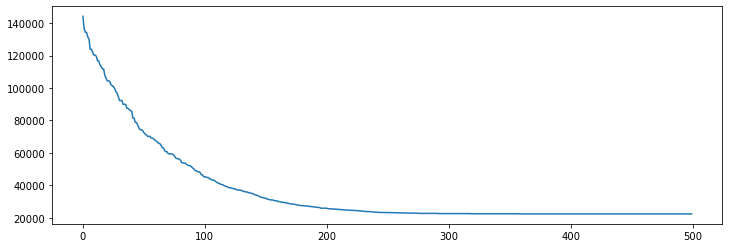

<Figure size 864x576 with 0 Axes>

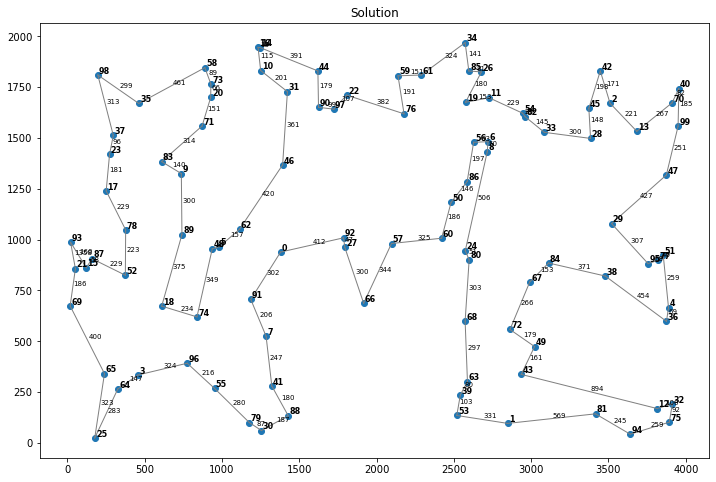

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 23858.00633424706 
 best_permutation: [95 29 28 47 99 40 70 13  2 42 45 33 82 54 11 26 85 34 61 19 56  6  8 86
 50 24 80 60 57 76 59 22 97 90 44 31 10 14 16 58 73 20 71 46 92 27  0 62
  5 48 89  9 83 35 98 37 23 17 93 21 69 15 87 78 52 65 25 64  3 96 18 74
 91  7 55 79 30 88 41 66 68 72 63 39 53  1 43 49 67 84 38 81 94 12 75 32
 36  4 51 77]


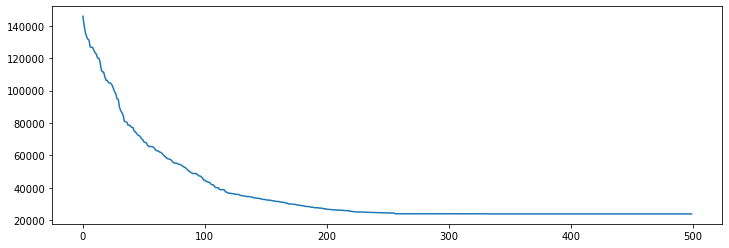

<Figure size 864x576 with 0 Axes>

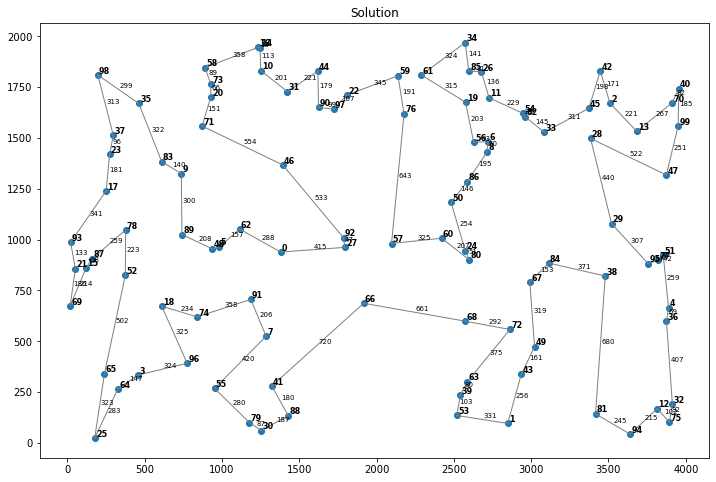

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 23391.664718187858 
 best_permutation: [85 34 61 59 22 97 90 44 14 16 10 31 46 62  5 48 91 74 18 89 78 83  9 71
 20 73 58 35 98 37 23 17 93 21 15 87 52 69 65 25 64  3 96 55 79 30 88 41
  7  0 92 27 66 57 76 86 50 60 24 80 68 63 39 53  1 94 75 32 12 81 43 49
 72 67 84 38 36  4 51 77 95 29 47 99 40 70 13  2 42 45 28 33 82 54  6  8
 56 19 11 26]


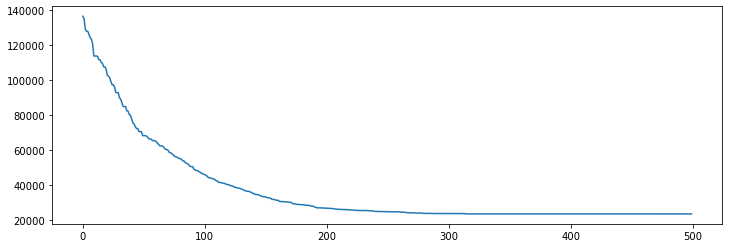

<Figure size 864x576 with 0 Axes>

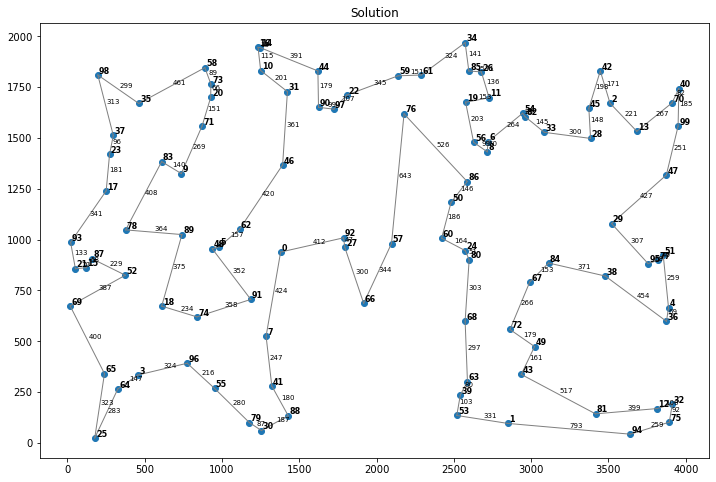

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22411.851819033334 
 best_permutation: [82 54 11 26 85 34 61 59 76 19  6  8 56 86 50 92 46 90 97 22 44 31 10 14
 16 58 73 20 71  9 83 35 98 37 23 17 93 87 15 21 69 65 25 64  3 96 55 79
 30 88 41  7 74 18 52 78 89 48  5 62 91  0 27 66 57 60 24 80 68 63 39 53
  1 43 49 72 67 84 29 38 81 94 12 75 32 36  4 95 77 51 47 99 40 70 13  2
 42 45 28 33]


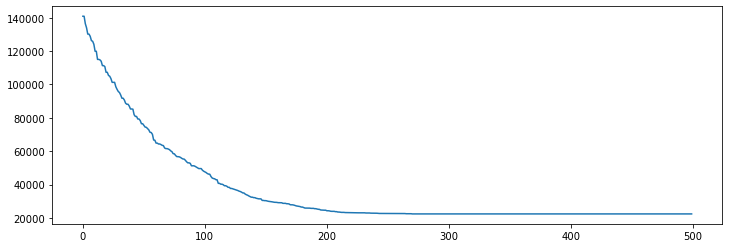

<Figure size 864x576 with 0 Axes>

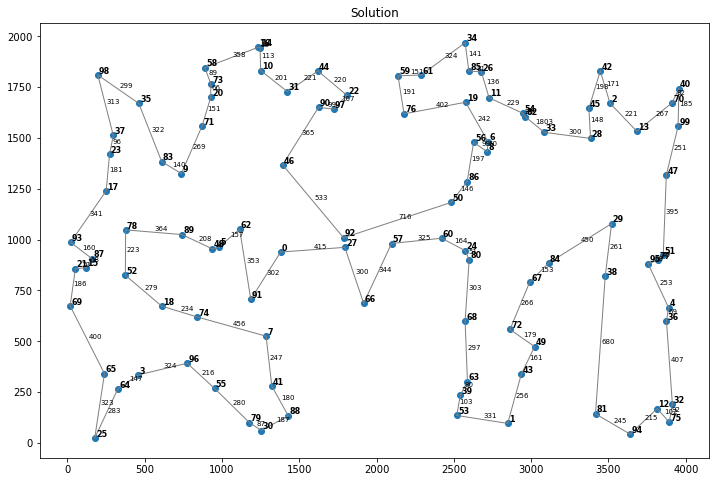

In [196]:
dist_matr = [kroA100_dist]
coords = kroA100_coords
num = [100]
pop_size = [1000]
cross_prob = [0.975, 0.95, 0.9, 0.85]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [500]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 23623.98407380345 
 best_permutation: [55 41  7 91 74 96  3 64 25 65 18 52 87 15 69 21 93 78 17 23 37 98 35 83
  9 71 20 73 58 16 14 10 31 44 90 97 22 76 59 61 34 85 26 11 19  6  8 56
 86 50 67 84 38 95 29 28 33 82 54 45 42  2 13 70 40 99 47 51 77  4 36 32
 75 12 94 81  1 53 39 63 43 49 72 68 80 24 60 57 27 92 46 62 89 48  5  0
 66 88 30 79]


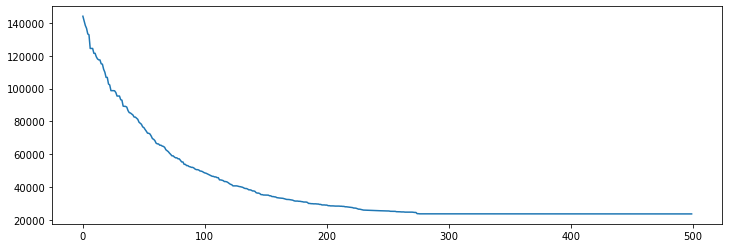

<Figure size 864x576 with 0 Axes>

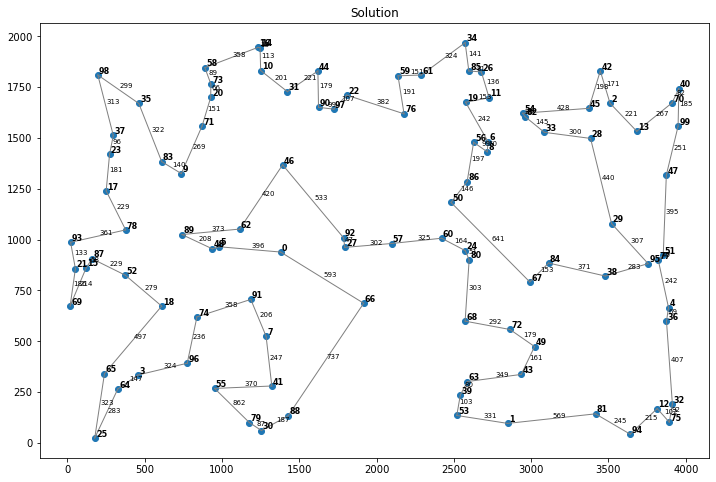

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 22624.38661079659 
 best_permutation: [80 24 60 50 86 56  8  6 33 82 54 11 19 26 85 34 61 59 76 57 27 92  0  7
 91  5 48 89 62 46 90 97 22 44 31 10 14 16 58 73 20 71  9 83 35 98 37 23
 17 78 52 87 15 93 21 69 65 25 64  3 18 74 96 55 79 30 88 41 66 63 39 53
  1 43 81 94 12 75 32 36  4 95 77 51 47 99 40 70 13  2 42 45 28 29 38 84
 67 49 72 68]


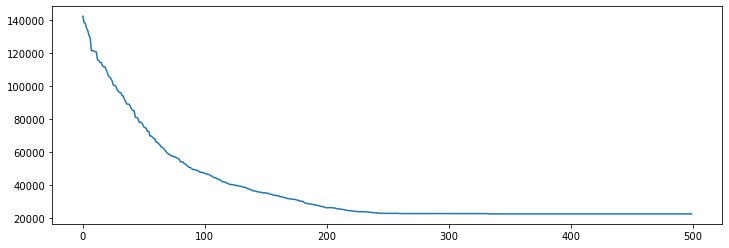

<Figure size 864x576 with 0 Axes>

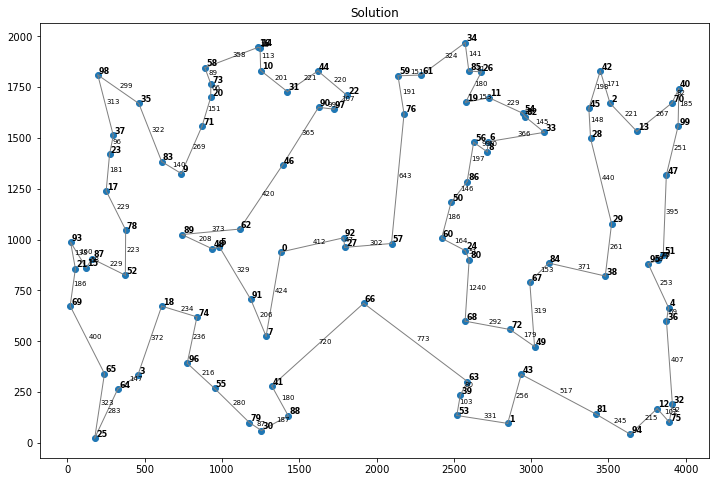

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 23146.31853354333 
 best_permutation: [23 83  9 89 78 17 93 21 69 15 87 52 65 25 64  3 18 74 96 55 79 30 88 41
  7 91 48  5 62  0 66 53 39 63 68 80 24 84 67 72 49 43  1 81 94 12 75 32
 36  4 51 77 95 38 29 47 99 40 70 13  2 42 45 28 33 82 54 11 19 26 85 34
 61 59 22 97 76 56  6  8 86 50 60 57 27 92 46 90 44 31 10 14 16 58 73 20
 71 35 98 37]


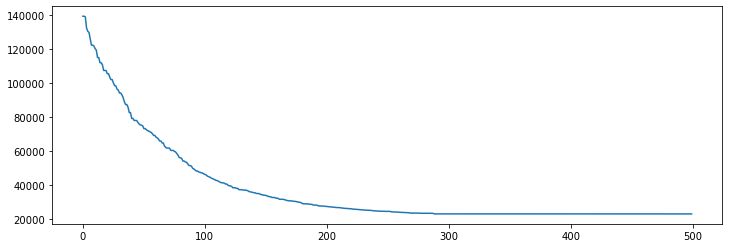

<Figure size 864x576 with 0 Axes>

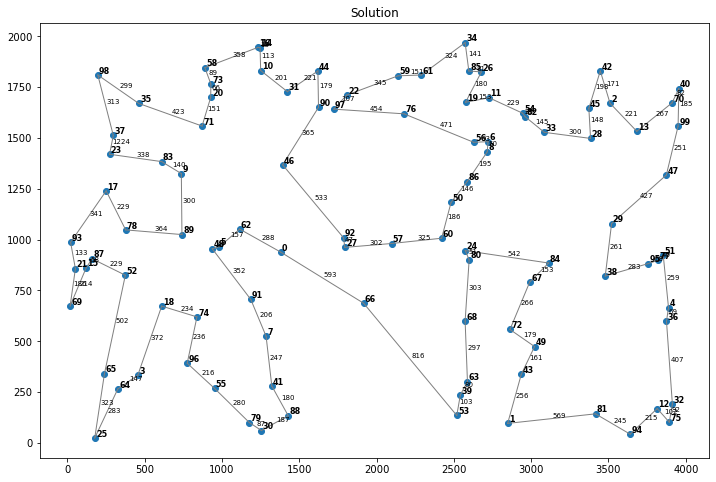

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 22789.779870444974 
 best_permutation: [21 93 17 23 37 98 35 83 89  9 71 20 73 58 16 14 10 31 44 90 97 22 76 59
 61 34 85 26 19 56  8  6 11 54 82 33 28 45 42  2 13 70 40 99 47 29 38 95
 77 51  4 36 32 75 12 94 81 49 84 67 80 24 86 50 60 68 72 43  1 53 39 63
 66 57 27 92 46  0 62  5 48 18 74 91  7 41 88 30 79 55 96  3 64 25 65 52
 78 87 15 69]


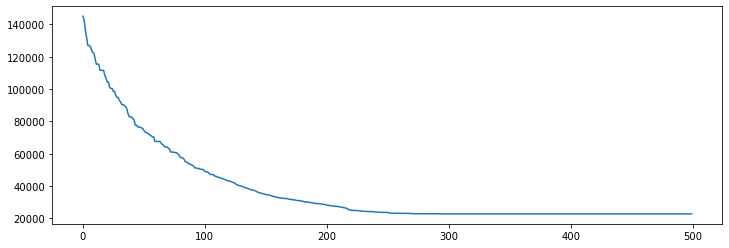

<Figure size 864x576 with 0 Axes>

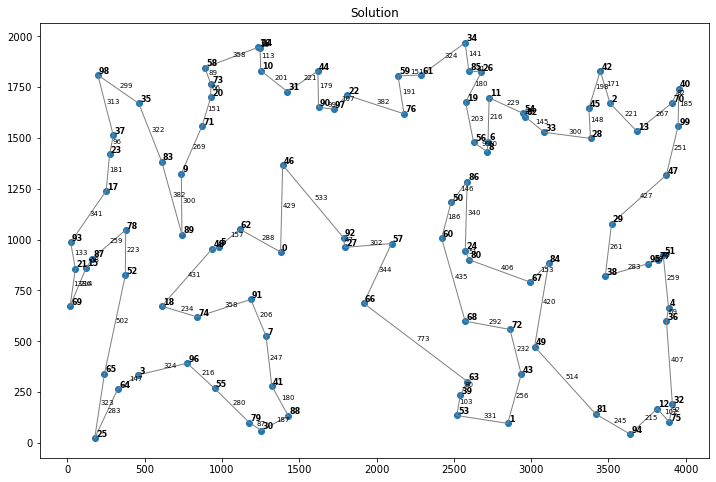

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22007.902567286386 
 best_permutation: [61 34 85 26 19 56 86  8  6 11 54 82 33 28 45 42  2 13 70 40 99 47 29 38
 95 77 51  4 36 32 75 12 94 81 43  1 53 39 63 49 84 67 72 68 80 24 50 60
 57 66 27 92  0 91 62  5 48 89 18 74  7 41 88 30 79 55 96  3 64 25 65 69
 21 93 15 87 52 78 17 23 37 98 35 83  9 71 20 73 58 16 14 10 31 46 90 44
 97 22 76 59]


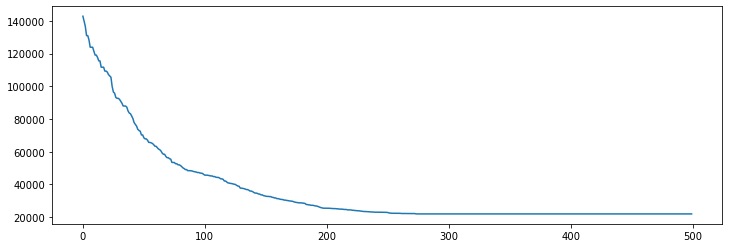

<Figure size 864x576 with 0 Axes>

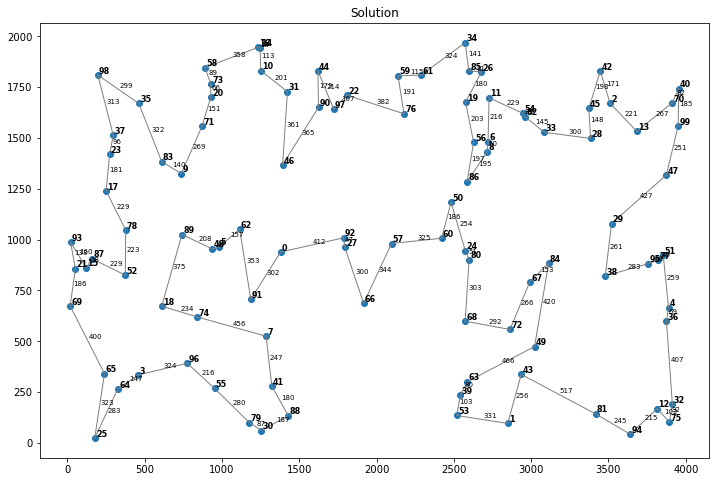

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 22566.276288994395 
 best_permutation: [42 45 28 33 82 54 11 26 34 85 19  6  8 56 86 50 24 80 60 57 27 92 46 90
 97 76 61 59 22 44 31 10 14 16 58 73 20 71 83 35 98 37 23 17 78 52 87 15
 93 21 69 65 25 64  3 96 55 79 30 88 41  7 91 74 18 89  9 48  5 62  0 66
 68 63 39 53  1 43 72 67 84 49 81 94 12 75 32 36  4 51 77 95 38 29 47 99
 40 70 13  2]


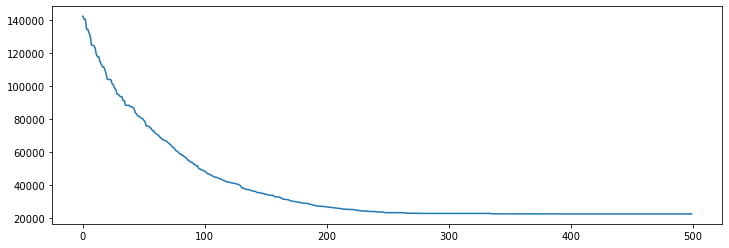

<Figure size 864x576 with 0 Axes>

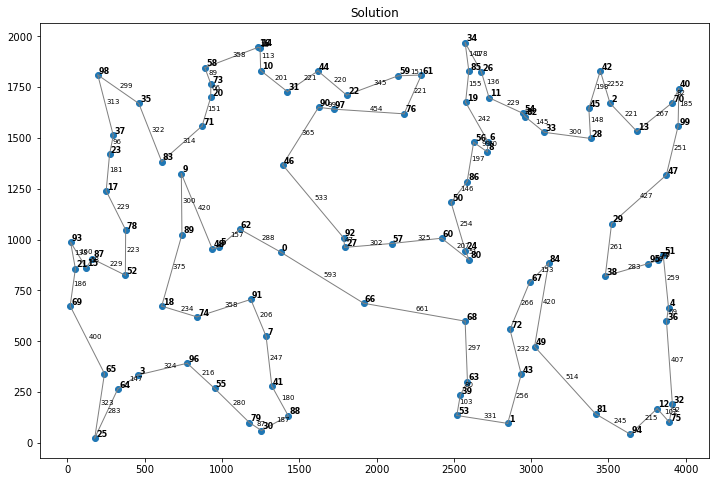

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 23685.681753160978 
 best_permutation: [12 94 81 49 72 43  1 53 39 63 68 88 41 30 79 55 96 74  7 91  0 62  5 48
 89 52 18  3 64 25 65 69 21 93 15 87 78 17 23 37 98 35 83  9 71 20 73 58
 16 14 10 31 44 97 90 46 92 27 66 57 22 76 59 61 34 85 26 19 11 54 82  6
  8 56 86 50 60 24 80 67 84 38 29 13 28 33 45 42  2 40 70 99 47 51 77 95
  4 36 32 75]


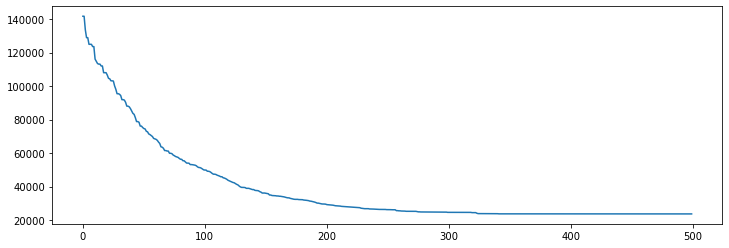

<Figure size 864x576 with 0 Axes>

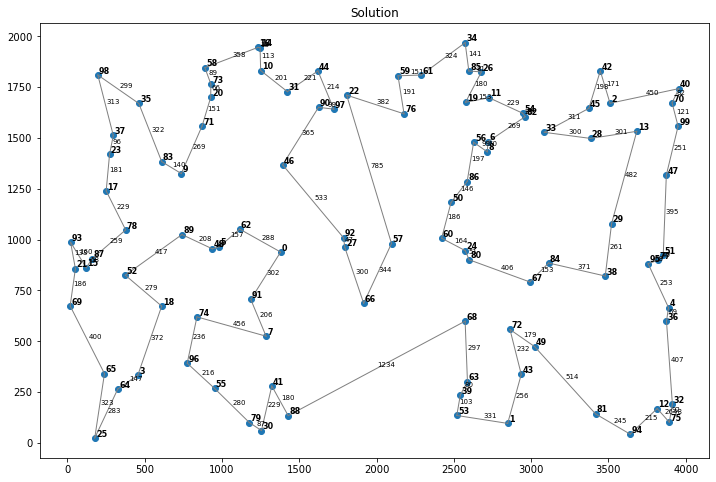

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 23367.13572168549 
 best_permutation: [81  1 63 39 53 88 30 79 55 41  7 91  0 27 92 46 62  5 48 89 52 18 74 96
  3 64 25 65 69 21 15 87 93 78 17 23 37 98 35 83  9 71 20 73 58 16 14 10
 31 44 90 97 22 76 59 61 34 85 26 19 11 54 82 45 42  2 40 70 99 47 13 28
 33  6  8 56 86 50 24 80 60 57 66 68 72 43 49 67 84 38 29 95 77 51  4 36
 32 75 12 94]


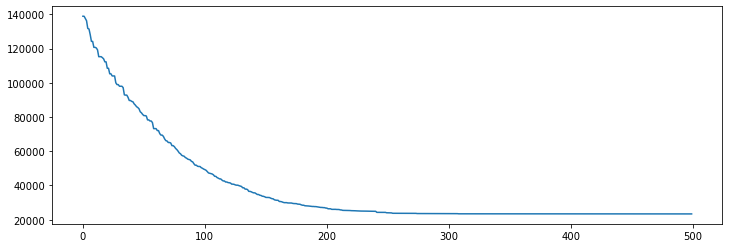

<Figure size 864x576 with 0 Axes>

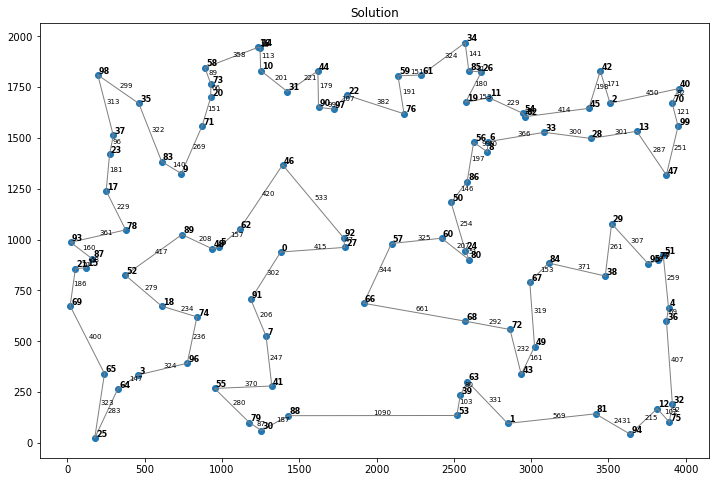

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 23041.061191866193 
 best_permutation: [42 45 28 33 82 54 11  6  8 56 19 26 85 34 61 59 44 31 10 14 16 58 73 20
 71 35 98 37 23 17 93 87 15 21 69 65 25 64  3 96 55 79 30 88 41  7 91 74
 18 52 78 83  9 89 48  5 62  0 27 92 46 90 97 22 76 50 86 84 67 49 43 72
 68 80 24 60 57 66 63 39 53  1 81 94 12 75 32 36  4 51 77 95 38 29 47 99
 40 70 13  2]


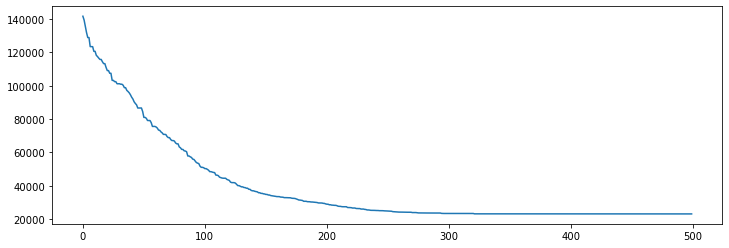

<Figure size 864x576 with 0 Axes>

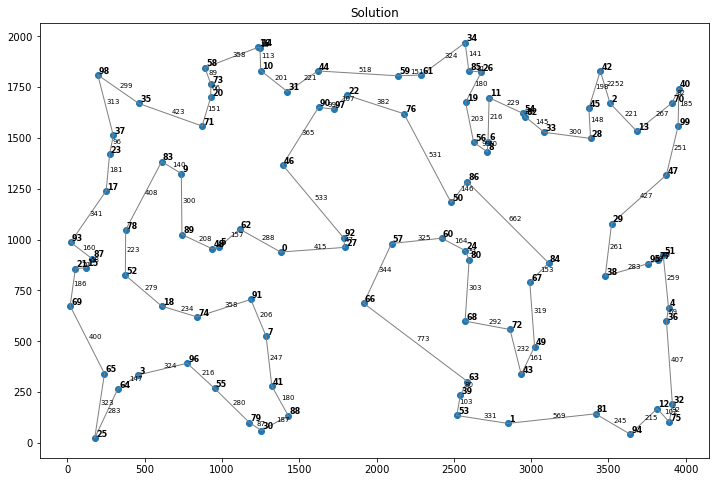

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22684.86289435373 
 best_permutation: [11 54 82 33 28 45  2 13 47 99 70 40 42 26 85 34 61 59 76 22 97 90 44 31
 10 14 16 58 73 20 71  9 83 35 98 37 23 17 78 87 15 93 21 69 65 25 64  3
 18 52 89 48  5 62 46  0 91  7 74 96 55 79 30 88 41 66 27 92 57 60 68 63
 39 53  1 43 72 49 81 94 12 75 32 36  4 51 77 95 29 38 84 67 80 24 50 86
  8  6 56 19]


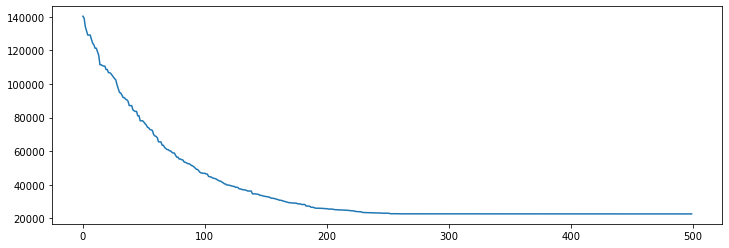

<Figure size 864x576 with 0 Axes>

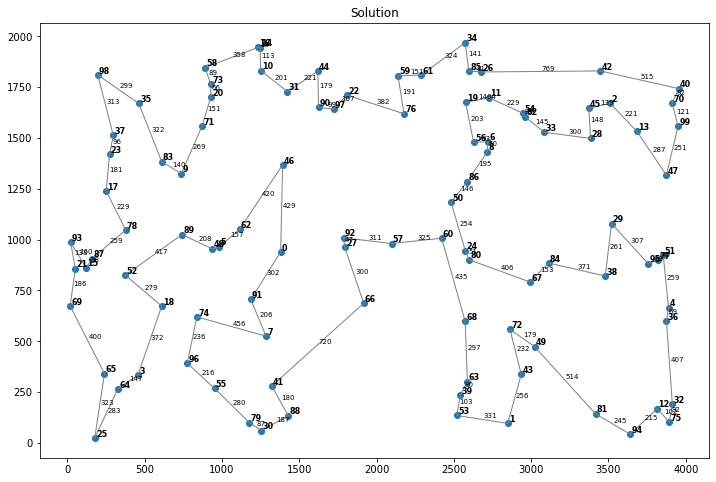

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 22759.90294199276 
 best_permutation: [63 72 68 60 57 66 27 92 46  0 91  7 41 88 30 79 55 96 74 18  3 64 25 65
 69 21 15 93 17 78 87 52 89 48  5 62  9 83 23 37 98 35 71 20 73 58 16 14
 10 31 44 90 97 22 76 59 61 19 85 34 26 11 54 82 33  6  8 56 86 50 24 80
 67 84 38 29 13  2 28 45 42 40 70 99 47 51 77 95  4 36 32 75 12 94 81 49
 43  1 53 39]


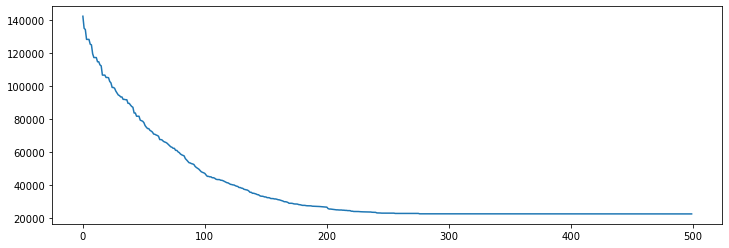

<Figure size 864x576 with 0 Axes>

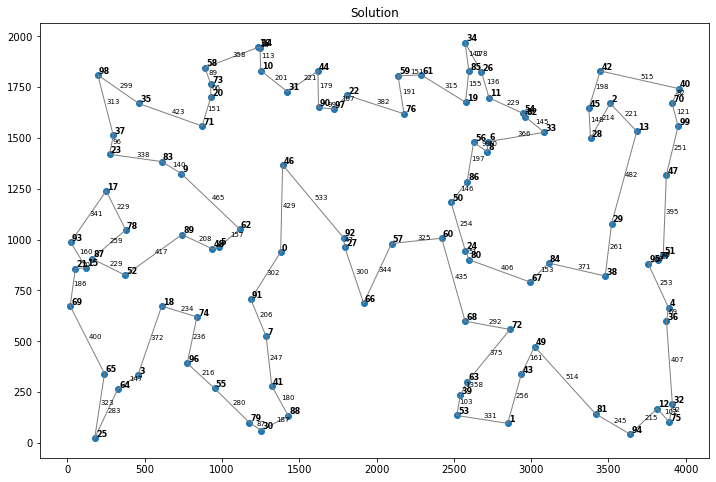

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 23929.106104817492 
 best_permutation: [77 51 47 99 40 70 13  2 42 45 28 29 38 84 33 82 54  8  6 19 11 26 85 34
 61 59 44 31 10 14 16 58 73 20 71  9 83 35 98 37 23 17 89 18 52 78 87 15
 93 21 69 65 25 64  3 74 96 55 79 30 88 41  7 91  0  5 48 62 46 90 97 22
 76 56 86 50 24 60 57 92 27 66 63 39 53  1 43 68 80 67 72 49 81 94 12 75
 32 36  4 95]


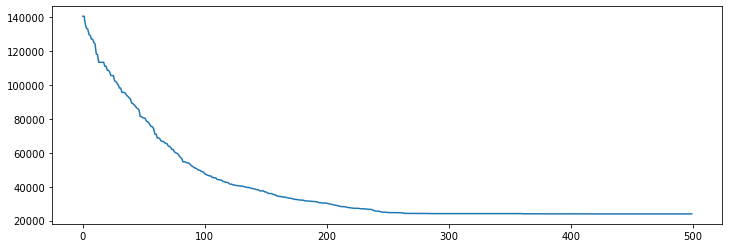

<Figure size 864x576 with 0 Axes>

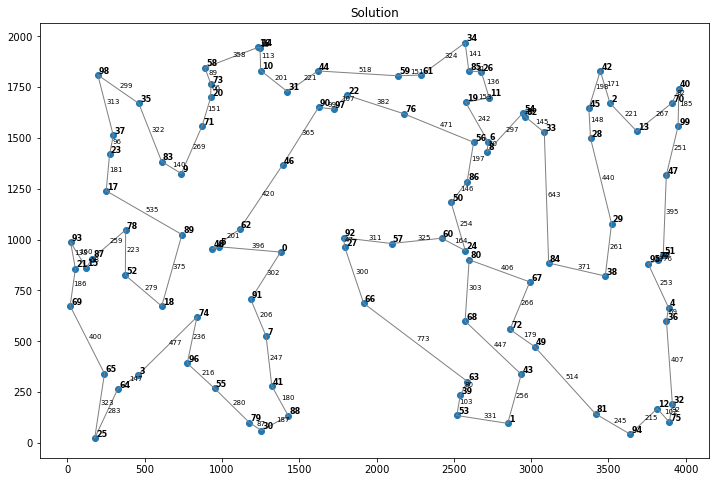

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 22851.046626082043 
 best_permutation: [85 26 19 56 86  8  6 11 54 82 33 45 42  2 40 70 99 47 13 28 29 38 95 77
 51  4 36 32 75 12 94 81  1 53 39 63 43 49 84 67 72 68 80 24 50 60 57 92
 27 66 41 88 30 79 55 96  7 91 74 18  3 64 25 65 69 21 93 15 87 52 78 17
 23 37 98 35 71 83  9 89 48  5 62  0 46 20 73 58 16 14 10 31 44 90 97 22
 76 59 61 34]


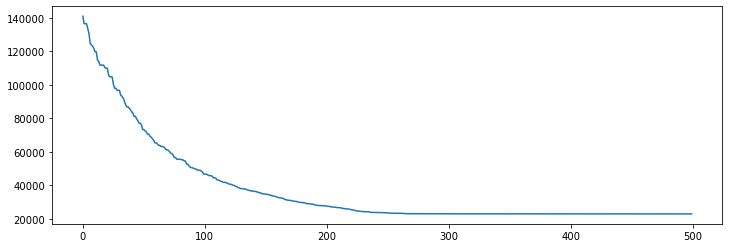

<Figure size 864x576 with 0 Axes>

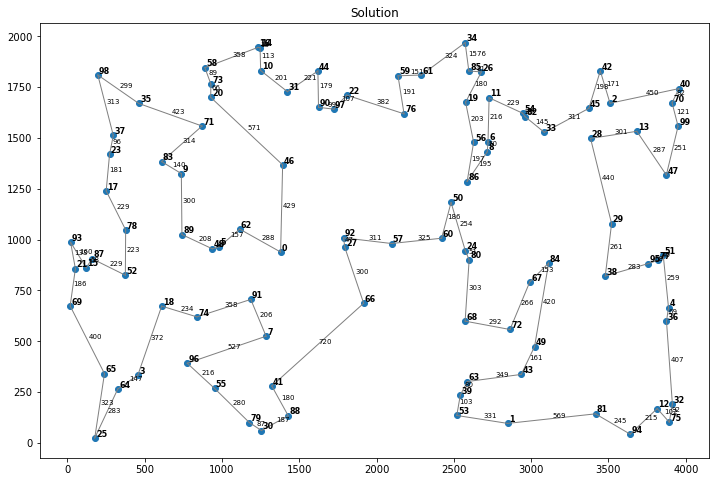

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 23293.135001483904 
 best_permutation: [85  6 56 19 61 59 76 22 97 90 44 31 10 14 16 58 73 20 71 35 98 37 23 17
 93 87 15 21 69 65 25 64  3 18 52 78 83  9 89 48 74 96 55 79 30 88 41  7
 91  5 62  0 46 92 27 66 57 68 39 53 63 72 49 43  1 81 94 12 75 32 36  4
 51 77 95 38 84 67 80 24 60 50 86  8 28 29 47 99 40 70 13  2 42 45 33 82
 54 11 26 34]


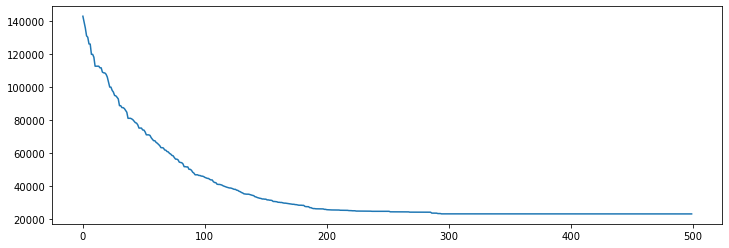

<Figure size 864x576 with 0 Axes>

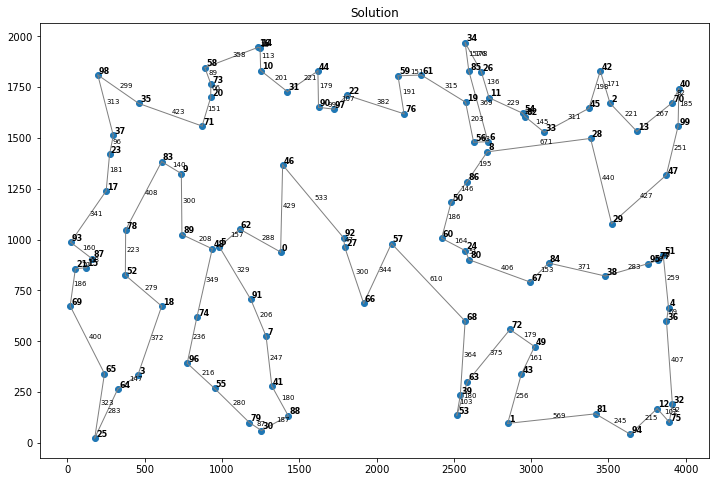

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22549.783931949944 
 best_permutation: [31 44 90 97 22 76 59 61 34 85 26 11 19 56  8  6 54 82 33 28 45 42  2 13
 70 40 99 47 29 38 95 77 51  4 36 32 75 12 94 81 49 43  1 53 39 63 72 84
 67 68 80 24 86 50 60 57 66 27 92 46  0 91  7 41 88 30 79 55 96 74  3 64
 25 65 52 18 48  5 62 89  9 78 87 15 69 21 93 17 23 37 98 35 83 71 20 73
 58 16 14 10]


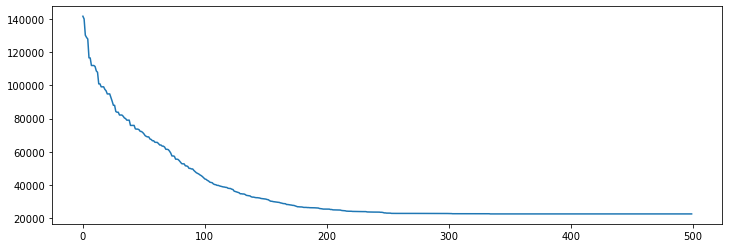

<Figure size 864x576 with 0 Axes>

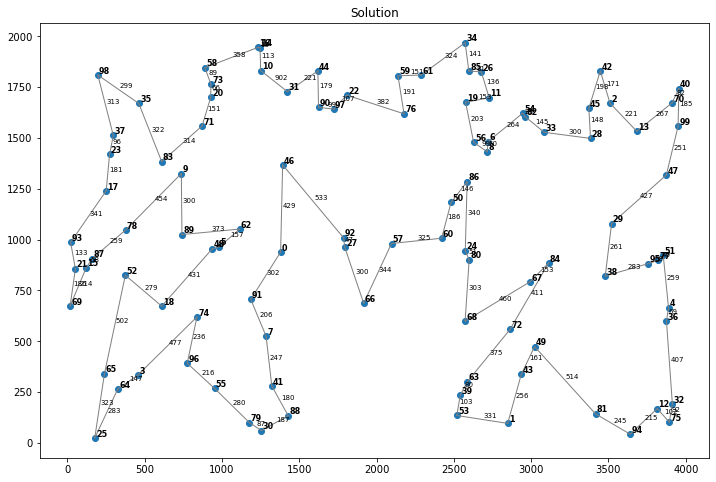

In [197]:
dist_matr = [kroA100_dist]
coords = kroA100_coords
num = [100]
pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.2, 0.225, 0.25, 0.275, 0.3]
num_of_iter = [500]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22762.275873444534 
 best_permutation: [ 5 48 89 52 78 83  9 71 20 73 58 35 98 37 23 17 93 87 15 21 69 65 25 64
  3 18 74 96 55 79 30 88 41 66 27 92 57 60 24 80 84 38 67 72 68 63 39 53
  1 43 49 81 94 12 75 32 36  4 51 77 95 29 47 99 40 70 13  2 42 45 28 33
 82 54  6  8 86 50 56 19 11 26 85 34 61 59 76 22 97 90 44 14 16 10 31 46
  0  7 91 62]


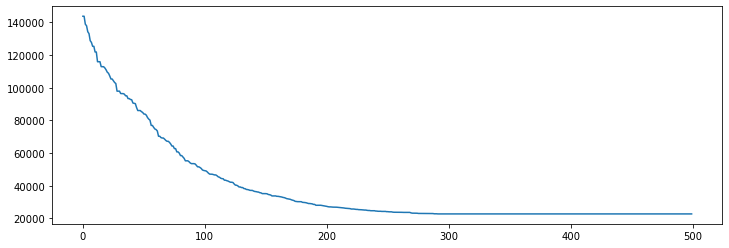

<Figure size 864x576 with 0 Axes>

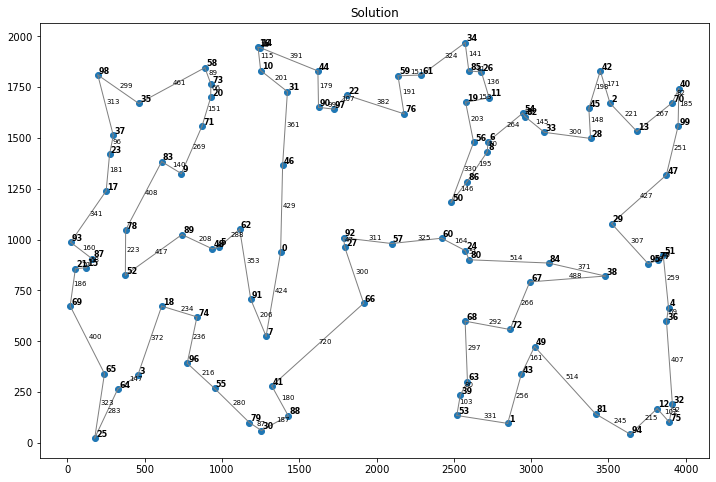

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.35 
 number_of_iterations = 500 
 tsp_objective_function: 23039.47214619414 
 best_permutation: [71 35 98 37 23 17 83  9 89 48  5 62  0 91  7 74 18 52 78 93 87 15 21 69
 65 25 64  3 96 55 79 30 88 41 66 63 39 53  1 43 81 94 12 75 32 36  4 38
 95 77 51 47 99 40 70 13  2 42 45 28 29 84 67 49 72 68 80 24 60 50 86 56
  8  6 33 82 54 11 19 26 85 34 61 59 76 57 27 92 46 90 97 22 44 31 10 14
 16 58 73 20]


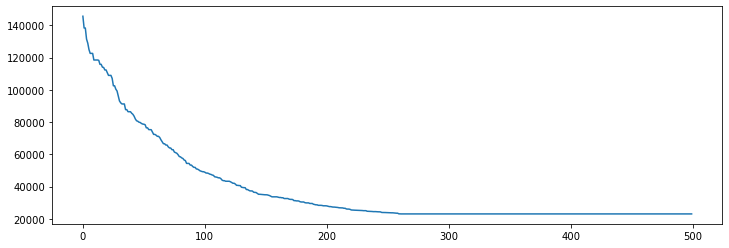

<Figure size 864x576 with 0 Axes>

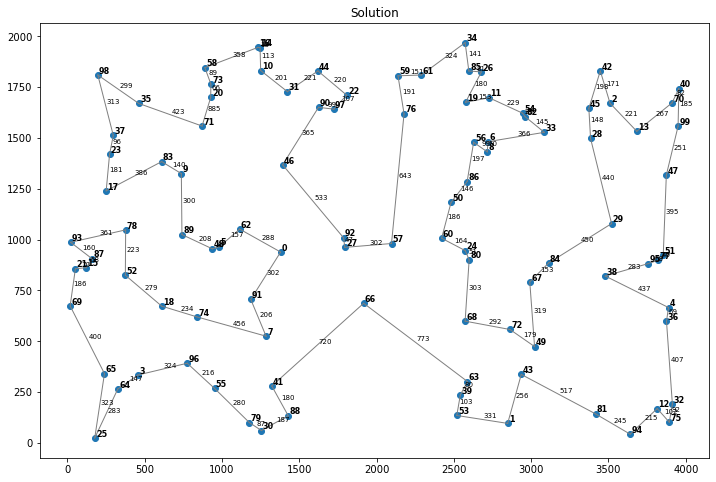

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.4 
 number_of_iterations = 500 
 tsp_objective_function: 23147.994778104272 
 best_permutation: [46 31 10 14 16 58 73 20 71  9 89 83 35 98 37 23 17 78 93 21 69 15 87 52
 18 65 25 64  3 96 55 79 30 88 41  7 74 48  5 62 91  0 92 27 66 57 60 50
 86 56  8  6 33 28 29 84 67 24 80 68 63 39 53  1 43 72 49 81 94 12 75 32
 36  4 38 95 77 51 47 99 40 70 13  2 42 45 82 54 11 19 26 85 34 61 59 76
 22 97 44 90]


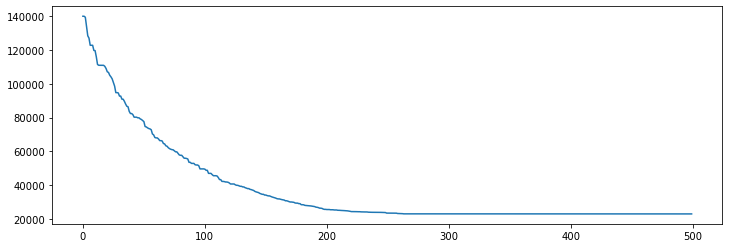

<Figure size 864x576 with 0 Axes>

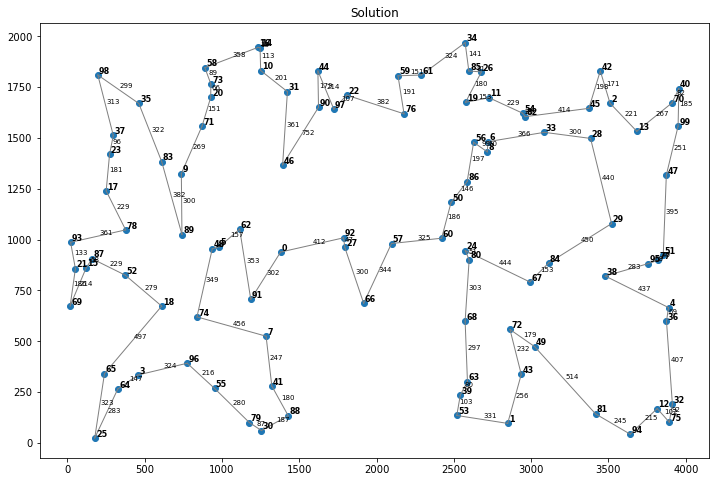

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 22473.94616418027 
 best_permutation: [29 95 81 94 12 75 32 36  4 77 51 47 99 40 70 13  2 42 45 28 33 82 54  6
  8 56 11 26 34 85 19 61 59 76 22 97 90 44 31 14 16 10 46 62  5 48 89  9
 83 71 20 73 58 35 98 37 23 17 78 52 87 15 93 21 69 65 25 64  3 18 74 96
 55 79 30 88 41  7 91  0 92 27 57 66 63 39 53  1 43 49 72 68 80 24 60 50
 86 67 84 38]


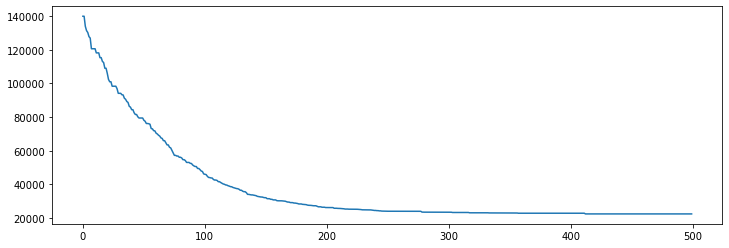

<Figure size 864x576 with 0 Axes>

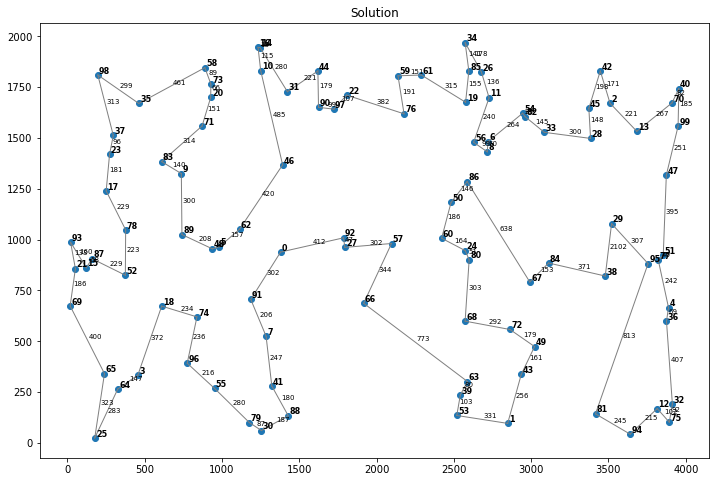

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.35 
 number_of_iterations = 500 
 tsp_objective_function: 22748.282092679143 
 best_permutation: [43 63 39 53  1 81 94 12 75 32 36  4 51 77 95 38 67 84 29 47 99 40 70 13
  2 42 45 28 33 82 54 11 26 85 34 61 59 22 97 90 44 31 46 10 14 16 58 73
 20 71 35 98 37 23 83  9 78 52 87 17 93 15 21 69 65 25 64  3 96 55 79 30
 88 41  7 91 74 18 89 48  5 62  0 92 27 66 57 76 19 56  6  8 86 50 60 24
 80 68 72 49]


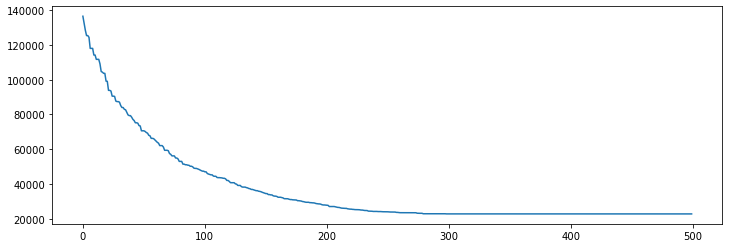

<Figure size 864x576 with 0 Axes>

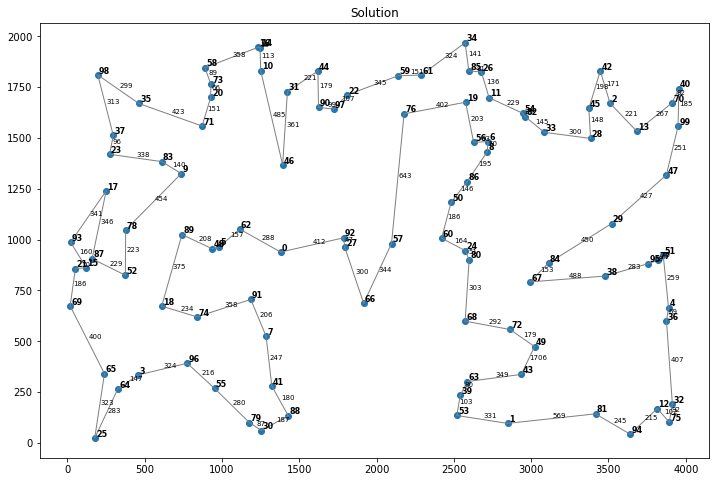

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.4 
 number_of_iterations = 500 
 tsp_objective_function: 23257.839514130817 
 best_permutation: [19 61 76 59 44 31 10 14 16 58 73 20 71  9 83 35 98 37 23 17 93 87 15 21
 69 65 25 64  3 96 55 79 30 88 41 66 27 92  0 91  7 74 18 52 78 89 48  5
 62 46 90 97 22 57 60 50 86 56  6  8 29 38 84 67 24 80 68 63 39 53  1 43
 72 49 81 94 12 75 32 36  4 95 77 51 47 99 40 70 13  2 42 45 28 33 82 54
 11 26 34 85]


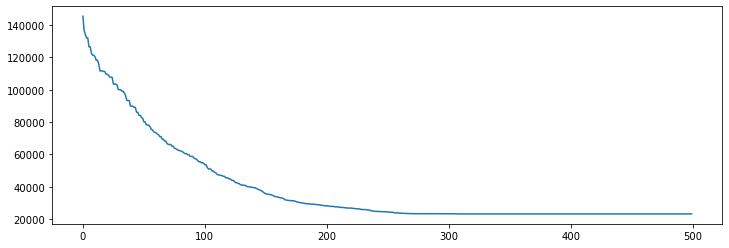

<Figure size 864x576 with 0 Axes>

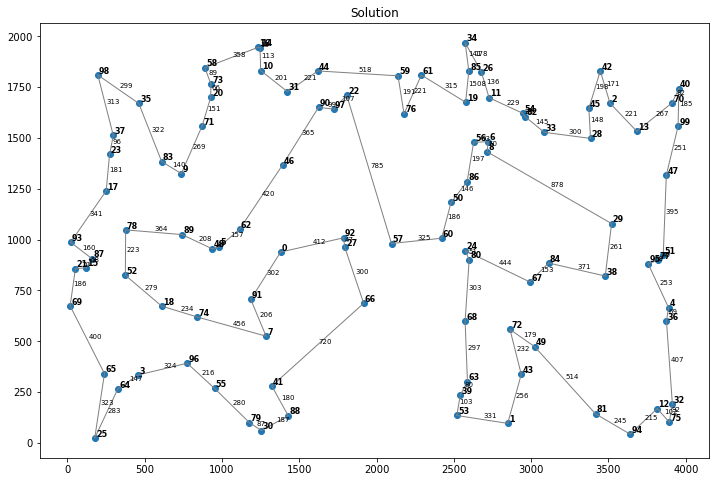

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 23511.534358868146 
 best_permutation: [79 55 25 69 65 64  3 96 74 18 52 87 15 21 93 78 89 48  5 62  0 46 31 10
 73 20 71  9 83 17 23 37 98 35 58 16 14 44 90 97 22 76 59 61 34 85 26 19
 56 86  8  6 11 54 82 33 28 45 42  2 13 70 40 99 47 29 38 95 77 51  4 36
 32 75 12 94 81 49 43  1 53 39 63 72 84 67 68 80 24 50 60 57 66 27 92 91
  7 41 88 30]


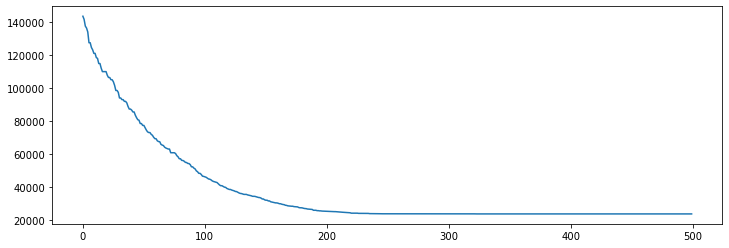

<Figure size 864x576 with 0 Axes>

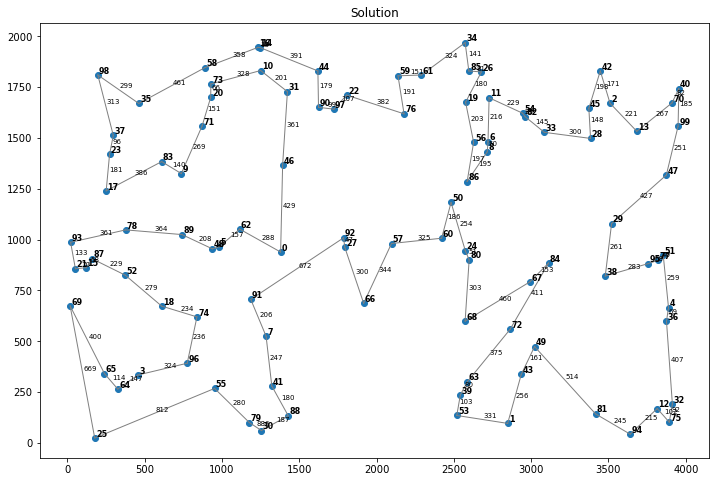

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.35 
 number_of_iterations = 500 
 tsp_objective_function: 21920.863674194752 
 best_permutation: [ 4 51 77 95 38 29 47 99 40 70 13  2 42 45 28 33 82 54 11 19 26 85 34 61
 59 76 22 97 44 14 16 10 31 90 46  0 62  5 48 89  9 83 71 20 73 58 35 98
 37 23 17 78 52 87 15 93 21 69 65 25 64  3 18 74 96 55 79 30 88 41  7 91
 92 27 66 57 60 80 24 50 86 56  6  8 84 67 72 68 63 39 53  1 43 49 81 94
 12 75 32 36]


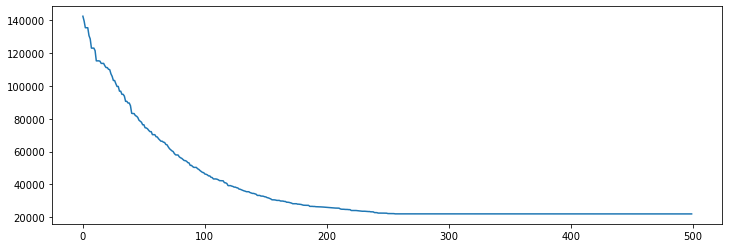

<Figure size 864x576 with 0 Axes>

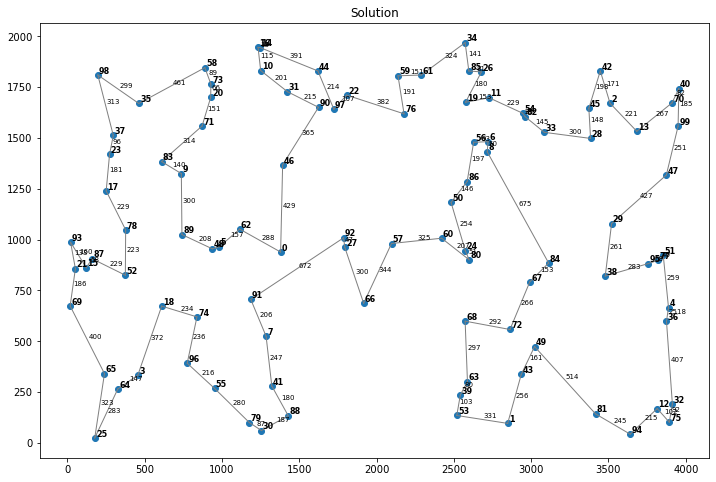

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.4 
 number_of_iterations = 500 
 tsp_objective_function: 22726.088454610697 
 best_permutation: [ 7 41 88 30 79 55 96  3 64 25 65 69 21 15 87 93 17 78 52 18 74 91  0 62
  5 48 89  9 83 23 37 98 35 71 20 73 58 16 14 10 31 44 22 97 90 46 92 27
 57 76 59 61 34 85 26 11 54 82 33 28 45 42  2 13 70 40 99 47 29 38 95 77
 51  4 36 32 75 12 94 81  1 53 39 63 43 49 72 67 84  8  6 19 56 86 50 60
 24 80 68 66]


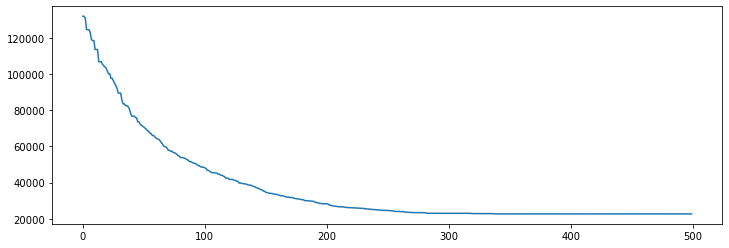

<Figure size 864x576 with 0 Axes>

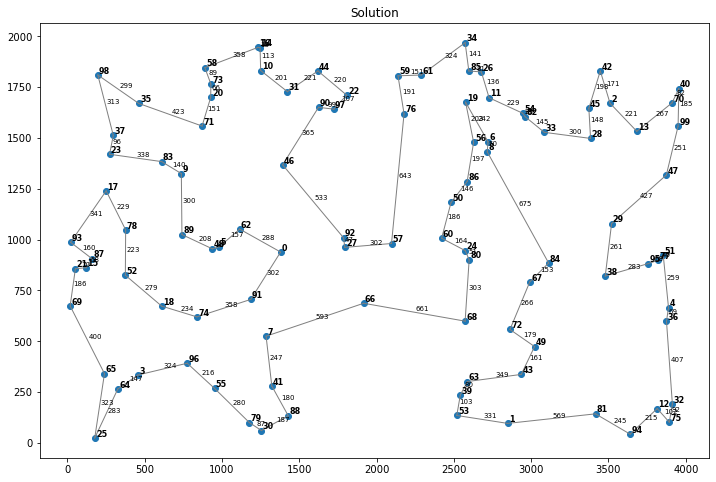

In [203]:
dist_matr = [kroA100_dist]
coords = kroA100_coords
num = [100]
pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.3, 0.35, 0.4]
num_of_iter = [500]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

## kroA150

In [205]:
def kroA150():
    coords_string = """1 1380 939
    2 2848 96
    3 3510 1671
    4 457 334
    5 3888 666
    6 984 965
    7 2721 1482
    8 1286 525
    9 2716 1432
    10 738 1325
    11 1251 1832
    12 2728 1698
    13 3815 169
    14 3683 1533
    15 1247 1945
    16 123 862
    17 1234 1946
    18 252 1240
    19 611 673
    20 2576 1676
    21 928 1700
    22 53 857
    23 1807 1711
    24 274 1420
    25 2574 946
    26 178 24
    27 2678 1825
    28 1795 962
    29 3384 1498
    30 3520 1079
    31 1256 61
    32 1424 1728
    33 3913 192
    34 3085 1528
    35 2573 1969
    36 463 1670
    37 3875 598
    38 298 1513
    39 3479 821
    40 2542 236
    41 3955 1743
    42 1323 280
    43 3447 1830
    44 2936 337
    45 1621 1830
    46 3373 1646
    47 1393 1368
    48 3874 1318
    49 938 955
    50 3022 474
    51 2482 1183
    52 3854 923
    53 376 825
    54 2519 135
    55 2945 1622
    56 953 268
    57 2628 1479
    58 2097 981
    59 890 1846
    60 2139 1806
    61 2421 1007
    62 2290 1810
    63 1115 1052
    64 2588 302
    65 327 265
    66 241 341
    67 1917 687
    68 2991 792
    69 2573 599
    70 19 674
    71 3911 1673
    72 872 1559
    73 2863 558
    74 929 1766
    75 839 620
    76 3893 102
    77 2178 1619
    78 3822 899
    79 378 1048
    80 1178 100
    81 2599 901
    82 3416 143
    83 2961 1605
    84 611 1384
    85 3113 885
    86 2597 1830
    87 2586 1286
    88 161 906
    89 1429 134
    90 742 1025
    91 1625 1651
    92 1187 706
    93 1787 1009
    94 22 987
    95 3640 43
    96 3756 882
    97 776 392
    98 1724 1642
    99 198 1810
    100 3950 1558
    101 3477 949
    102 91 1732
    103 3972 329
    104 198 1632
    105 1806 733
    106 538 1023
    107 3430 1088
    108 2186 766
    109 1513 1646
    110 2143 1611
    111 53 1657
    112 3404 1307
    113 1034 1344
    114 2823 376
    115 3104 1931
    116 3232 324
    117 2790 1457
    118 374 9
    119 741 146
    120 3083 1938
    121 3502 1067
    122 1280 237
    123 3326 1846
    124 217 38
    125 2503 1172
    126 3527 41
    127 739 1850
    128 3548 1999
    129 48 154
    130 1419 872
    131 1689 1223
    132 3468 1404
    133 1628 253
    134 382 872
    135 3029 1242
    136 3646 1758
    137 285 1029
    138 1782 93
    139 1067 371
    140 2849 1214
    141 920 1835
    142 1741 712
    143 876 220
    144 2753 283
    145 2609 1286
    146 3941 258
    147 3613 523
    148 1754 559
    149 2916 1724
    150 2445 1820"""
    n = 150
    coords = np.zeros((n, 2))
    it = iter(coords_string.split())
    for i in range(n):
        next(it)
        coords[i, 0] = float(next(it))
        coords[i, 1] = float(next(it))
    distance_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            distance_matrix[i, j] = np.sqrt(((coords[i, :] - coords[j, :])**2).sum())
    return distance_matrix, coords

In [206]:
kroA150_dist, kroA150_coords = kroA150()
# kroA150 = 26524
# kroA200 29368

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 29530.942224959712 
 best_permutation: [ 55 142 118 117 123  25 128  69  21  15  87  93  17 136  78 133  52 105
  89   5  48  62 112  71   9  83  23  37 103 110 101  98  35 126 140  58
  73  20  14  16  10  31  46 108  90  44  97  22 109  76  59  61 149  34
  85  26  11  19  56   6   8 116 148  54  82  33  28  45   2 122 114 119
 127  42 135  40  70  99  47  13 131 111 134  84  67 146  38 100 106 120
  29  95  77  51   4  36 102 145  32  75  12  94 125  81 115   1 143 113
  43  49  72  68  63  39  53 137 132  88  30  79 121  41   7 147 141 104
  66 107  60  24  80 139 144  86 124  50  57  27  92 130   0 129  91  74
  18  65  64   3  96 138]


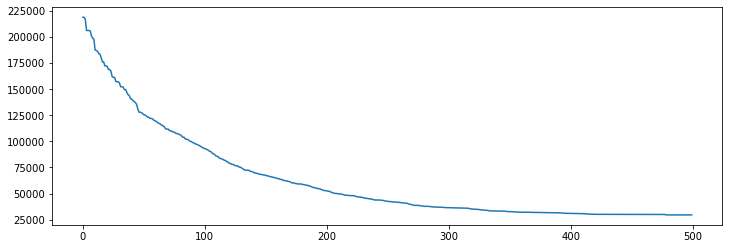

<Figure size 864x576 with 0 Axes>

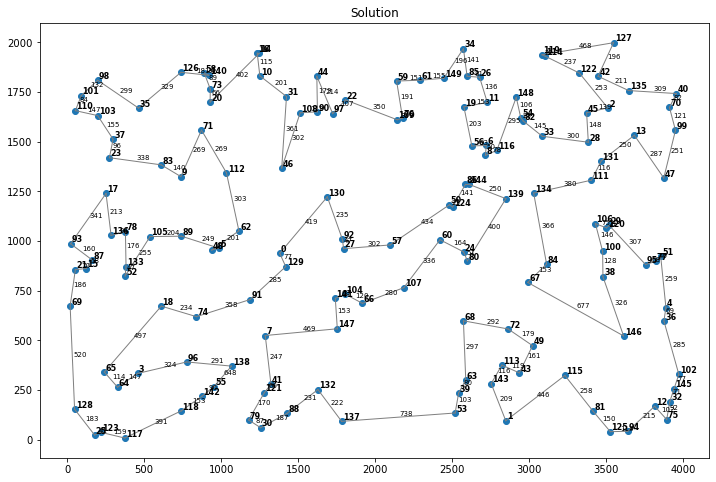

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 29577.77688524321 
 best_permutation: [137  53  39  63 143   1 113  43  49 115 146  81 125  94  12  75  32 145
 102  36   4  38  95  77  51  47  29 120 100 106 111 131  28   2  13  99
  70  40 135 127  42 122 114 119  45  33  82  54 148  11  26  85  34 149
  76 109  97  22  59  61  19  56   6   8 116 139 134  84  67  72  68  80
  24 124 144  86  50  60  57 107  66  27  92 130  46 108  90  44  31  10
  14  16 140  58 126  73  20  71   9 112  62   5  48  89 105  83  35  98
 101 110 103  37  23  17 136  78 133  52  87  15  93  21  69   3  64  65
 128  25 123 117 118 142  96  18  74 138  55  79  30  88 121  41   7  91
   0 129 141 104 147 132]


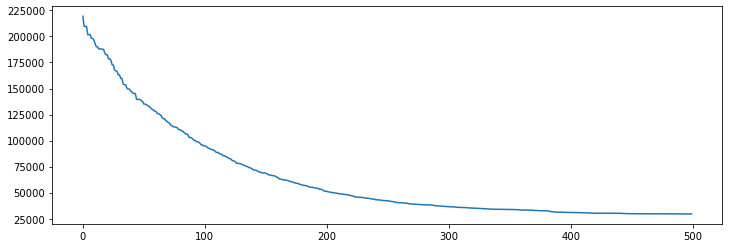

<Figure size 864x576 with 0 Axes>

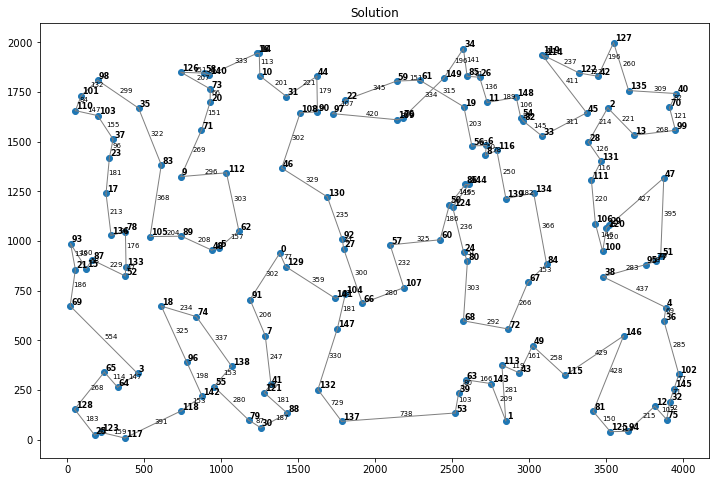

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 28183.565401891086 
 best_permutation: [ 73  20  71 112  62   9  83  35  98 101 110 103  37  23  17  78 136  87
  15  93  21  69  65 128  25 123 117  64   3 118 142  55  79  30  88  41
 121 138  96  74  18  52 133 105  89  48   5  91   7 132 137 147 104 141
 129   0  46 130  92  27  66 107  57  60  50 124 144  86  24  80  68  67
  84  72  63  39  53   1 143 113  43  49 115  81 125  94  12  75  32 145
 102  36   4  51  77  95 146  38 100 120  29 106 111 131  28  45   2  13
  47  99  70  40 135 127  42 122 114 119  34  85  26  11 148  54  82  33
 134 139 116   8   6  56  19 149  61  59  76 109  22  97  90  44 108  31
  10  14  16 140  58 126]


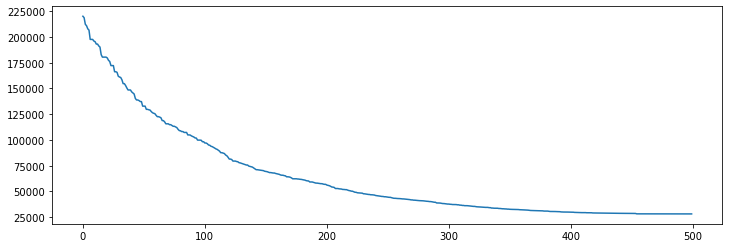

<Figure size 864x576 with 0 Axes>

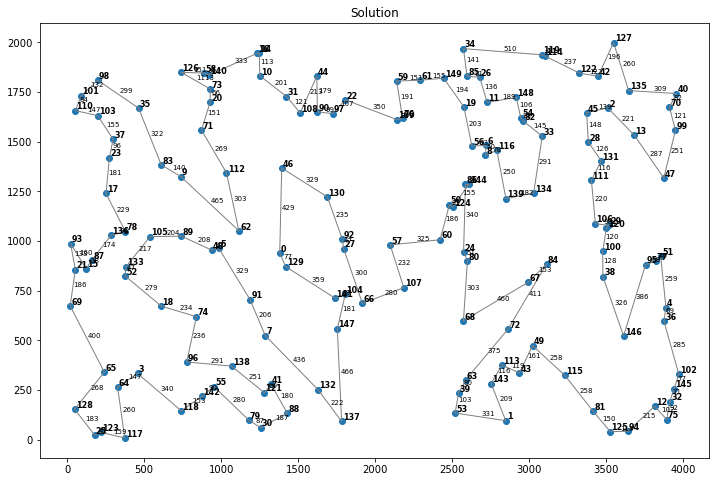

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 29714.14135744411 
 best_permutation: [  3  96  74  91   7 129   0  62   5  48  18  52 133  87  15  69  21  93
  17 136  78 105  89   9  83  23  37 103 110 101  98  35 126 140  58  73
  16  14  31  10  20  71 112  46  90  97  22  44 108 130  92  27  57  60
  50 124  86 144   8   6 116  82  54  11  19  56  76 109  59  61 149  34
  85  26 148 119 114 122 127  42  45  28  33 134 139  67  84  38 100 120
  29 106 111 131  13   2 135  40  70  99  47  51  77  95   4  36 102 145
  32  75  12  94 125  81 146 115  49  43 113 143   1  53  39  63  68  72
  80  24 107  66 104 141 147 132 137  88  30  79 138  41 121  55 142 118
 117 123  25 128  65  64]


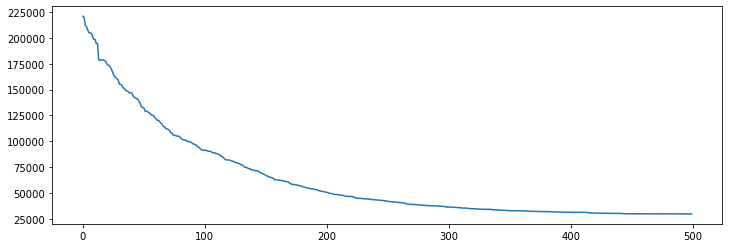

<Figure size 864x576 with 0 Axes>

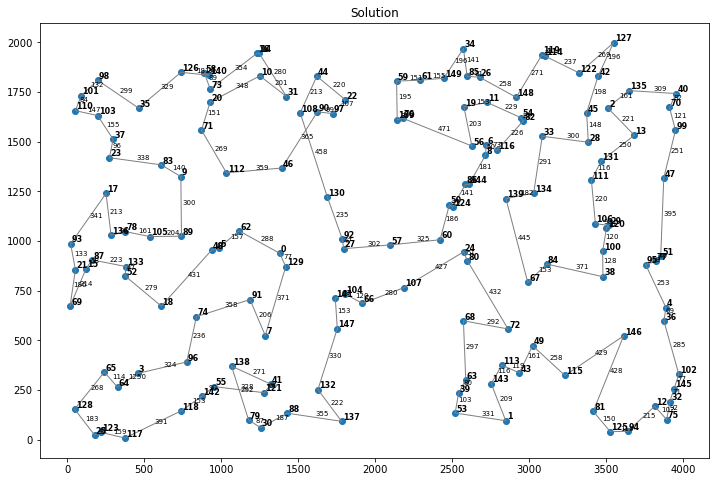

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 28929.034712093504 
 best_permutation: [ 36 102 145  32  75  12  94 125  81 115 146  38 100  84  67  49  43   1
  53  39  63 143 113  72  68  80  24  60 107  66 104 141 147 132 137  88
  41 121  30  79 118 117 123  25 128  65  64   3  18  89 105  78 133  52
  87  15  69  21  93 136  17  23  37 103 110 101  98  35 126  58 140  14
  16  10  73  20  71  83   9 112  62   5  48  74  96 142  55 138   7  91
 129   0  46 130  92  27  57  50 124  86 144 139 134 106 120  29 111 131
  28  33  82  54 116   8   6  56  19  76 109  97  90 108  31  44  22  59
  61 149  34  85  26  11 148 119 114 122  42  45   2 127 135  40  70  99
  13  47  51  95  77   4]


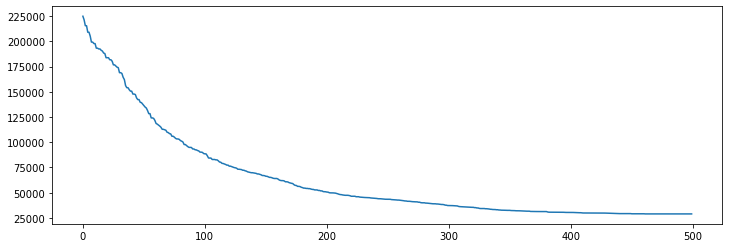

<Figure size 864x576 with 0 Axes>

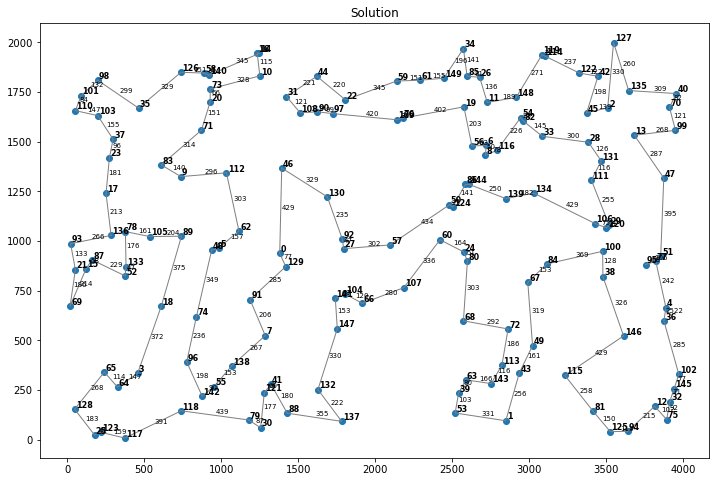

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 30333.502927952846 
 best_permutation: [126  35  98 101 110 103  37  23  17  83   9  62   5  48  74  18  89 105
  78 136 133  52  87  15  93  21  69  65  64 128  25 123 117   3  96 118
 142  55 138   7  41  88  30  79 121 132 137 147  66 104 141  91 129   0
  46 130  92  27  57 107  60  24  80  68  63  53  39 143 113  43   1 115
  81 125  94  12  75  32 145 102  36   4  77  51  47  99  40  70  13  95
 146  38 100 120  29 106  84  49  72  67 134  54  82  33 111 131  28  45
   2 135  42 127 122 114 119 148  11  26  85  34 149  19   6   8 116 139
 124  50  86 144  56  76 109  61  59  22  97  90  44 108  31  14  16  10
 112  71  20  73 140  58]


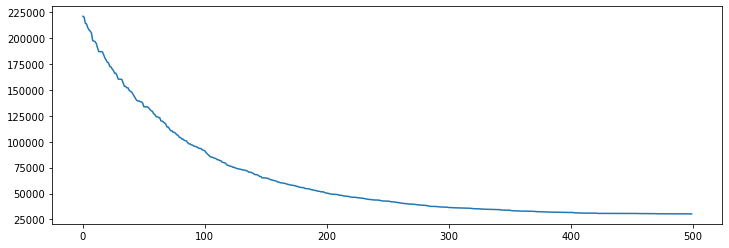

<Figure size 864x576 with 0 Axes>

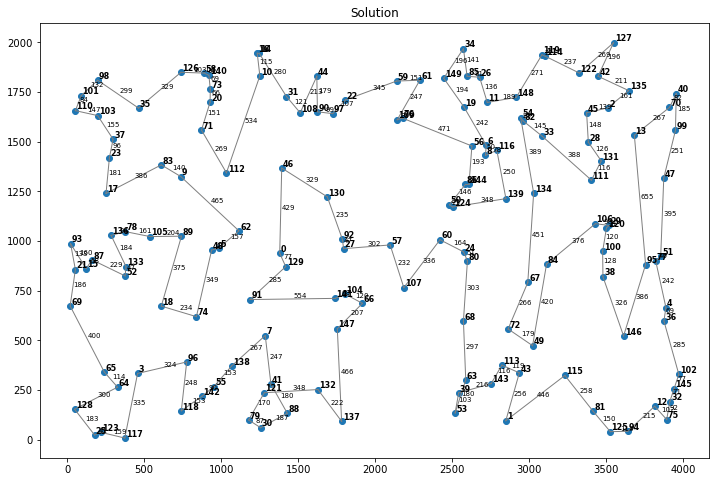

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 29492.19400034979 
 best_permutation: [ 54 148   6 116 139 134 106  84  67  72 113  68  80  24 107  57  60 124
  50  86 144   8  56  11  26  85  34  19 149  61  59  76 109  97  22  44
  90 108  46 130  92  27  66 104 141 147   0 129   7  91  62   5  48  89
  18  52 133 105  83   9 112  71  20  73  10  31  14  16 140  58 126  35
  98 101 110 103  37  23  17  78 136  93  87  15  21  69   3  64  65 128
  25 123 117 118 142  55  96  74 138  41 121  79  30  88 132 137  53  39
  63 143   1  43  49 115  81 125  94  12  75  32 145 102  36   4  95  51
  77 146  38 100 120  29  47  99  40  70  13 131 111  28  45   2 135 127
  42 122 114 119  33  82]


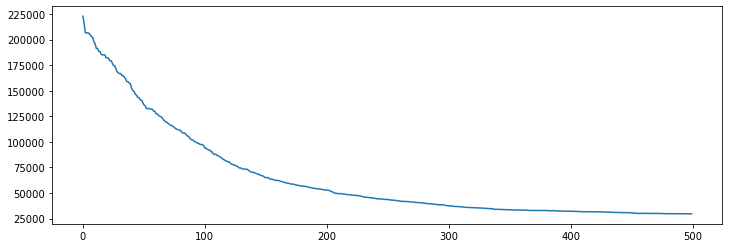

<Figure size 864x576 with 0 Axes>

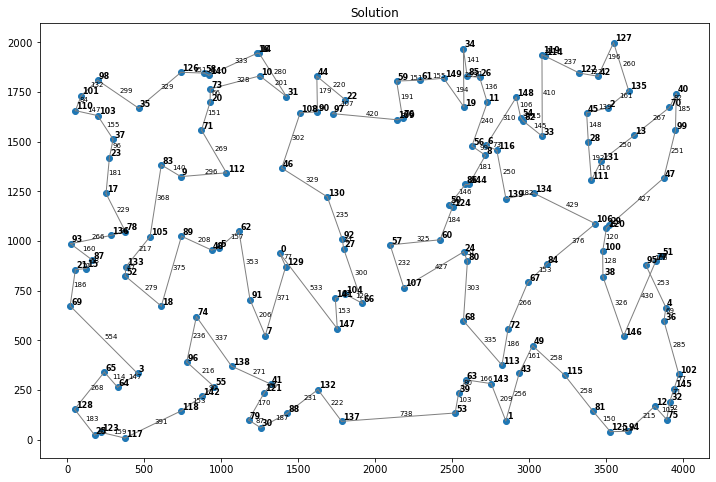

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 30548.53991445844 
 best_permutation: [ 10  73  20  71 112   9  83  89 105 133  52  18  48   5  62  46 130  92
  57 107  68 113  72  67  80  24  60 124  50 144  86  76 109  22  97  90
 108  31  44  59  61 149  19  56   8 116   6  11  26  85  34 119 114 127
  42 122 148  54  82  33 134 139  84 146  38 100 120  29 106 111 131  28
  45   2 135  13  70  40  99  47  51  77  95   4  36 102 145  32  75  12
  94 125  81 115  49  43   1 143  63  39  53 137 147 141 104  66  27   0
 129   7 121  41 132  88  30  79 142  55 138  91  74  96 118   3  65  64
 117 123  25 128  69  21  93  15  87 136  78  17  23  37 103 110 101  98
  35 126  58 140  16  14]


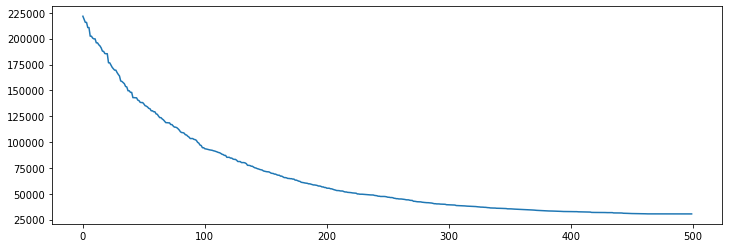

<Figure size 864x576 with 0 Axes>

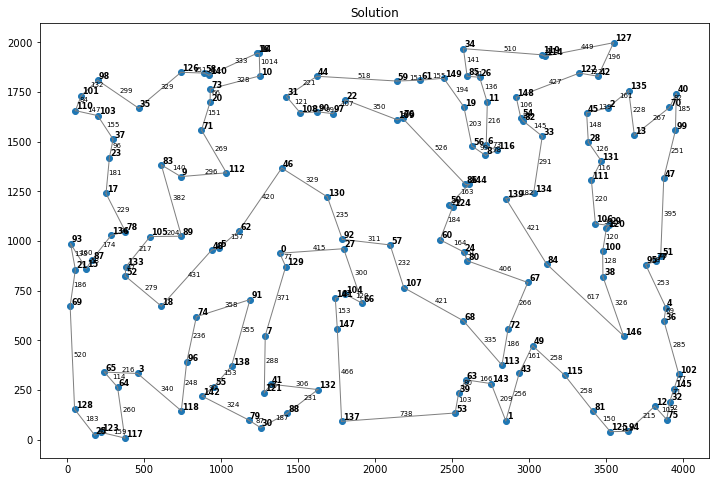

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 30223.766839321488 
 best_permutation: [123  25 128  65  18  52 133 105  78 136  87  15  69  21  93  17  23  37
  98 101 110 103  35  83   9  71  20  73 126  58 140  16  14  10  31 108
  90  44  59  61 149  19  85  34  26  11 148  82  54  33  45   2  42 122
 114 119 127 135  13  70  40  99  47 131  28 111 106  29 120 100  38 146
  95  77  51   4  36 102 145  32  75  12  94 125  81 115   1  53  39  63
  68 143 113  43  49  72  67  84 134 116   6  56   8 139  24  80 107  66
 104 141 147 132 137  88 121  41   7  91 129  92  27  57  60  50 124 144
  86  76 109  22  97  46 130   0  62 112   5  48  89  74 138  30  79  55
 142 118  96   3  64 117]


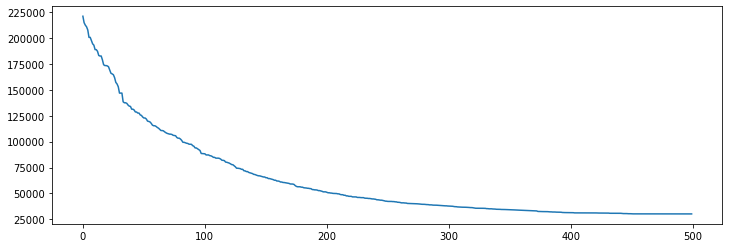

<Figure size 864x576 with 0 Axes>

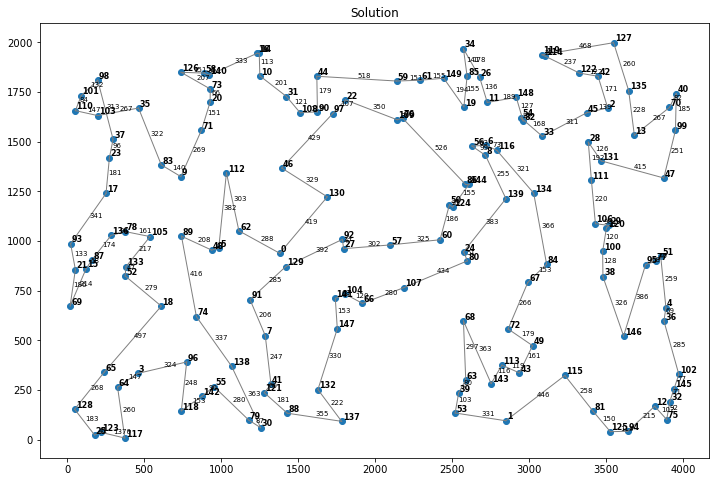

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 28713.558431103535 
 best_permutation: [ 29 106 111 134 139 116  33  82  54 148  11  19   6   8  56 144  86 124
  50  60  24  80  68 143 113  43   1  53  39  63 107  66 104 141 147 129
   0  91   7 138 121  41 132 137  88  30  79  55 142 118 117 123  25 128
  65  64   3  96  74  18  52 133 105  78 136  87  15  69  21  93  17  23
  37 103 110 101  98  35  83   9  89  48   5  62 112  71  20 126  58 140
  73  10  16  14  31  44  90 108  46 130  92  27  57  97  22 109  76  59
  61 149  34  85  26 119 114 122 127 135  42   2  45  28 131  13  70  40
  99  47  51  77  95   4  36 146 102 145  32  75  12  94 125  81 115  49
  72  67  84  38 100 120]


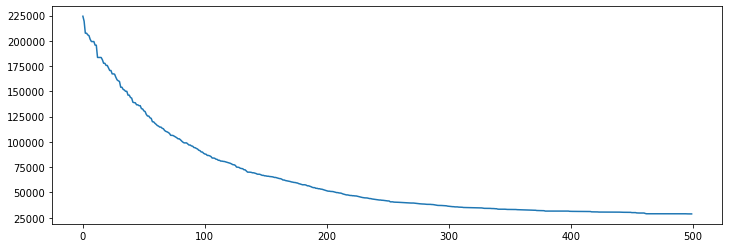

<Figure size 864x576 with 0 Axes>

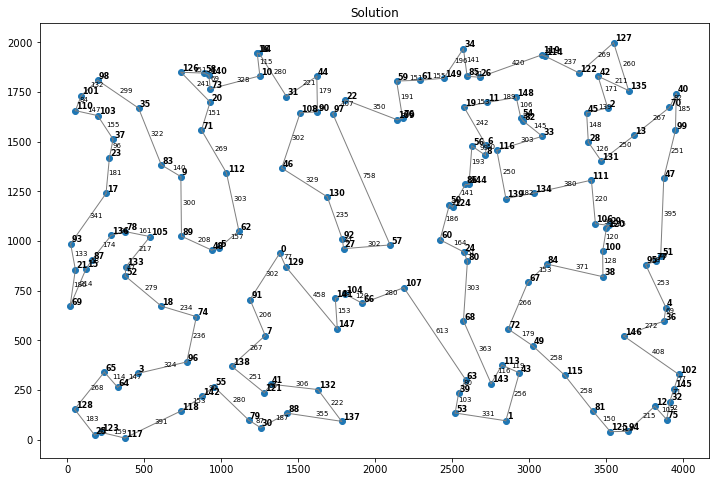

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 29682.121602920746 
 best_permutation: [ 93  15  87 136  17  78 133  52 105  89  18  74  48   5  62  46 112   9
  83  35  37  23 103 110 101  98 126  71  20  73  58 140  16  14  10  31
 108  44  90  97 130  92  27 104  66 107  57  60  24  80  68  72  67  84
 134 139  50 124 144  86   8 116   6  56  11  19  76 109  22  59  61 149
  34  85  26 119 114 148  54  82  33  28  45 122 127  42   2 135  13  70
  40  99  47  51  77  95 120  29 131 111 106 100  38 146   4  36 102 145
  32  75  12  94 125  81 115  49  43 113   1 143  63  39  53 137  88 132
 147 141 129   0  91   7  41 121  30  79 138  55 142  96 118   3  64 117
 123  25 128  65  69  21]


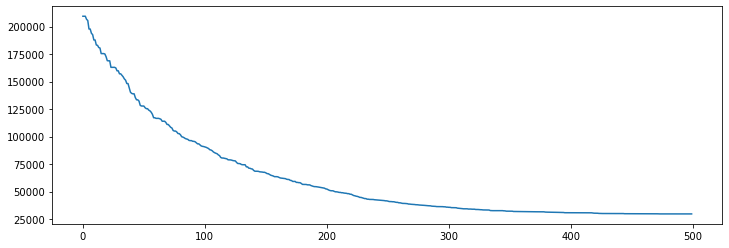

<Figure size 864x576 with 0 Axes>

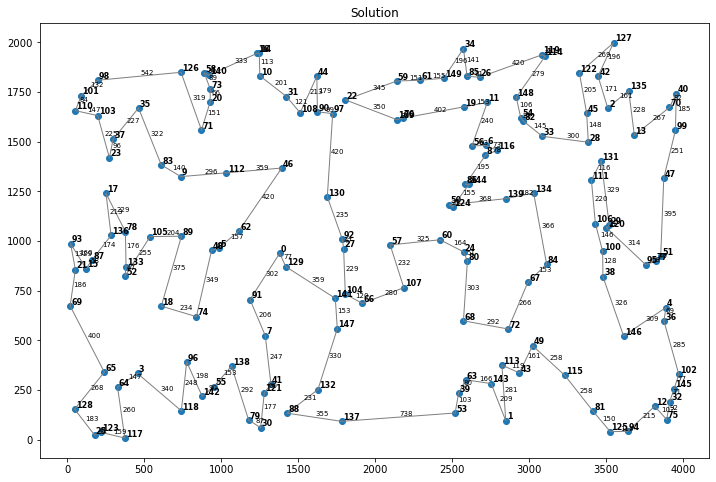

 population_size = 1000 
 crossover_probability = 0.85 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 29166.000391693662 
 best_permutation: [139 124  50  86 144   8   6 116  33  82  54 148  26  11  56  19  85  34
 149  61  59  76 109  22  97  90  44 108  31  10  14  16  58 140  73  20
  71 126  35  98 101 110 103  37  23  83   9  89 105  78  17  93  21  15
  87 136 133  52  69 128  25 123 117  64  65   3  18  74  96 118 142  55
 138 121  79  30  88  41   7  91 129   0  62   5  48 112  46 130  92  27
 104 141 147 132 137  53  39  63 143   1  43 113  49  72  68 107  66  57
  60  24  80  67  84  38 146 115  81 125  94  12  75  32 145 102  36   4
  95  77  51  47  13  99  70  40 135 127  42 122 114 119  45   2  28 131
 111  29 120 100 106 134]


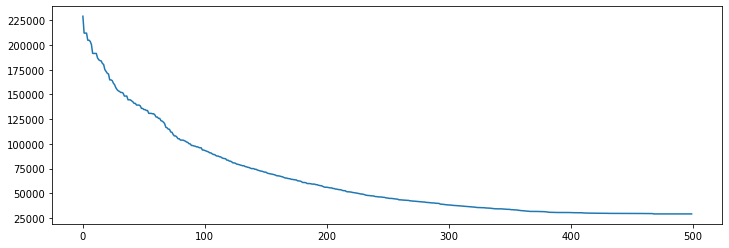

<Figure size 864x576 with 0 Axes>

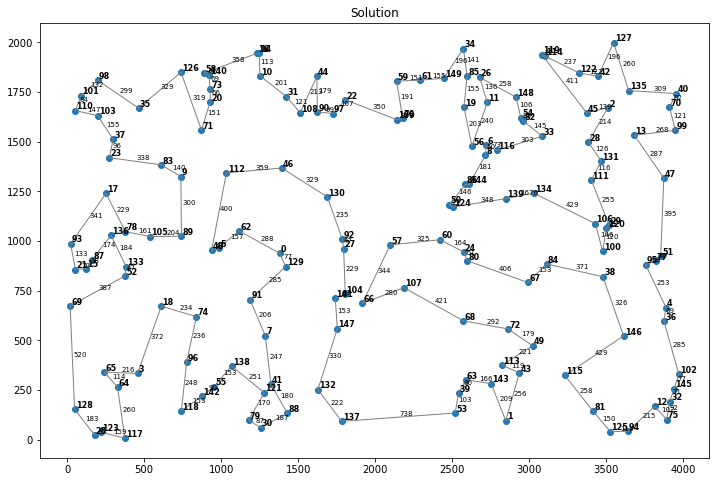

In [200]:
dist_matr = [kroA150_dist]
coords = kroA150_coords
num = [150]

pop_size = [1000]
cross_prob = [0.975, 0.95, 0.9, 0.85]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [500]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 30616.04948303908 
 best_permutation: [ 48  89  74  18 105   9  83  23  17 136  78 133  52   3  64 117 123  25
 128  65  69  21  15  87  93 110 101  98 103  37  35 126  58 140  73  10
  16  14  44  59  61  76 109  22  97  90 108  31  20  71 112  46 130  92
  27  66 147 141 104 107  57  60  24 124  50  86 144 139 134   8 116   6
  56  19 149  34  85  26  11 148 119 114 122  42 127 135   2  45  54  82
  33 111 131  28  13  70  40  99  47  51  77  95  38 106  29 120 100  84
  67  80  68  72  49 115 146   4  36 102 145  32  75  12  94 125  81  43
 113 143   1  63  39  53 137 132  88  41 121  30  79  55 142 118  96 138
   7  91 129   0  62   5]


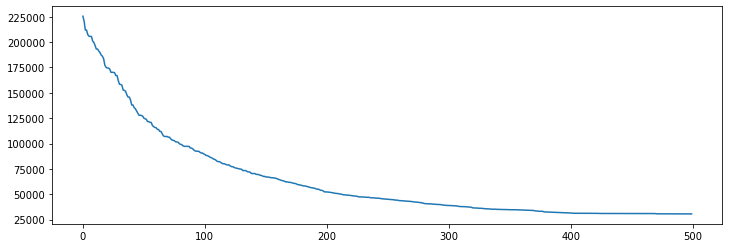

<Figure size 864x576 with 0 Axes>

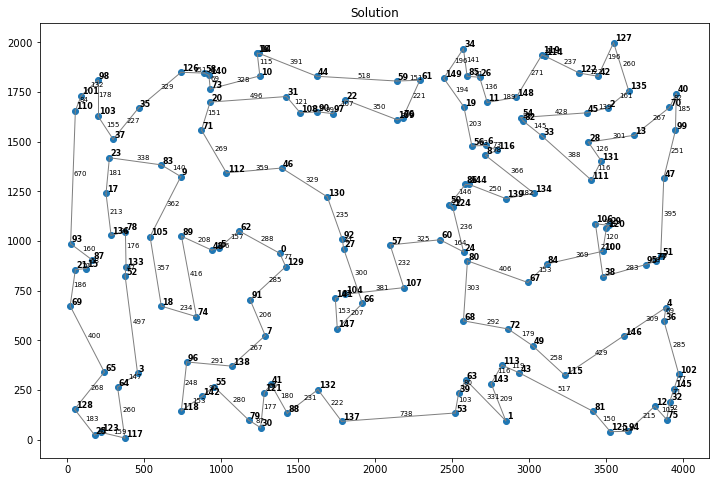

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 29877.760790673143 
 best_permutation: [ 28 131 111 106 120  29  95  36   4  77  51  47  13  99  70  40 135 127
 122 119 114 148  54  82  11  19  56   6 116   8 144  86  50 124  24  80
  60  57  27  92 130  97  22 109  76 149  85  26  34  61  59  44  90 108
  31  10  16  14 140  58 126  73  20  71 112  46   0 129  62   5  48  89
 105   9  83  35  98 101 110 103  37  23  17  93 136  78 133  52  87  15
  21  69 128  25 123 117  64  65   3 118  96  18  74  91   7 138  55 142
  79  30 121  41  88 137 132 147 141 104  66 107  68  63  39  53 143   1
  43 113  72  67  49 115  81 125  94  75  32 145 102  12 146  38 100  84
 139 134  33  42   2  45]


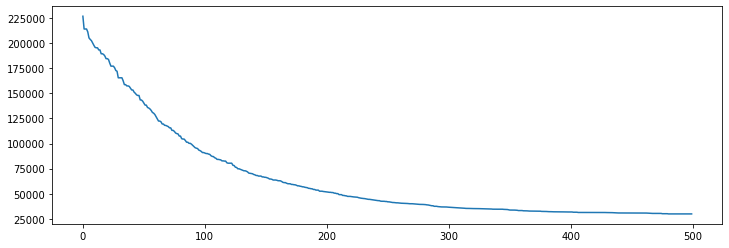

<Figure size 864x576 with 0 Axes>

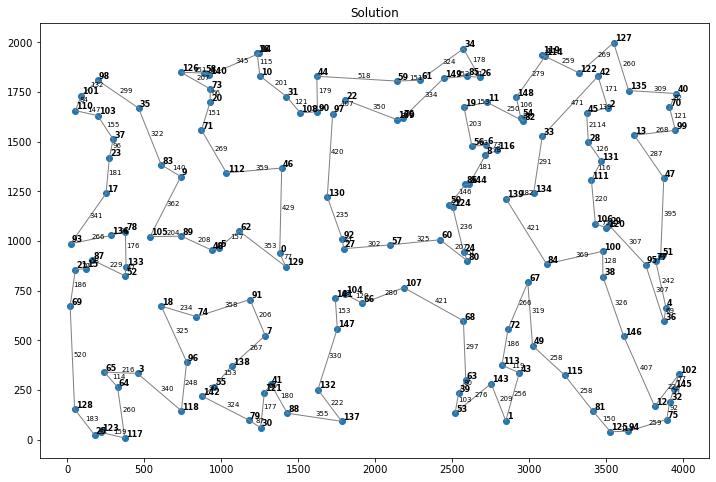

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 29384.218467815394 
 best_permutation: [ 75  32 102 145  12 146  36   4  51  77  95  38 100 120  29 106 111 131
  47  99  40  70  13 135   2  42 127 122  45  28  33  82  54 148 114 119
  26  85  34 149  61  59  22  97 109  76  19  11   6 116   8  56 144  86
  50 124 139 134  84  67  68  80  24  60  57 107  66 104  27  92 130  46
 112  62   0 129 141 147   7  91   5  48  89 105  83   9  71  20  73  10
  31 108  90  44  14  16 140  58 126  35  98 101 110 103  37  23  17 136
  78 133  87  15  93  21  69  52  18  74  96   3  64  65 128  25 123 117
 118 142  55 138 121  41  79  30  88 132 137  53  39  63 143   1  43 113
  72  49 115  81 125  94]


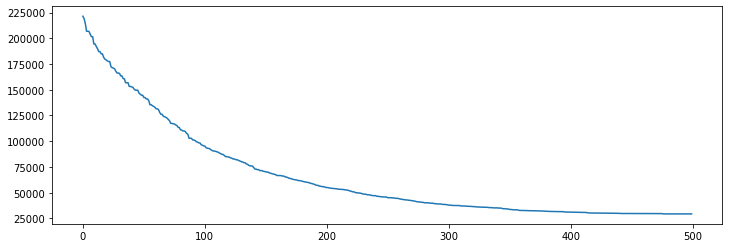

<Figure size 864x576 with 0 Axes>

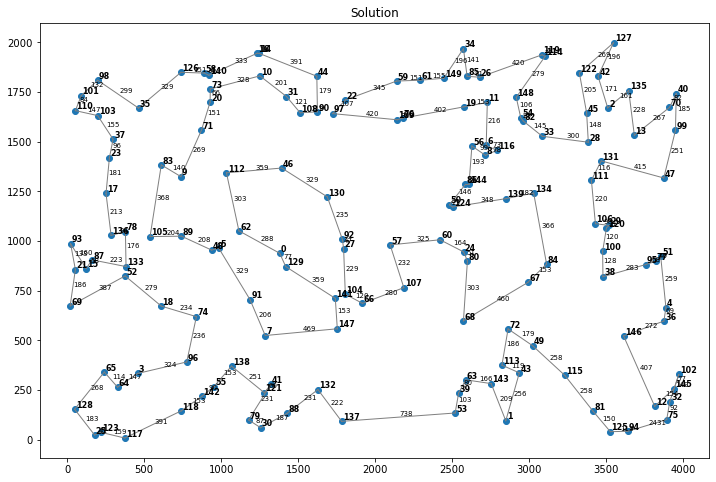

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 29335.907232840484 
 best_permutation: [140  58 126  35  98 101 110 103  37  23  17 136  78 133  52  87  15  93
  21  69 128  25 123 117  64  65   3  18  74  96 118 142  55 138  91   0
 129   7  41 121  79  30  88 137 132 147  66 107 104 141  27  92  46 130
  57  50 124  86 144  56   6   8 116 139 134  84  67  80  24  60  68  63
  39  53   1 143 113  72  49  43 115  81 125  94  12  75  32 145 102  36
   4  77  51  47  99  70  40 135   2  42 127 114 119 122  45  13  95 146
  38 100  29 120 106 111 131  28  33  82  54 148  11  19  26  85  34 149
  61  76 109  59  22  97  90  44 108  31  16  14  10 112  62  48   5  89
 105  83   9  71  20  73]


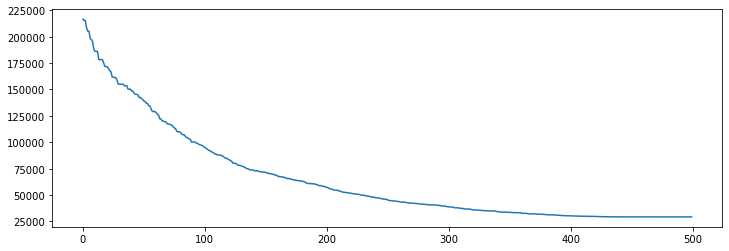

<Figure size 864x576 with 0 Axes>

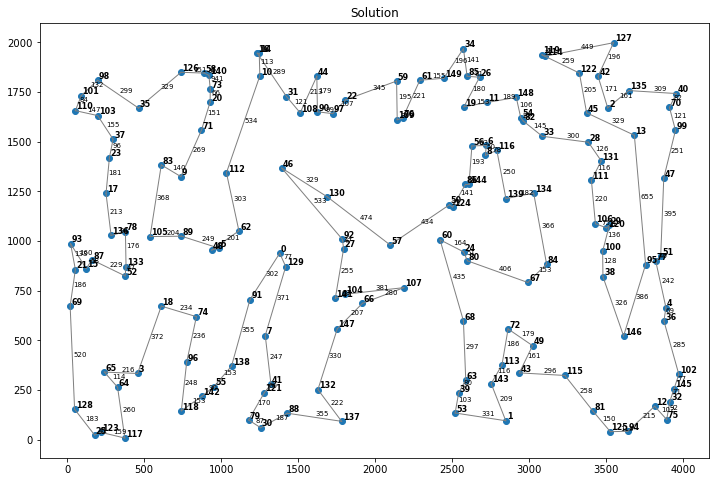

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 29319.68652121238 
 best_permutation: [103 110 101  98  35 126  58 140  16  14  44  22  97  90 108  31  10  73
  20  71   9 112  46 130  92  27  57 109  76  59  61 149  34  85  26  19
  50 124  86 144 139 134  33  82  54 116   8   6  56  11 148 119 114 122
  42 127 135  40  70  99  13   2  45  28 131 111  47  51  77  95   4  36
 102 145  32  75  12  94 125  81 146  38 100 120  29 106  84  67  72  49
 115   1  53  39  63 143  43 113  68  80  24  60 107  66 104 141 147 132
 137  88  30  79 121  41 138  55 142  74  91   7 129   0  62   5  48  89
  83 105  78 136 133  52  18  96 118 117 123  25 128  64   3  65  69  21
  87  15  93  17  23  37]


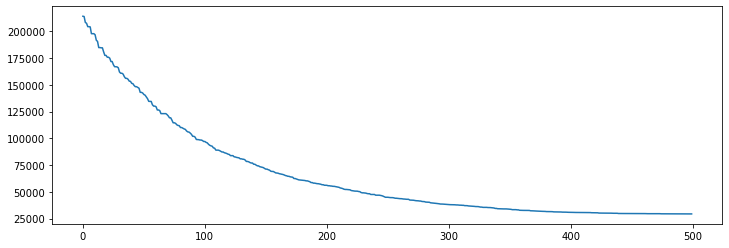

<Figure size 864x576 with 0 Axes>

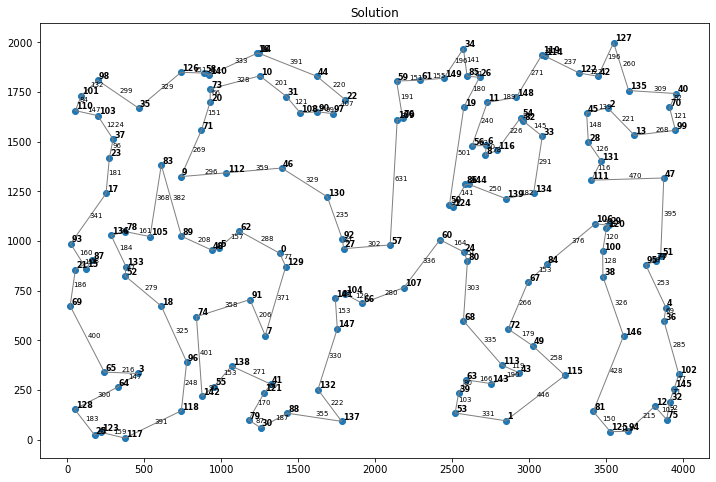

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 29746.761925188013 
 best_permutation: [ 70  40  99  47  51  77  95   4  36 102 145  32  75  12  94 125  81 115
  43  49  38 146 100 120  29 106 111 131  28  45   2  33 134 139  84  67
  72 113 143   1  53  39  63  68  80  24  60  50 124  86 144  56   6   8
 116  82  54 148  11  19  76 109 130   0 129 141 104  27  92  57 107  66
 147 132 137  88  30  79 121  41  55 142 118  96 138   7  91  74  18  89
  48   5  62  46 112  20  71   9  83 105  78 133  52   3  64 117 123  25
 128  65  69  21  93  15  87 136  17  23  37 103  98 101 110  35 126  58
 140  73  14  16  10  31 108  44  90  97  22  59  61 149  34  85  26 114
 119 122  42 127 135  13]


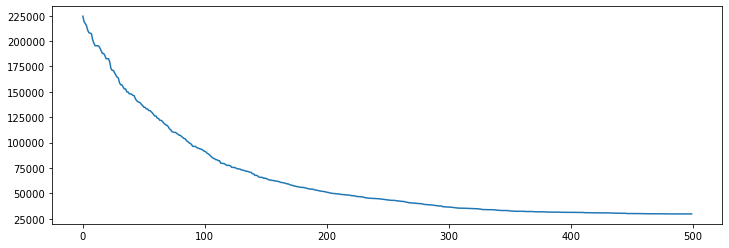

<Figure size 864x576 with 0 Axes>

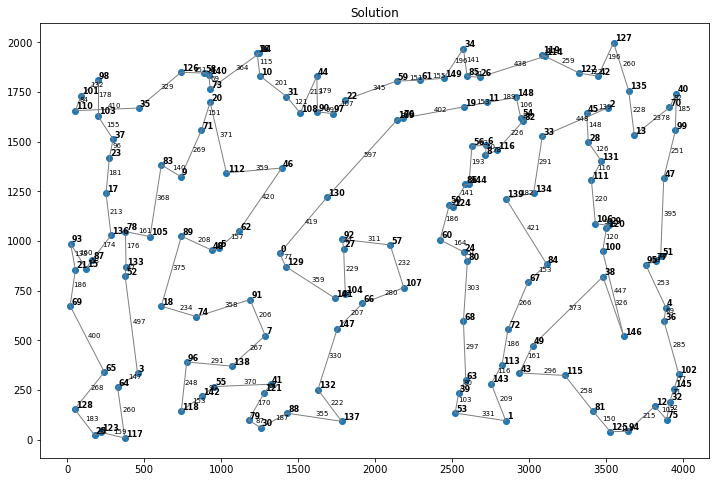

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 28757.01332318217 
 best_permutation: [ 40  99  47  51  77  95   4  36 102 145  32  75  12  94 125  81 115  49
  72 113  43   1 143  63  39  53 107  27  92 129   0  46 130  57  66 104
 141 147 132 137  88  41 121  30  79 138   7  91  74  18 118 142  55  96
   3  64 117 123  25 128  65  69  15  87  21  93  17  23  37 103 110 101
  98  35  83   9  78 136 133  52 105  89  48   5  62 112  71  20  73 140
  58 126  14  16  10  31 108  90  44  97  22 109  76  59  61 149  34  85
  26  11  19  56   6   8 116 134 139  86 144 124  50  60  24  80  68  67
  84 146  38 100 120  29 106 111 131  28   2  45  33  82  54 148 119 114
 122  42 127 135  13  70]


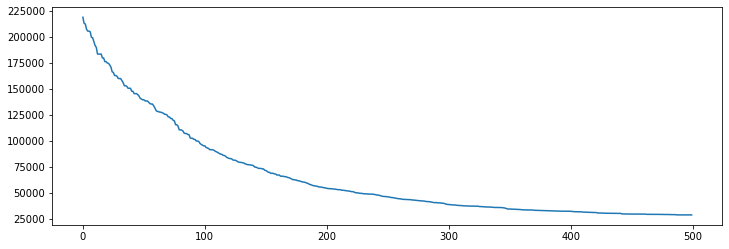

<Figure size 864x576 with 0 Axes>

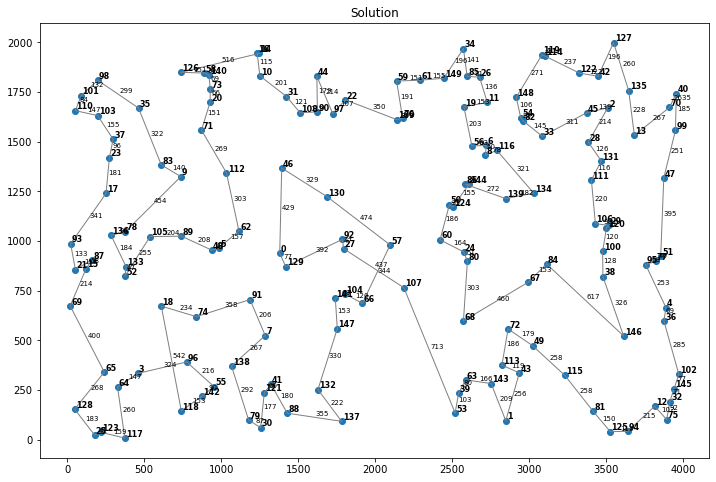

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 29250.585496509586 
 best_permutation: [ 70  40  99  47  51  77  95 146   4  36 102 145  32  75  12  94 125  81
 115  38 100 120  29 106  84  67  72  49  43   1  53  39  63 143 113  68
 107  57  66 104 147 132 137  88  30  79 121  41 138  55 142 118  96   3
  64 117 123  25 128  65  69  21  93  15  87 136  17  23 110 101  98 103
  37  83   9 105  78 133  52  18  74  89  48   5  62  91   7   0 129 141
  27  92 130  97  90 108  31  46 112  71  20  35 126  58 140  73  10  16
  14  44  22 109  76  59  61 149  19  85  34  26  11   6 116   8  56 144
  86 124  50  60  24  80 139 134 111 131  28  45  33  82  54 148 119 114
 122 127  42   2 135  13]


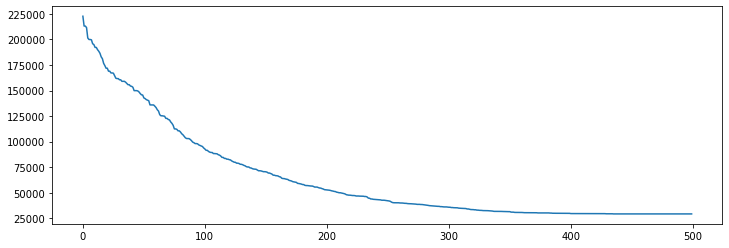

<Figure size 864x576 with 0 Axes>

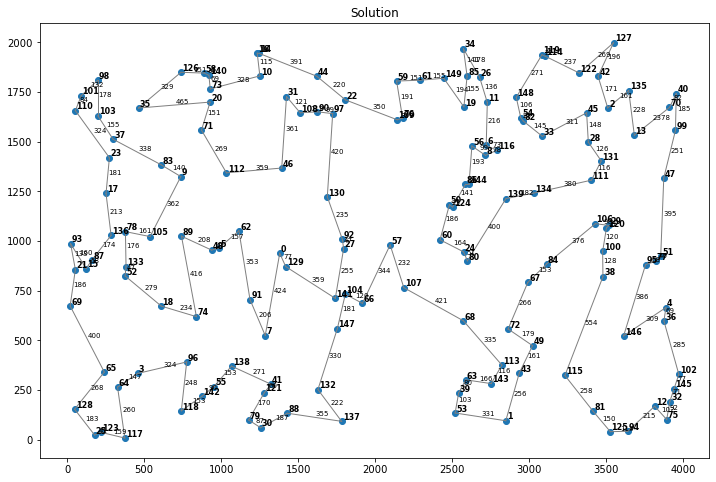

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 29269.23991864189 
 best_permutation: [123  25 128  64  65  69  21  93  15  87  52 133 105  78 136  17  23  37
 103 110 101  98  35  83  71  20  73 126  58 140  16  14  10  31 108  44
  90  97  22  59  61 149  34  85  26  11  54 148 119 114 122 127  42  45
   2 135  70  40  99  47  13 106 120  29 111 131  28  33  82 134 139  67
  84 100  38  95  77  51   4  36 102 145  32  75  12  94 125  81 146 115
  43  49  72 113 143   1  53  39  63  68 107  57  60  80  24 124  50  86
 144   8 116   6  56  19  76 109 130  92  27  66 104 141 147 132 137  88
  41 121  30  79 142  55 138   7  91 129   0  46 112  62   5  48   9  89
  18  74  96 118   3 117]


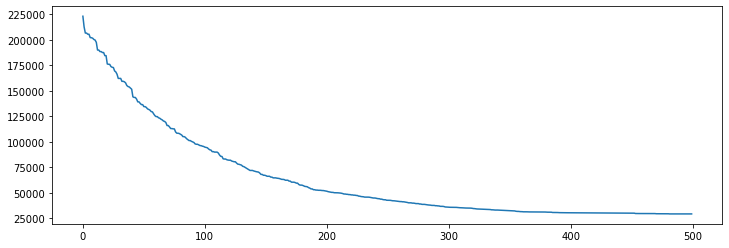

<Figure size 864x576 with 0 Axes>

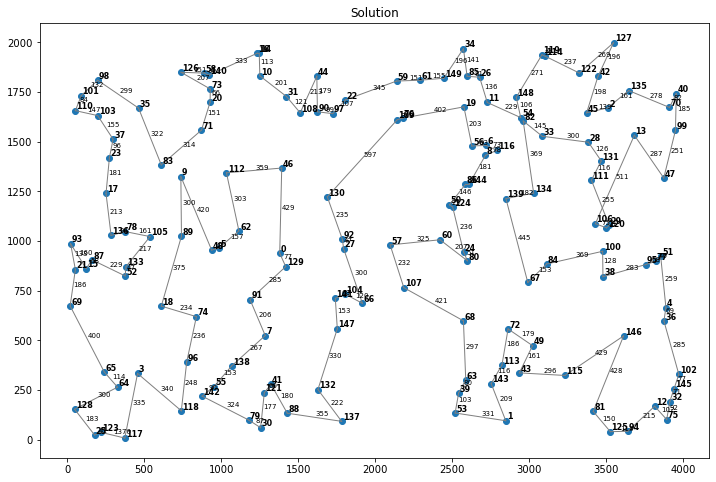

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 30740.772692114242 
 best_permutation: [110 101  98  35 126  58 140  73  20  71  83   9 112   5  48  89  18  74
  96 138   7  91 141 104  27  92 129   0  62  46 108  31  10  16  14  44
  90  97  22  59  61 149  34  85  26 119 148  54  82  33 134 111 131  28
  45 122 114 127  42   2 135  40  70  99  13  47  29 120 106 100  38  95
  77  51   4  36 146  84  67  72  49 113  43 115  81  12 102 145  32  75
  94 125   1 143  53  39  63  68  80  24  60  50 124  86 144 139 116   8
   6  56  11  19  76 109 130  57 107  66 147 132 137  88  30  79  41 121
  55 142 118 117 123  25 128  65  64   3  52 133 105  78  87  15  69  21
  93 136  17  23  37 103]


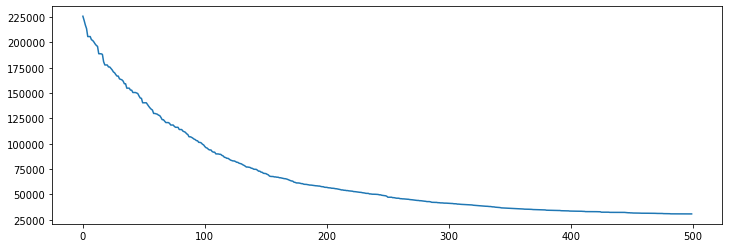

<Figure size 864x576 with 0 Axes>

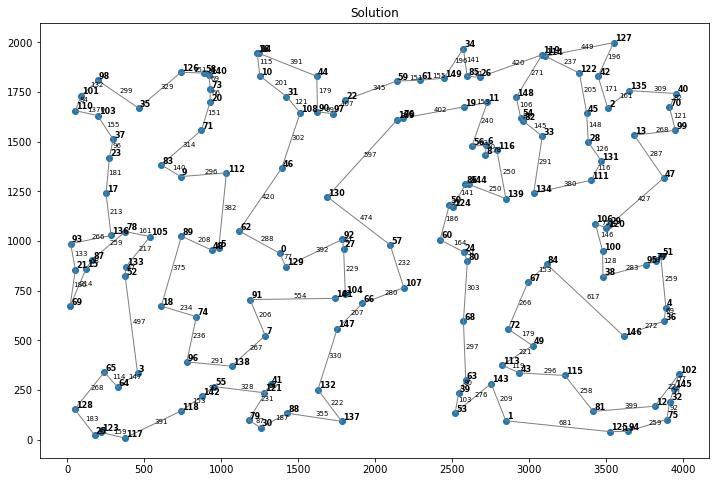

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 500 
 tsp_objective_function: 29949.359230659797 
 best_permutation: [ 74  18  52  96 118 117   3  64  65 123  25 128  69  21  93  15  87 133
 136  17  78 105  89   9  83  23  37 103 110 101  98  35 126  58 140  73
  20  71 112  62   5  48  91   0 129  27  92 130  46 108  31  10  16  14
  44  90  97  22  59  61 149  34  85  26  19  11 148 119 114 122  45   2
  42 127 135  40  70  99  13  47  29 120 106 100  38  95  77  51   4  36
 102 145  32  75  12 146  94 125  81 115  43   1  53  39  63 143 113  49
  84  67  72  68  80  24  60  50 124  86 144 139 134 111  28 131  33  82
  54 116   8   6  56  76 109  57 107  66 104 141 147 137 132   7  41 121
  88  30  79 142  55 138]


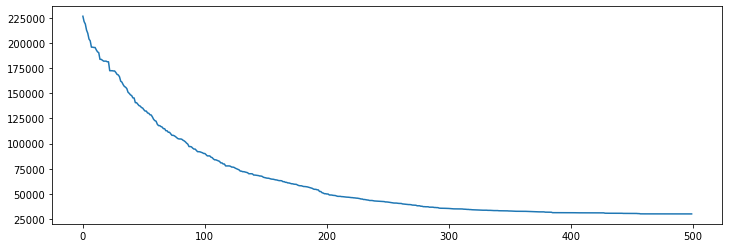

<Figure size 864x576 with 0 Axes>

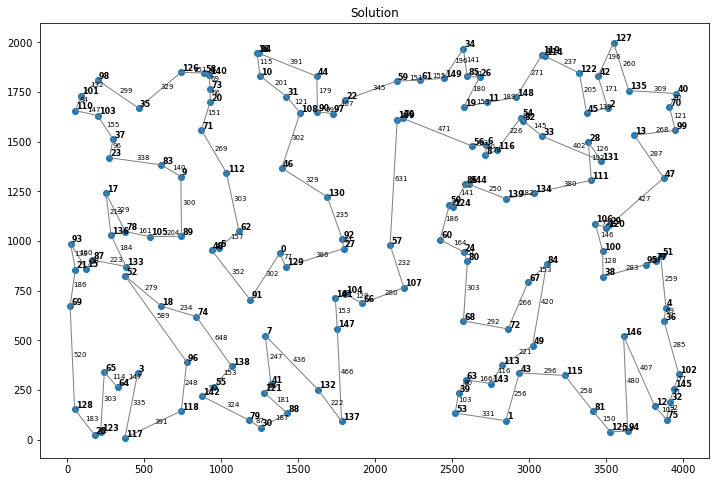

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.225 
 number_of_iterations = 500 
 tsp_objective_function: 30058.28664207192 
 best_permutation: [  5  62  89 105  78 136  87  93  21  69  15 133  52  18  74  96   3  64
  65 128  25 123 117 118 142  55 138 121  79  30  88  41   7  91   0 129
  27  92 130  97  22  76 109  57 107  66 104 141 147 132 137  53   1 143
  39  63  68  80  24  60  50 124  86 144 139 134  28 131 111 106  29 120
 100  38  84  67  72  49 113  43 115  81 125  94  75  32 145 102  12 146
  36   4  95  77  51  47  13  99  70  40 135   2  45 127  42 122 114 119
  26  34  85  11 148  54  82  33 116   8   6  56  19 149  61  59  44  90
 108  31  46 112  10  14  16 140  58 126  73  20  71  35  37 103  98 101
 110  23  17  83   9  48]


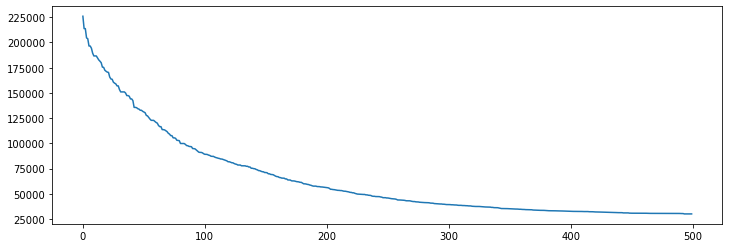

<Figure size 864x576 with 0 Axes>

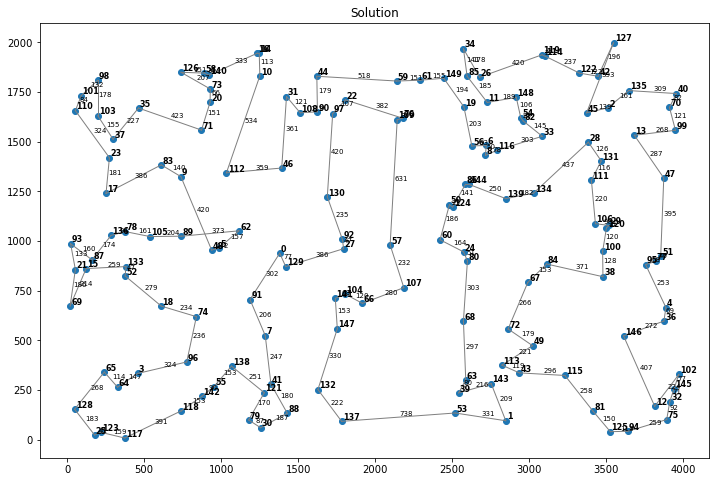

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 500 
 tsp_objective_function: 29765.566571986987 
 best_permutation: [ 67  84  38 100 120  29 106 111 134 139 144  86   8   6  56  76 109  59
  61 149  34  85  26  19  11 116  33  82  54 148 119 114 122  42 127 135
   2  45  28 131  13  70  40  99  47  51  77  95   4  36 146 102 145  32
  75  12  94 125  81 115  49  43 113   1 143  63  39  53 137 132  88  30
  79 121  41 138  55 142 118  96  18  52  65  64   3 117 123  25 128  69
  21  93  15  87 136  17  78 133 105  89  74   7 147 141 104  66  27 129
   0  91  48   5  62 112   9  71  20  73  83  23  37 103 110 101  98  35
 126  58 140  14  16  10  31  44  22  97  90 108  46 130  92  57 107  60
 124  50  24  80  68  72]


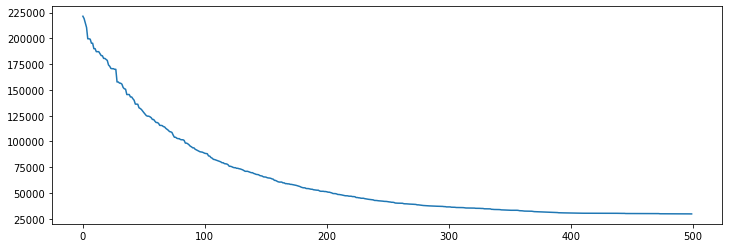

<Figure size 864x576 with 0 Axes>

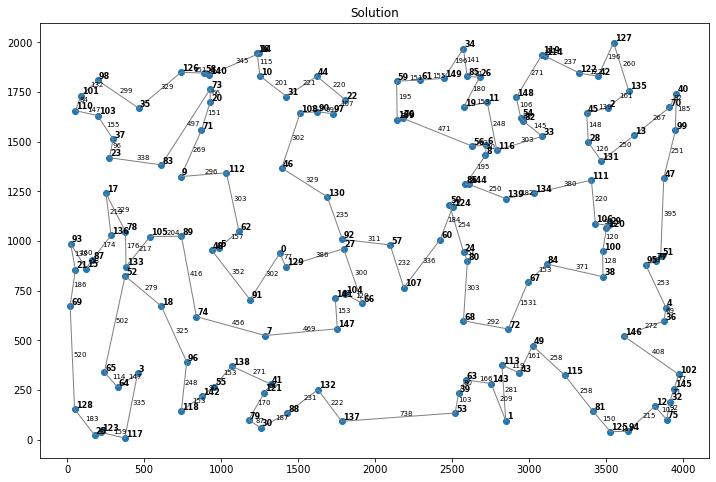

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.275 
 number_of_iterations = 500 
 tsp_objective_function: 29455.75105647101 
 best_permutation: [140  73  20  71  83   9 112  62   5   0 129  27  92 130  46 108  31  14
  16  10  44  90  97  22 109  76  59  61 149  34  85  26  11  19   6   8
 116  82  54 148 119 114 122  42 127 135  40  70  99  47  13 131 111  28
   2  45  33 134 106  29 120 100  38  95  77  51   4  36 146  12 102 145
  32  75  94 125  81 115   1  53  39  63 143 113  43  49  72  67  84 139
  56 144  86 124  50  24  80  68  60  57 107 137 132 147  66 104 141   7
  91  74  96 142  55 138 121  41  88  30  79 118   3  65  64 117 123  25
 128  69  21  93  15  87 136 133  52  18  48  89 105  78  17  23  37 103
 110 101  98  35 126  58]


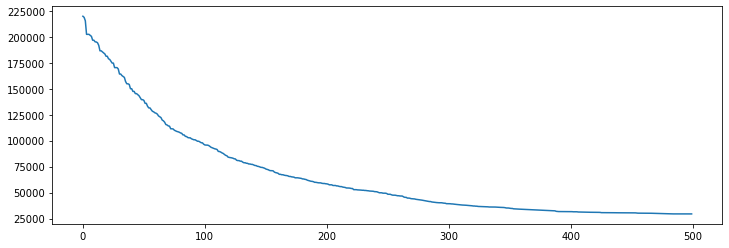

<Figure size 864x576 with 0 Axes>

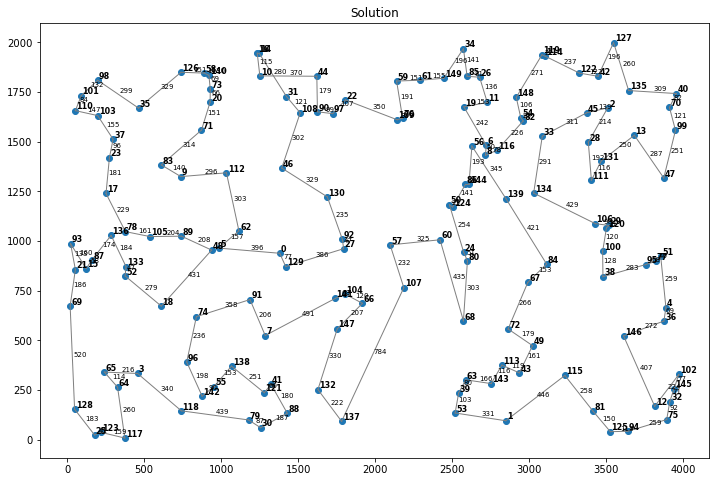

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 500 
 tsp_objective_function: 29408.360942710966 
 best_permutation: [ 84  38 100 106 120  29  47  99  40  70  13   2 135 127  42 122 114 119
 148  54  82 116  33  45  28 131 111 134 139   8   6  56  11  26  34  85
  19 149  61  59  76 109  22  97  90  44  14  16  10  31 108  46 130  92
  27 129   0  91  48   5  62 112  20  73 140  58 126  98 101 110 103  37
  35  71  83   9  89 105  78  23  17 136  52 133  87  93  15  21  69  65
  64 128  25 123 117   3  18  74  96 118 142  55 138  41 121  79  30  88
 137 132   7 147 141 104  66 107  57  60  50 124  86 144  24  80  68  72
  49  43 113 143  63  39  53   1 115  81 125  94  12  75  32 145 102  36
   4  51  77  95 146  67]


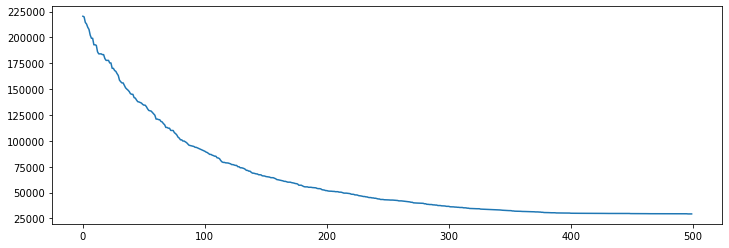

<Figure size 864x576 with 0 Axes>

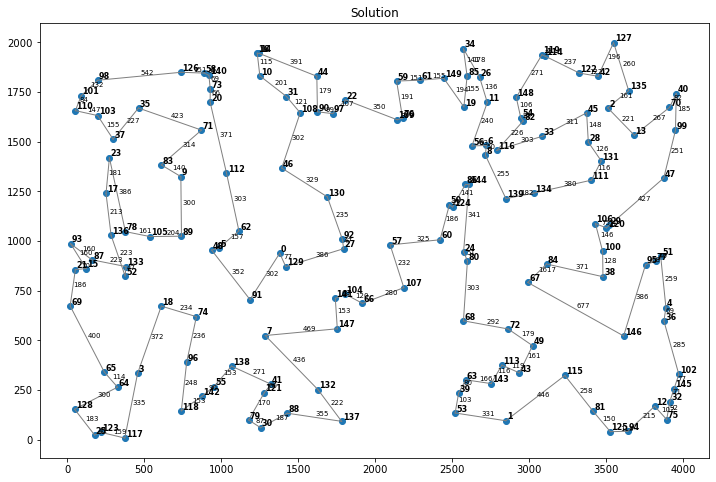

In [201]:
dist_matr = [kroA150_dist]
coords = kroA150_coords
num = [150]

pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.2, 0.225, 0.25, 0.275, 0.3]
num_of_iter = [500]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

## kroA200

In [207]:
def kroA200():
    coords_string = """1 1357 1905
    2 2650 802
    3 1774 107
    4 1307 964
    5 3806 746
    6 2687 1353
    7 43 1957
    8 3092 1668
    9 185 1542
    10 834 629
    11 40 462
    12 1183 1391
    13 2048 1628
    14 1097 643
    15 1838 1732
    16 234 1118
    17 3314 1881
    18 737 1285
    19 779 777
    20 2312 1949
    21 2576 189
    22 3078 1541
    23 2781 478
    24 705 1812
    25 3409 1917
    26 323 1714
    27 1660 1556
    28 3729 1188
    29 693 1383
    30 2361 640
    31 2433 1538
    32 554 1825
    33 913 317
    34 3586 1909
    35 2636 727
    36 1000 457
    37 482 1337
    38 3704 1082
    39 3635 1174
    40 1362 1526
    41 2049 417
    42 2552 1909
    43 3939 640
    44 219 898
    45 812 351
    46 901 1552
    47 2513 1572
    48 242 584
    49 826 1226
    50 3278 799
    51 86 1065
    52 14 454
    53 1327 1893
    54 2773 1286
    55 2469 1838
    56 3835 963
    57 1031 428
    58 3853 1712
    59 1868 197
    60 1544 863
    61 457 1607
    62 3174 1064
    63 192 1004
    64 2318 1925
    65 2232 1374
    66 396 828
    67 2365 1649
    68 2499 658
    69 1410 307
    70 2990 214
    71 3646 1018
    72 3394 1028
    73 1779 90
    74 1058 372
    75 2933 1459
    76 3099 173
    77 2178 978
    78 138 1610
    79 2082 1753
    80 2302 1127
    81 805 272
    82 22 1617
    83 3213 1085
    84 99 536
    85 1533 1780
    86 3564 676
    87 29 6
    88 3808 1375
    89 2221 291
    90 3499 1885
    91 3124 408
    92 781 671
    93 1027 1041
    94 3249 378
    95 3297 491
    96 213 220
    97 721 186
    98 3736 1542
    99 868 731
    100 960 303
    101 1380 939
    102 2848 96
    103 3510 1671
    104 457 334
    105 3888 666
    106 984 965
    107 2721 1482
    108 1286 525
    109 2716 1432
    110 738 1325
    111 1251 1832
    112 2728 1698
    113 3815 169
    114 3683 1533
    115 1247 1945
    116 123 862
    117 1234 1946
    118 252 1240
    119 611 673
    120 2576 1676
    121 928 1700
    122 53 857
    123 1807 1711
    124 274 1420
    125 2574 946
    126 178 24
    127 2678 1825
    128 1795 962
    129 3384 1498
    130 3520 1079
    131 1256 61
    132 1424 1728
    133 3913 192
    134 3085 1528
    135 2573 1969
    136 463 1670
    137 3875 598
    138 298 1513
    139 3479 821
    140 2542 236
    141 3955 1743
    142 1323 280
    143 3447 1830
    144 2936 337
    145 1621 1830
    146 3373 1646
    147 1393 1368
    148 3874 1318
    149 938 955
    150 3022 474
    151 2482 1183
    152 3854 923
    153 376 825
    154 2519 135
    155 2945 1622
    156 953 268
    157 2628 1479
    158 2097 981
    159 890 1846
    160 2139 1806
    161 2421 1007
    162 2290 1810
    163 1115 1052
    164 2588 302
    165 327 265
    166 241 341
    167 1917 687
    168 2991 792
    169 2573 599
    170 19 674
    171 3911 1673
    172 872 1559
    173 2863 558
    174 929 1766
    175 839 620
    176 3893 102
    177 2178 1619
    178 3822 899
    179 378 1048
    180 1178 100
    181 2599 901
    182 3416 143
    183 2961 1605
    184 611 1384
    185 3113 885
    186 2597 1830
    187 2586 1286
    188 161 906
    189 1429 134
    190 742 1025
    191 1625 1651
    192 1187 706
    193 1787 1009
    194 22 987
    195 3640 43
    196 3756 882
    197 776 392
    198 1724 1642
    199 198 1810
    200 3950 1558"""
    n = 200
    coords = np.zeros((n, 2))
    it = iter(coords_string.split())
    for i in range(n):
        next(it)
        coords[i, 0] = float(next(it))
        coords[i, 1] = float(next(it))
    distance_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            distance_matrix[i, j] = np.sqrt(((coords[i, :] - coords[j, :])**2).sum())
    return distance_matrix, coords

In [208]:
kroA200_dist, kroA200_coords = kroA200()
# kroA150 = 26524?
# kroA200 29368?

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 32886.37177335958 
 best_permutation: [183 135  60  36 178  15  62 187 115 121 193  50 117 123 137   8  77  81
   6 198  25  31  23 158 173 120 171  45  11 146  39 110 116 114  52   0
  84 131 144 190 122  14  78 159 161  63  19  54  66  30  41 134 185 126
 111 119  46 156 186  53   5 108 106  74 154 182  21 133   7 128 145  16
  24 142  89  33 102 113  97  57 140 170 199  87 147  27  38  37  70 129
  71  82  61 184  49  94  85 138 195 177  55 151   4 104  42 136 132 175
 112 194 181  93  90 149 143  69  75 101  22 172 167 168 163 139  20 153
  88  72   2  58  40  29  67  34   1 180 124 160 150  79  76 157  64 176
  12 197  26 192 127 166  59 100   3 162  92 105 148  18  91   9 174  98
  13 191 107 141  68 188 130 179  73  56  35  99 155  32  44 196  80  96
 103 164 125  86  95 165  10  51 169  83  47 118 152  43  65 189  48  17
 109  28]


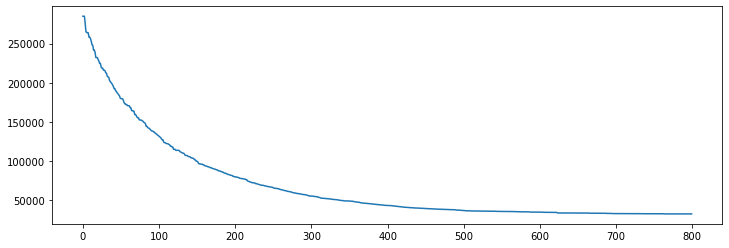

<Figure size 864x576 with 0 Axes>

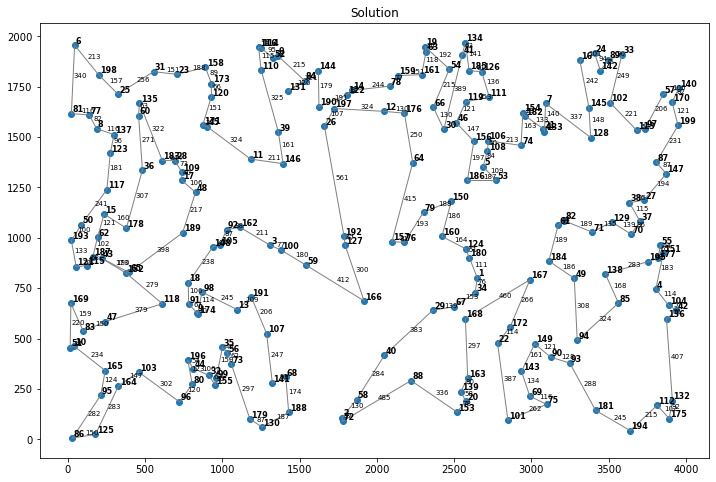

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 33519.33301632968 
 best_permutation: [146  11  45 171 120 173 158  23  31 135  60  25 198   6  81  77   8 137
 123 117  15 178  43  62  50 193 187 115 121 169  83  10  51 165  47 152
  65 118  91  18 189  36 183  28 109  17  48 162  92 105 148  98   9 174
 103 164  95  86 125  96  80 196  44  32 155  99  73 179 130 188   2  72
 153  88  40  58  68 141 107  56  35  13 191   3 100  59 192 127 166 157
  76  29  67 168 163 139  20 101  69  75 181 194 112 175 132 136  42 104
   4 177 151  55  37 147 199 170 140  57  97 102  33  89 142  24  16   7
  21 133 145 128 113  87  27  38 129  71  70 195  85 138  49  82  61 184
 167 149  94  93  90 143 172  22  34   1 180 124 160  79 150 186  53   5
 156 106 108  74 182 154 111 119  46  30  66  54 185 126  41 134  19  63
 161 159  78  64 176  12  14 122 197  26 190 144  84  52 110 116 114   0
 131  39]


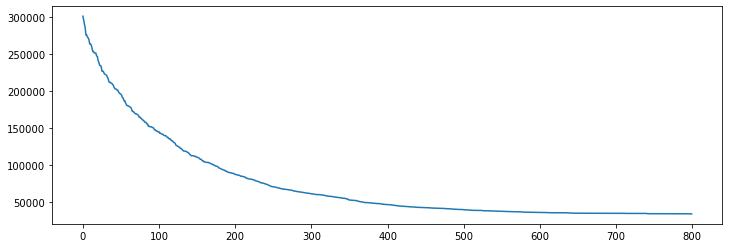

<Figure size 864x576 with 0 Axes>

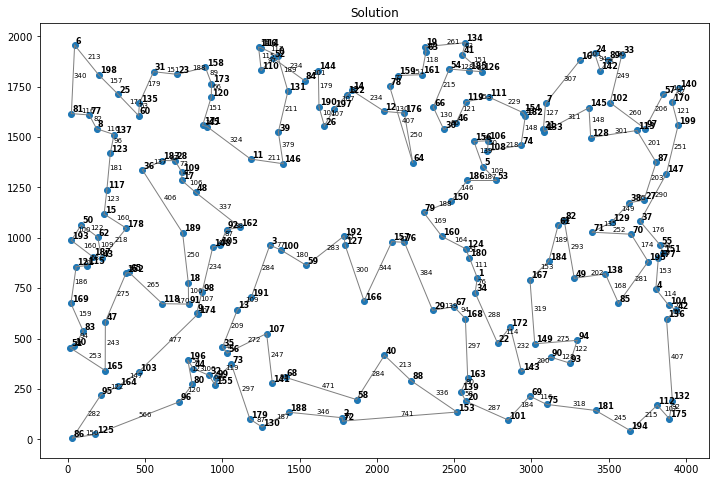

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 32109.617519614123 
 best_permutation: [136  42 104   4  85 138 195 177 151  55  70  37  38  27 147  87 199 170
 140  57  97 113  33  89 142  24  16   7 182 154 111 119 126 185  41 134
  54  19  63 161 159  78 176  12  14 122 197 190 144  84   0  52 114 116
 110 131  39  26 192 127  59 100   3 146  11  45 171 120 173 158  23  31
 135  60  25 198   6  81  77   8 137 123 117  15  50 193  62  43 187 115
 121 169  51  10  83  47 165  95  86 125 164 103  96  80  32 155  99  73
  56  35  44 196 174   9  91  98  18 118  65 152 178  36 183  28 109  17
  48 189 148 105  92 162 191  13 107  68 141 179 130 188  72   2  58  40
 166 157  76  64  66  46  30  79 160 150 186 156 106 108   5  53  74  21
 133 145 102 128 129  71  82  61  49 184 167 124 180   1  34  67  29 168
 163  88 153 139  20 101  75  69 143  22 172 149  90  94  93 181 194 112
 175 132]


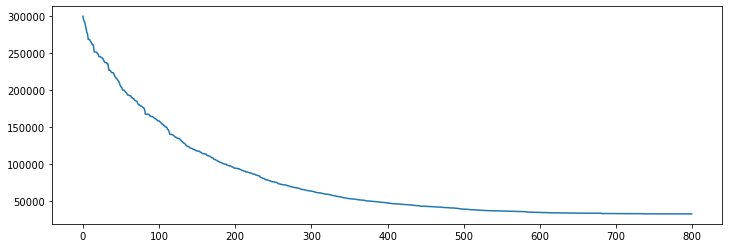

<Figure size 864x576 with 0 Axes>

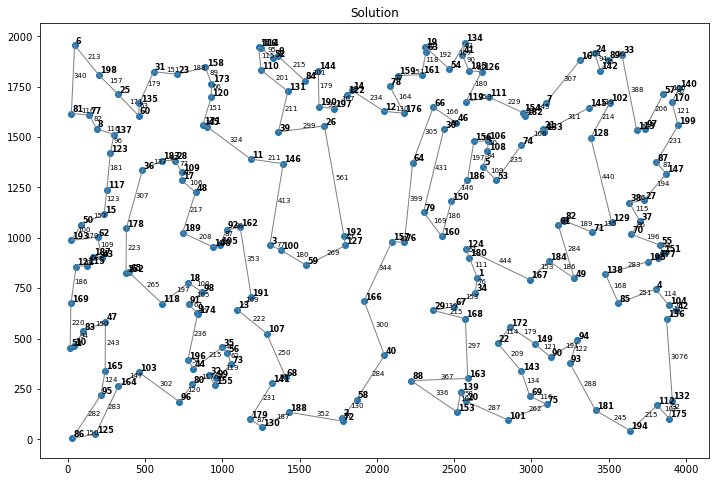

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 33653.70303728675 
 best_permutation: [ 88 163 168  29  67  34   1 180 124 160  76 157  79  64  30 156  46  54
  66 176  12  14 122 197  26 190  39 146 192 127  59 100   3  11  45 171
 183  28 109  17  48 189  18  91   9 174  98 148 105  92 162 191  13 107
  68 188 141 130 179  73  56  35 196  44  32  99 155  80  96 103 164 125
  86  95 165  51  10  83  47 118  65 152  43 187 115 169 121 193  50  62
 178  15 117 123   8  81  77   6 198  25 137  36  60 135  31  23 158 173
 120 110 116 114  52   0 131  84 144  78 159 161  63  19 134  41 185 126
 119 111 154 182  74 106 108   5 186 150  53  61  82  71 129  38  87  97
 113 102 145 128 133  21   7  16  24 142  89  33  57 140 170 199 147  27
  37  70  55 151 177 195   4 104  42 136 132 175 112 194 181  93  94  85
 138  49 184 167 172  22 149  90 143  69  75 101  20 139 153  72   2  58
 166  40]


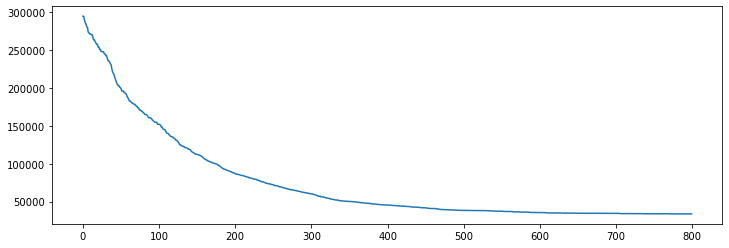

<Figure size 864x576 with 0 Axes>

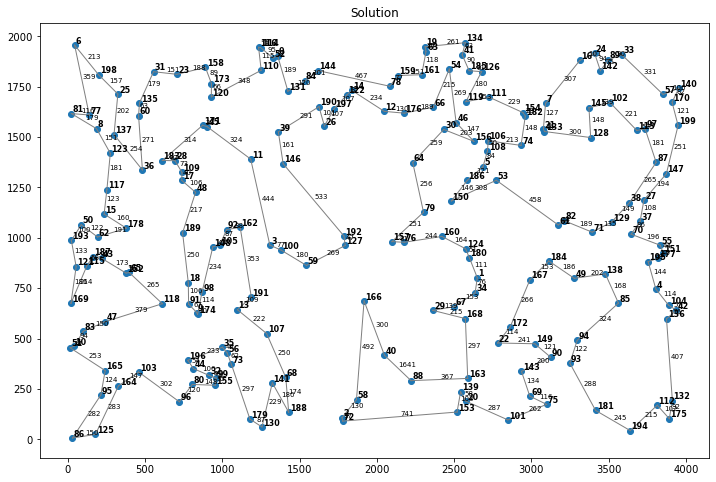

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 33252.113232318974 
 best_permutation: [ 96 103 164  95 125  86  51  10 169  83 165  47  65 152  43 187 115 121
 193  50  62  15 117  36  60 135  25 137 123   8  77  81   6 198  31  23
 158 173 120 110 116 114  52   0 131  84 144 190 197 122  14  78 159 161
  63  19 134  41 185 126 111 156 186   5  53 108 106  74 154 182  21 133
   7  16  24  33  89 142 145 128 102  57 140 170 199  97 113  87 147  27
  38 129  71  61  82 184  49 138  85  70  37  55 151 177 195   4 104  42
 136 132 175 112 194 181  93  94  90 149 167 172  22 143  69  75 101 163
 139  20 153  88  29  67 168  34   1 180 124 160  76  79 150  64  30  46
 119  54  66 176  12  26  39 146   3 191 100  59 127 192 157 166  40  58
   2  72 188  68 141 107  13 174   9  91  18  98 148 105  92 162  11  45
 171 183  28 109  17  48 189 178 118 196  44  32  35  56  73 130 179  99
 155  80]


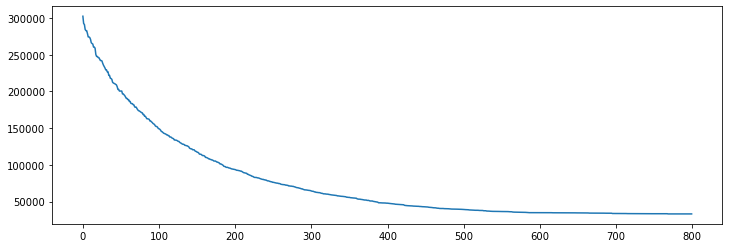

<Figure size 864x576 with 0 Axes>

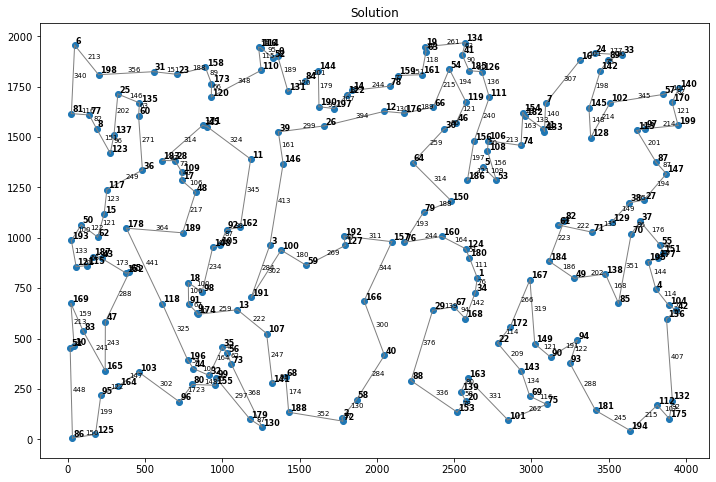

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 32528.934195921098 
 best_permutation: [176  64  30  46 156 106 108   5  53 186 150 124 180   1  34 168  67  29
 160  79  76 157  40 166 127 192  59 100   3 162  92 105  98 174   9  91
 118  18 148  48 109 171  45  11 146  39  26 190 197 122 144  84 131   0
  52 114 116 110 120 173 158  23  31 135  25 198   6  81  77   8 123 137
  60  36 183  28  17 189 178  65 152  43  15 117  50 193  62 187 115 121
 169  51  10  83  47 165  95  86 125 164 103  96  80 196  44  32  99 155
 179 130  73  56  35  13 191 107 141  68 188  72   2  58  88 163 139  20
 153 101  69  75  90 149 143  22 172 167 184  61  82  49 138  85  94  93
 181 194 112 175 132 136  42 104   4 177 151  55 195  70  71 129  38  37
  27 147  87  97 199 170 140  57  33 102 113 128 145 142  89  24  16   7
  21 133  74 182 154 111 119 126 185 134  41  54  66 161  63  19 159  78
  14  12]


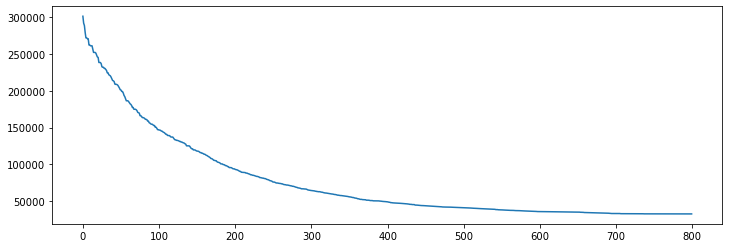

<Figure size 864x576 with 0 Axes>

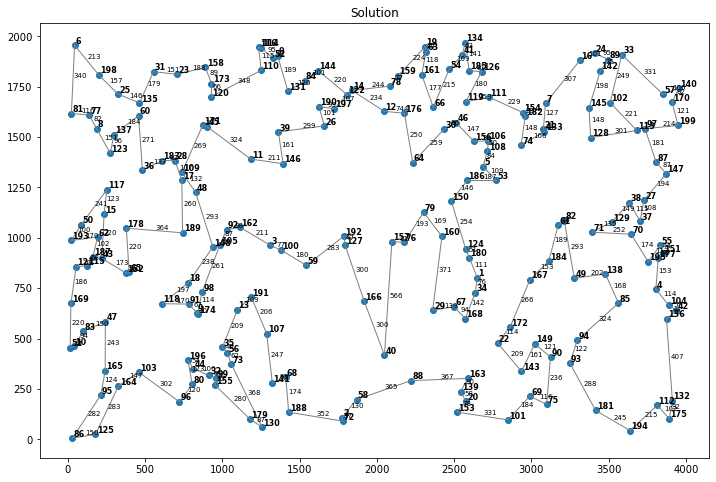

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 33809.09583011542 
 best_permutation: [117 123 137   8  77  81   6 198  25 135  60  36 183  28 109  17  48 171
  31  23 158 173 120  45 110 116 114  52   0 131  84 144  78 159  19  63
 161 176  12  14 122 197  26 190  39  11 146 192 157  76 160 124 180   1
  67  29 168  34 167 184  49 138  71  82  61  74 111 119  46 156 106 108
   5  53 186 150  79  64  30  66  54 134  41 185 126 154 182  21 133   7
  16 145 128 113 102 142  24  89  33  57 170 140 199  97  87 147  27  38
 129  70  37  55 151 177 195   4 104  42 136  85 112 132 175 194 181  75
  93  94  90 149 172  22 101  69 143  20 153 139 163  88  40 166 127  59
 100   3 162  92 105 148 189  18  91   9 174  98  13 191 107 141  68  58
   2  72 188 130 179 155  99  32  73  56  35 196  44  80  96 103 118  65
 152  43 187 115  47  83 165 164 125  86  95  10  51 169 121 193  50  62
 178  15]


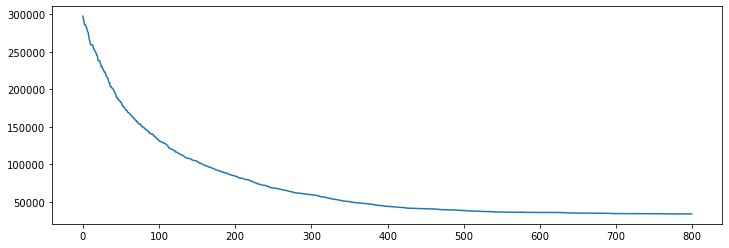

<Figure size 864x576 with 0 Axes>

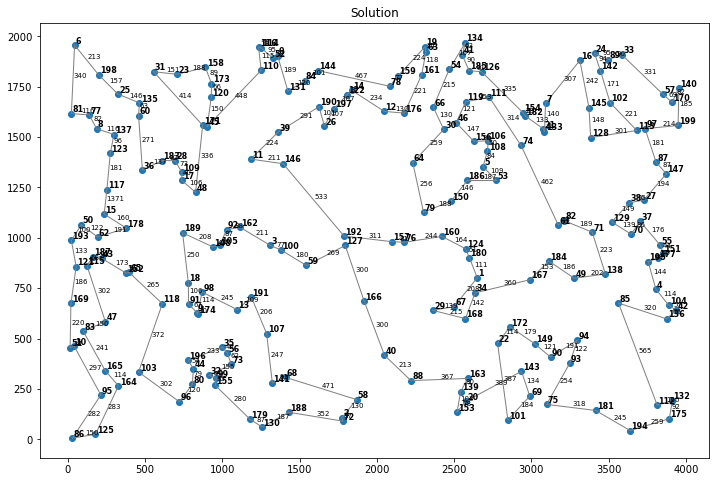

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 33190.90459704526 
 best_permutation: [ 64  66  54  41 134  19  63 161 159  78 176  12  14 122 197 144   0  52
 114 116 110 131  84 190  26  39  11 146 192 127 157  76 166  59 100   3
 191  13  98 148 105  92 162 189  48  17 109 171  45 120 173 158  23  31
 198   6  81  77   8 123 137  25 135  60  28 183  36 117  15  50 193 121
 169  10  51  86 125  95 164 165  83  47 115 187  43  62 178 152  65 118
  18  91   9 174 103  96  80 196  44  32 155  99  73  56  35 107  68 141
 179 130 188  72   2  58  40  88  29  67 168 180   1  34  22 163 139  20
 153 101  69  75 181 194 112 175 132 136  42 104   4 195 177 151  55  70
  37  38  27 147  87 199 170 140  57  97 113 102  33  89 142  24  16 145
 128 133  21   7 182 154 111 126 185 119  46  30 156 186  53   5 108 106
  74  61  82  71 129 138  85  94  93  90 149 143 172 167  49 184 124 160
 150  79]


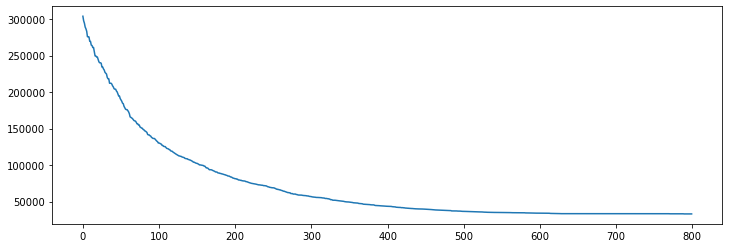

<Figure size 864x576 with 0 Axes>

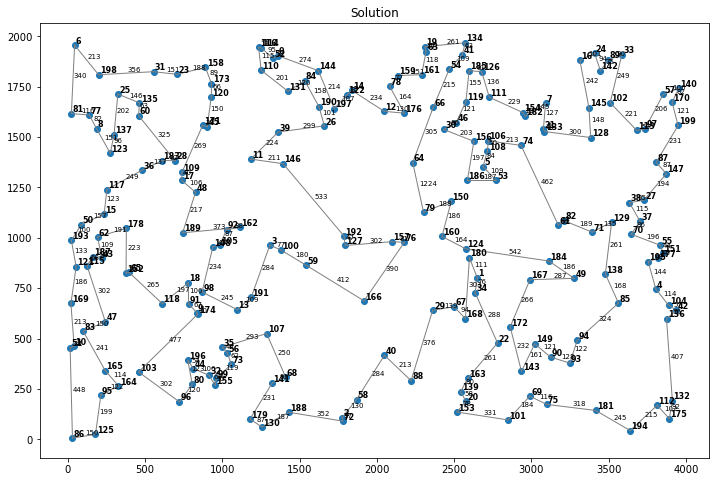

 population_size = 1000 
 crossover_probability = 0.9 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 32583.393894735498 
 best_permutation: [130 179  73  56 107  13 191 100   3 162  92 105 148  98  35  99 155  32
  80  96  44 196 174   9  91  18 118  65 178  62 187  43 152  47 165 103
 164  95 125  86  51  10  83 169 121 115 193  50  15 117 123 137   8  77
  81   6 198  25  31 135  60  36 183  28 109  17 189  48  45 171  23 158
 173 120  11 146  39 190 144  84   0  52 114 116 110 131  26 197 122  14
  12  78 159 161  63  19  54  41 134 185 126 111 154 182  21 133   7  16
  24  89  33 142 102 145 128 113  97  57 140 170 199  87 147  27  55 151
 177   4 104  42 136 132 175 112 194 181  75  69 143 149  90  93  94  85
 138 195  70  37  38 129  71  82  61  49 184 167 172  22 101 163 139  20
 153  88  40  29  67 168  34   1 180 124 160 150 186   5  53  74 108 106
 156 119  30  46  66 176  64  79  76 157 166 127 192  59 141  68  58   2
  72 188]


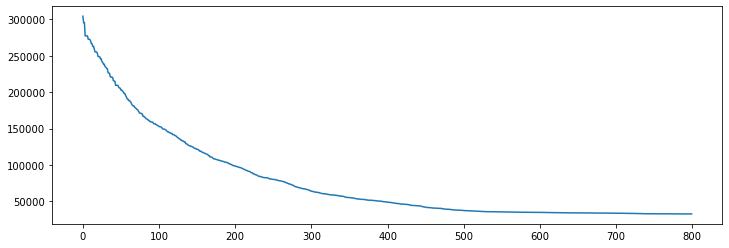

<Figure size 864x576 with 0 Axes>

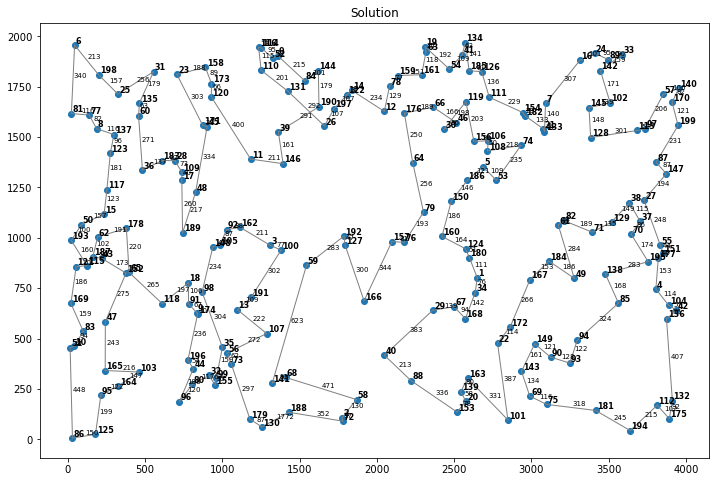

In [210]:
dist_matr = [kroA200_dist]
coords = kroA200_coords
num = [200]

pop_size = [1000]
cross_prob = [0.975, 0.95, 0.9]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [800]
for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 32689.5732338337 
 best_permutation: [ 66  64 176  12  14 122 197 190  26 146  11  39 131  84 144   0  52 110
 114 116 158 173 120  45 171  23  31  25 198   6  81  77 137   8 135  60
 183  28 109  17  48  36 123 117  15 178  65 152  43 187  62  50 193 115
 121 169  51  10  83  47 165  95  86 125 164 103  96  80  44  32 155  99
  73  56  35 196 118  91   9 174  98  18 189 148 105  92 162   3 100  59
 191  13 107  68 141 179 130 188   2  72  58  40  88 153  20 139 163  22
 172 167 184  82  61   1  34 168  67  29 166 127 192 157  76  79 160 124
 180 150 186  53   5 108  74  21 133 128 145 142 102 113  97  38  37  70
 129  71 138  49  94  90 149 143 101  69  75  93 181 194 112 175 132  85
 136  42 104   4 195 177 151  55  27 147  87 199 170 140  57  33  89  24
  16   7 182 154 106 156  30  46 119 111 126 185 134  41  54  63  19 159
  78 161]


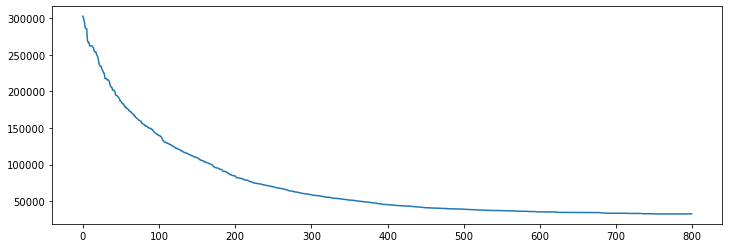

<Figure size 864x576 with 0 Axes>

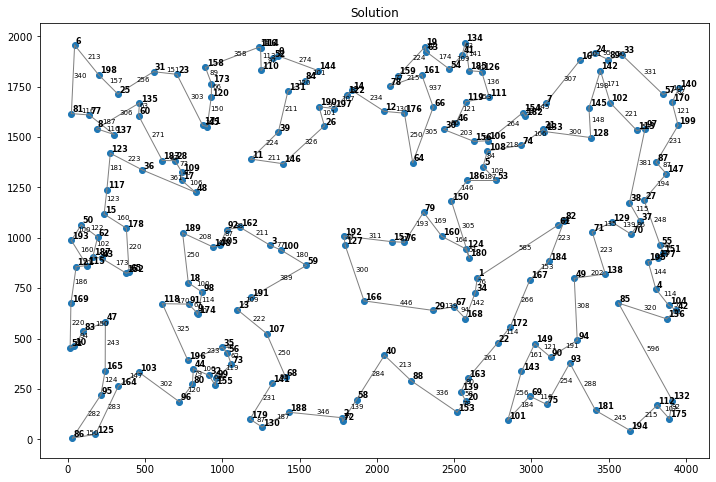

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 32208.266831391233 
 best_permutation: [ 33  89 142 145 128 102  57 140 170 199  97 113  87 147  27  38  37  70
  55 151 177 195   4 104  42 136 132 175 112 194 181  94  93  75  69 101
 153  20 139 163  22 172 143  90 149 167 184  49  85 138 129  71  82  61
  74  53 186   5 106 108 156  46  30  66 176  64  79 150 160 124 180   1
  34 168  67  29  76 157 192 146  11 162  92 191 107   3 100  59 127 166
  40  88  58   2  72 188  68 141 130 179 155  80  96 196  44  32  99  73
  56  35  13  98 174   9  91 118  18 105 148 189  48  17 109  28 183  36
 178  65 152  47  83 165 103 164  95 125  86  51  10 169 121 115 187  43
  62 193  50  15 117 123 137   8  77  81   6 198  25  60 135  31  23 158
 173 120 171  45 110 116 114  52   0  39 131  84 144 190  26 197 122  14
  12  78 159 161  63  19  54  41 134 185 126 119 111 154 182  21 133   7
  16  24]


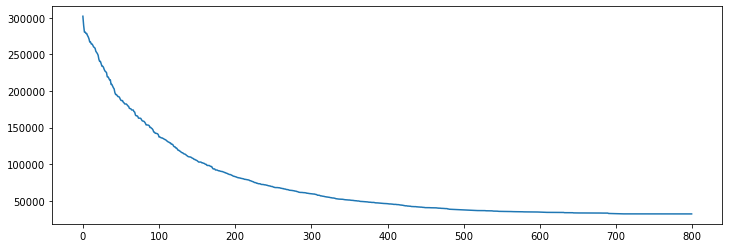

<Figure size 864x576 with 0 Axes>

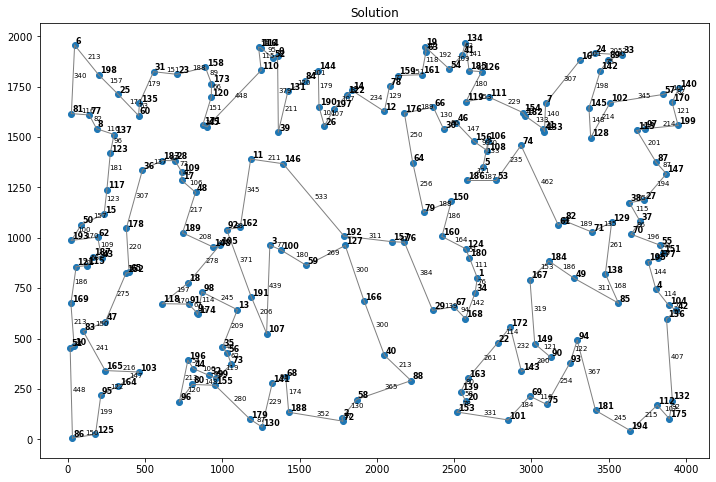

 population_size = 1000 
 crossover_probability = 0.975 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 32427.273156057083 
 best_permutation: [ 43 187  62 178  15  50 193 115 121 169  51  10  83  47 165  86 125  95
 164 103  96  80  44 196  32 155  99  73 179 130 188  72   2  58  68 141
 107  56  35  13 191   3 100  59 192 127 166  40  88 153  20 139 163 101
 143  69  75 181 194 112 175 132 136  42 104   4 195 177 151  55  37  27
  38 129  70  85 138  71  82  61 184 167  49  94  93  90 149 172  22 168
  29  67  34   1 180 124 150 160  76 157  79  64 176  66  30 186  53   5
 108  74  21 133 128 145 102 113  97  87 147 199 170 140  57  33  89 142
  24  16   7 182 154 111 106 156  46 119 126 185  54  41 134  19  63 161
 159  78  12  14 122 144  84 190 197  26  39 146 162  11  45 171 120 173
 110 131   0  52 114 116 158  23  31 135  25 198   6  81  77   8 137 123
 117  36  60 183  28 109  17  48 189  92 105 148  98 174   9  91  18 118
  65 152]


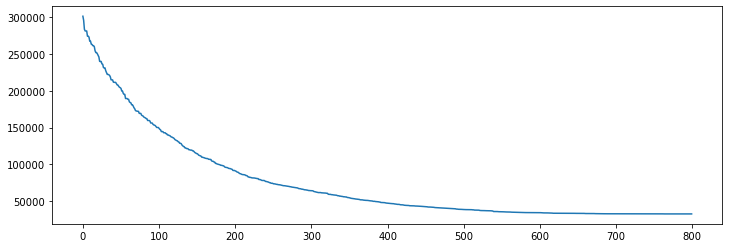

<Figure size 864x576 with 0 Axes>

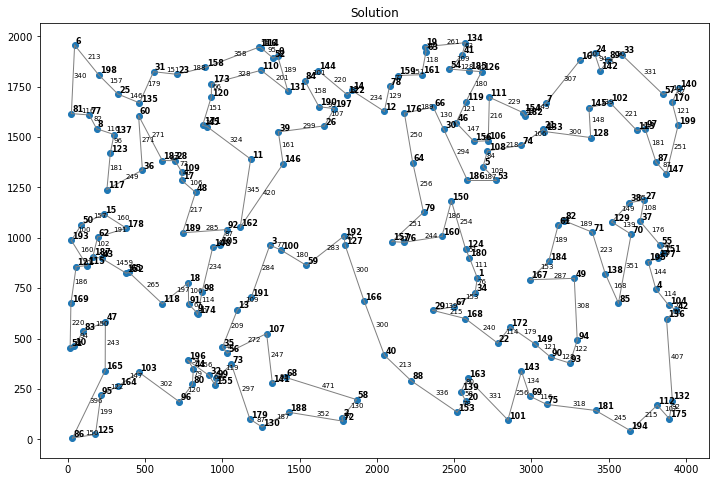

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 32370.458016737524 
 best_permutation: [175 132 136  42 104   4  85 138  70 195 177 151  55  37 147 199 170 140
  57  33  89  24  16 142 145 128 102 113  97  87  27  38 129  71  49 167
 184  61  82  74 133  21   7 182 154 111 126 134  41 185 119  66  54  19
  63 161 159  78  14 122 197  26 190 131 110 116 114  52   0  84 144  39
 146  11 171  45 120 173 158  23  31  25 198   6  81  77   8 137 123 117
  15  50  62  43 187 115 193 121 169  51  10  83  47 165  86 125  95 164
 103  96  80  44 196  32 155  99  73 179 130 188   2  72  58  68 141 107
 191  13  35  56 174   9  91  98  18 118  65 152 178  36  60 135 183  28
 109  17  48 189 148 105  92 162   3 100  59 127 192  12 176  64  30  46
 156 106 108   5  53 186 150 124 180   1  34 172  22 168  67  29 160  79
  76 157 166  40  88 153  20 139 163 101 143 149  90  69  75  93  94 181
 194 112]


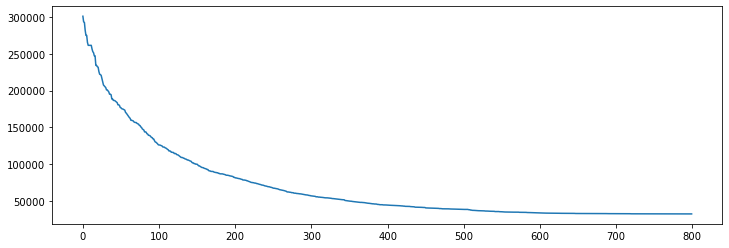

<Figure size 864x576 with 0 Axes>

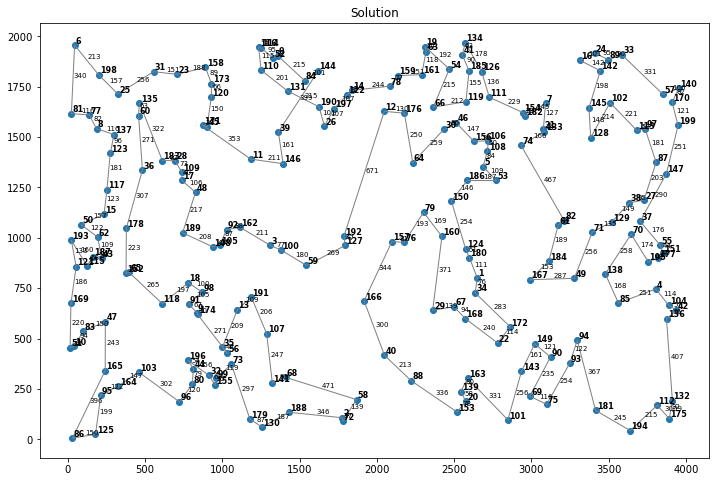

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 32861.480386346935 
 best_permutation: [167  53   5 186  64  79  76 157 127 192 100  59 166  40  58   2  72 188
 130 179 141  68 107  35  56  73  99 155  32 118  91   9 174 196  44  80
  96 103 164  95 125  86 165  47  83  10  51 169 121 115 187  43 152  65
  62 193  50  15 117 178 189  18  98  13 191   3 162  92 105 148  48  17
 109  28 183  36 123   8  77  81   6 198  25 137  60 135  31  23 158 173
 120  45 171  11 146  39 131 110 116 114  52   0  84 144 190  26 197 122
  14  12  78 159 161  63  19 134  41 126 185  54  66 176  30  46 119 156
 108 106 111 154 182  74 133  21   7  16  24 142  89  33 102 145 128 113
  97  57 140 170 199  87 147  27  37  38 129  71  82  61 184  49  94 138
  85  70  55 151 177 195   4 104  42 136 132 175 112 194 181  93  90 149
  75  69 101 143  22 172 163 139  20 153  88  29 168  67 160 150 124 180
   1  34]


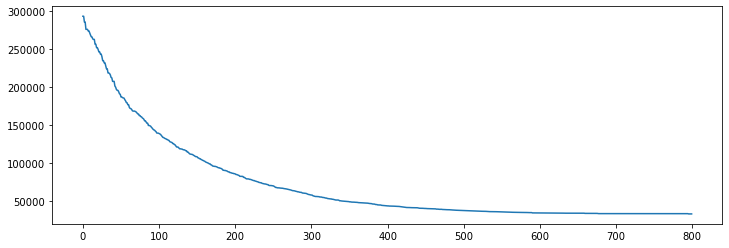

<Figure size 864x576 with 0 Axes>

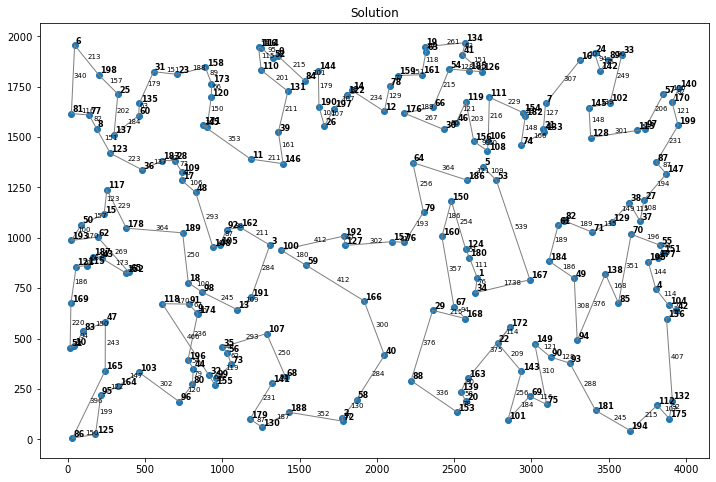

 population_size = 1000 
 crossover_probability = 0.9625 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 32727.55586623234 
 best_permutation: [160  76 157  79  64 156 106 108  74 182 154 111 126 185 134  41  54 119
  46  30  66 176 161  63  19 159  78  12  14 122 197  26 190  84 144  39
 131   0  52 114 116 110  11 146 192 127 166  59 100   3 162  92 105 148
 189  36 123 137   8  77  81   6 198  25  60 135  31  23 158 173 120  45
 171  48  17 109  28 183 117  15 178  65 152  43 187  62  50 193 115 121
 169  10  51  83  47 165  95  86 125 164 103  96  80 155  99  32  44 196
 118  91  18  98   9 174  35  56  73  13 191 107  68 141 179 130 188  72
   2  58  40  88  29  67  34   1 180 124 167 172 143  22 168 163 139  20
 153 101  69  75 149  90  94  93 181 194 112 175 132 136  42 104   4 177
 151  55 195  85 138  70  37  38  27 147  87 199 170 140  57  97 113  33
  89 142  24  16   7  21 133 145 102 128 129  71  49 184  61  82  53   5
 186 150]


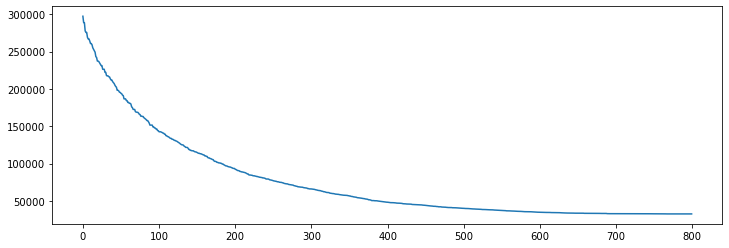

<Figure size 864x576 with 0 Axes>

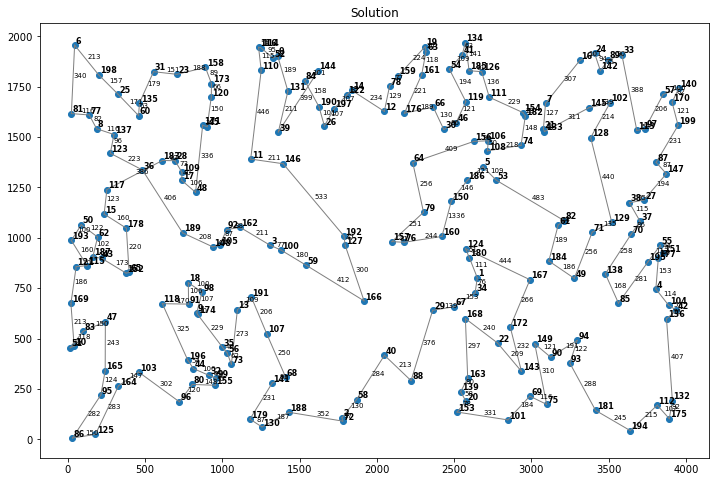

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.2 
 number_of_iterations = 800 
 tsp_objective_function: 33751.39545871701 
 best_permutation: [ 39 146  11  45 171  23  31 198   6  81  77   8 137  25 135  60 183  28
 109  17  36 123 117  15  62  50 193 121 115 187  43 178  65 152  47 118
  91 103 165  83 169  10  51  86 125  95 164  96  80  44 196  32 155  99
  56  35  73 141 179 130 188  68 107 191  13   9 174  98  18 189  48 148
 105  92 162   3 100  59 192 127 166  40  58  72   2  88  29 157  76 160
 124 180   1  34  67 168 172  22 163 139  20 153 101 143  69  75  93 181
 194 112 175 132 136  42 104   4 195 177 151  55 147  87 199 170 140  57
  97 113  27  38  37  70  85 138 129  71  82  61  49  94  90 149 167 184
  53  74  21 133 128 102  33  89 142  24  16 145   7 182 154 111 119  46
 156 106 108   5 186 150  79  64  30  66 126 185  41 134  54  19  63 161
 159 176  12  78  14 122 197  26 190 144  84 131   0  52 110 114 116 158
 173 120]


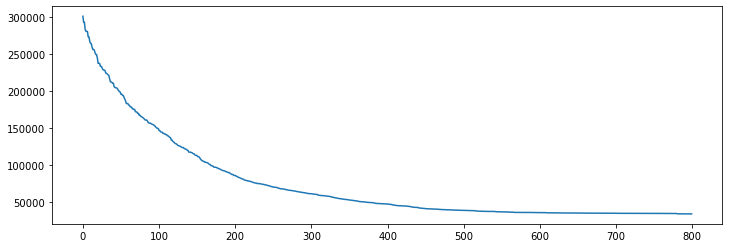

<Figure size 864x576 with 0 Axes>

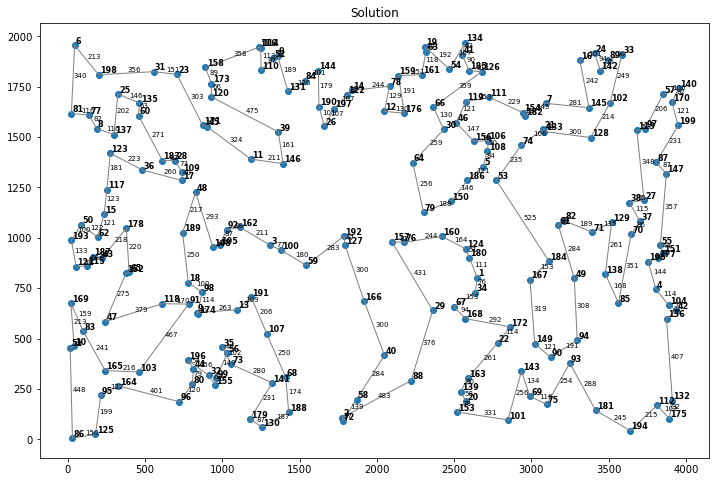

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.25 
 number_of_iterations = 800 
 tsp_objective_function: 33084.393859283926 
 best_permutation: [165  47  83  10  51 169 121 115 187  43  62 178  15  50 193  81   6 198
  31 135  60  25  77   8 137 123 117  36 183  28 109  17  45 171  23 158
 173 120 110 116 114  52   0  84 144 190  26 197 122  14  12  78 159  19
  63 161 176  66  30  46 119  54  41 134 185 126 111 156 106 108   5  53
 186 150  79  64 192 127 157  76 160 124 180   1  34  67  29 168  22 172
 143 149  90  93  94  85 138  49 167 184  61  82  71 128 145 102 133  21
  74 182 154   7  16  24 142  89  33  57 140 170 199  97 113  87 147  27
  37  38 129  70  55 151 177 195   4 104  42 136 132 175 112 194 181  75
  69 101 163 139  20 153  88  40 166  58  72   2  68 141 188 130 179  73
  56  35  13 191 107  59 100   3 146  39 131  11  48 189 148  92 162 105
  98  18  65 152 118  91   9 174 196  44  32  99 155  80  96 103 164  95
  86 125]


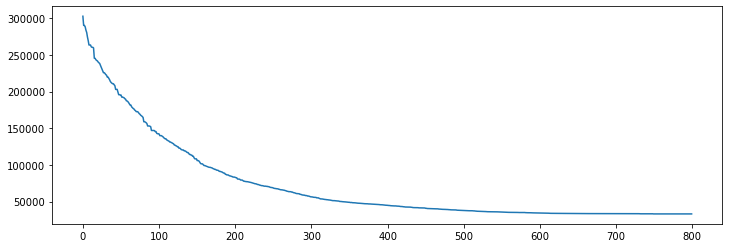

<Figure size 864x576 with 0 Axes>

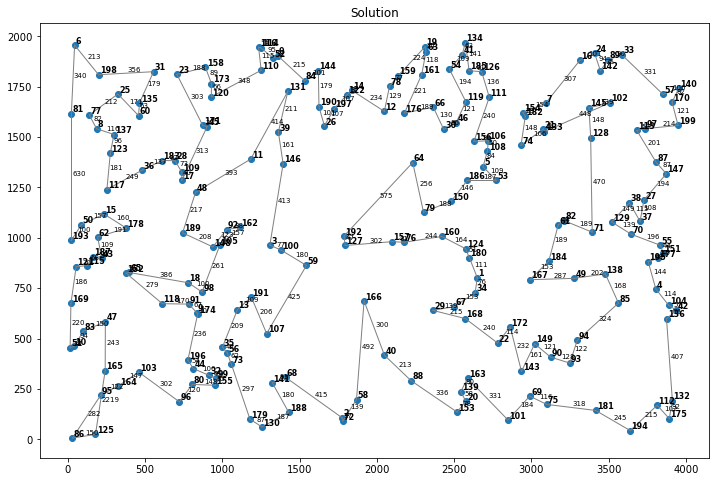

 population_size = 1000 
 crossover_probability = 0.95 
 mutation_probability = 0.3 
 number_of_iterations = 800 
 tsp_objective_function: 33021.39614350897 
 best_permutation: [ 72 188 130 179 141  68 107  13 191   3 162  92 105 148  48 189  18  98
   9 174  35  56  73  99 155  32  96  80  44 196  91 118  65 152 178  43
 187 115  47 103 164 125  86  95 165  51  10  83 169 121 193  50  62  15
 117  81  77   8 137 123  36 183  17 109  28  60 135  25 198   6  31  23
 171  45 120 173 158 116 114 110  52   0  84 144 190 122 197  26 131  39
  11 146 100  59 192 127 166  29 160 150 186  79  76 157  64 176  12  14
  78 159 161  63  19  54  41 134 185 126 111 119  66  30  46 156   5  53
 108 106  74 182 154   7  21 133 128 145 102 142  16  24  89  33 113  97
  57 140 170 199  87 147  27  37  38 129  70  55 151 177 195   4 104  42
 136 132 175 112 194 181  85 138  71  82  61  49 184 167  34   1 180 124
  67 168  22 172 149  94  93  90 143  69  75 101 153  20 139 163  88  40
  58   2]


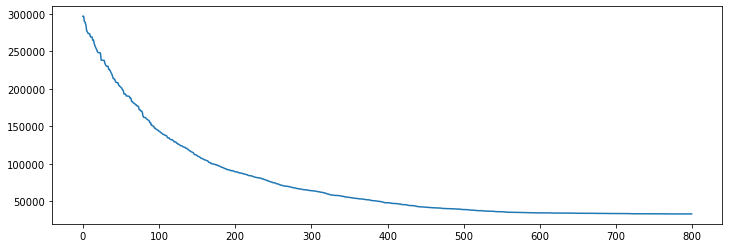

<Figure size 864x576 with 0 Axes>

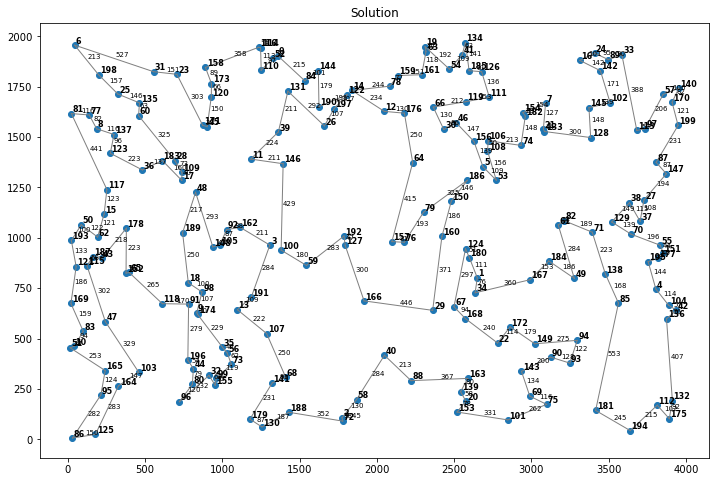

In [211]:
dist_matr = [kroA200_dist]
coords = kroA200_coords
num = [200]

pop_size = [1000]
cross_prob = [0.975, 0.9625, 0.95]
mut_prob = [0.2, 0.25, 0.3]
num_of_iter = [800]

for (n, d_matrix, pop, cross, mut, n_it) in itertools.product(num, dist_matr, 
                                            pop_size, cross_prob, mut_prob, num_of_iter):
    best_p, costs = SGA_PMX(n, d_matrix, population_size=pop, crossover_probability=cross, 
            mutation_probability=mut, number_of_iterations=n_it)
    print(" population_size =", pop, "\n crossover_probability =", cross,
          "\n mutation_probability =", mut, "\n number_of_iterations =", n_it,
          "\n tsp_objective_function:", tsp_objective_function(d_matrix, best_p), 
          "\n best_permutation:",best_p)
    plt.figure(figsize=(12,4))
    plt.plot(costs)
    plt.show()
    plot_path(d_matrix, coords, best_p)